In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import matplotlib.pyplot as plt
import seaborn as sns
import math

from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler

# import packages
import nfl_data_py as nfl
# load data
df_2022 = nfl.import_pbp_data([2022])
#df_players = nfl.import_rosters([2021])
df_teams = nfl.import_team_desc()

pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.options.mode.chained_assignment = None  # default='warn'

2022 done.
Downcasting floats.


In [2]:
game_data = pd.read_csv('/Users/cgiess/Downloads/nfl-big-data-bowl-2024/games.csv')
players = pd.read_csv('/Users/cgiess/Downloads/nfl-big-data-bowl-2024/players.csv')
plays = pd.read_csv('/Users/cgiess/Downloads/nfl-big-data-bowl-2024/plays.csv')
tackles = pd.read_csv('/Users/cgiess/Downloads/nfl-big-data-bowl-2024/tackles.csv')

plays['run_pass'] = np.where(plays['passResult'].notnull(),'pass','run')
plays = pd.merge(plays,game_data[['gameId','season','week']], how = 'left', on = ['gameId'])

In [3]:
week1 = pd.read_csv('/Users/cgiess/Downloads/nfl-big-data-bowl-2024/tracking_week_1.csv')
week2 = pd.read_csv('/Users/cgiess/Downloads/nfl-big-data-bowl-2024/tracking_week_2.csv')
week3 = pd.read_csv('/Users/cgiess/Downloads/nfl-big-data-bowl-2024/tracking_week_3.csv')
week4 = pd.read_csv('/Users/cgiess/Downloads/nfl-big-data-bowl-2024/tracking_week_4.csv')
week5 = pd.read_csv('/Users/cgiess/Downloads/nfl-big-data-bowl-2024/tracking_week_5.csv')
week6 = pd.read_csv('/Users/cgiess/Downloads/nfl-big-data-bowl-2024/tracking_week_6.csv')
week7 = pd.read_csv('/Users/cgiess/Downloads/nfl-big-data-bowl-2024/tracking_week_7.csv')
week8 = pd.read_csv('/Users/cgiess/Downloads/nfl-big-data-bowl-2024/tracking_week_8.csv')
week9 = pd.read_csv('/Users/cgiess/Downloads/nfl-big-data-bowl-2024/tracking_week_9.csv')
frames = [week1,week2,week3,week4,week5,week6,week7,week8,week9]
weeks = pd.concat(frames)
weeks['team'] = weeks['club']

In [4]:
game_data.head(5)

,gameId,season,week,gameDate,gameTimeEastern,homeTeamAbbr,visitorTeamAbbr,homeFinalScore,visitorFinalScore
0,2022090800,2022,1,09/08/2022,20:20:00,LA,BUF,10,31
1,2022091100,2022,1,09/11/2022,13:00:00,ATL,NO,26,27
2,2022091101,2022,1,09/11/2022,13:00:00,CAR,CLE,24,26
3,2022091102,2022,1,09/11/2022,13:00:00,CHI,SF,19,10
4,2022091103,2022,1,09/11/2022,13:00:00,CIN,PIT,20,23


In [5]:
players.head(5)

,nflId,height,weight,birthDate,collegeName,position,displayName
0,25511,6-4,225,1977-08-03,Michigan,QB,Tom Brady
1,29550,6-4,328,1982-01-22,Arkansas,T,Jason Peters
2,29851,6-2,225,1983-12-02,California,QB,Aaron Rodgers
3,30842,6-6,267,1984-05-19,UCLA,TE,Marcedes Lewis
4,33084,6-4,217,1985-05-17,Boston College,QB,Matt Ryan


In [6]:
tackles.head(5)

,gameId,playId,nflId,tackle,assist,forcedFumble,pff_missedTackle
0,2022090800,101,42816,1,0,0,0
1,2022090800,393,46232,1,0,0,0
2,2022090800,486,40166,1,0,0,0
3,2022090800,646,47939,1,0,0,0
4,2022090800,818,40107,1,0,0,0


In [7]:
plays.head(5)

,gameId,playId,ballCarrierId,ballCarrierDisplayName,playDescription,quarter,down,yardsToGo,possessionTeam,defensiveTeam,yardlineSide,yardlineNumber,gameClock,preSnapHomeScore,preSnapVisitorScore,passResult,passLength,penaltyYards,prePenaltyPlayResult,playResult,playNullifiedByPenalty,absoluteYardlineNumber,offenseFormation,defendersInTheBox,passProbability,preSnapHomeTeamWinProbability,preSnapVisitorTeamWinProbability,homeTeamWinProbabilityAdded,visitorTeamWinProbilityAdded,expectedPoints,expectedPointsAdded,foulName1,foulName2,foulNFLId1,foulNFLId2,run_pass,season,week
0,2022100908,3537,48723,Parker Hesse,(7:52) (Shotgun) M.Mariota pass short middle to P.Hesse to 50 for 9 yards (K.Neal).,4,1,10,ATL,TB,ATL,41,7:52,21,7,C,6.0,NaN,9,9,N,69,SHOTGUN,7.0,0.747284,0.976785,0.023215,-0.006110,0.006110,2.360609,0.981955,NaN,NaN,NaN,NaN,pass,2022,5
1,2022091103,3126,52457,Chase Claypool,(7:38) (Shotgun) C.Claypool right end to PIT 37 for 3 yards (C.Awuzie).,4,1,10,PIT,CIN,PIT,34,7:38,14,20,NaN,NaN,NaN,3,3,N,76,SHOTGUN,7.0,0.416454,0.160485,0.839515,-0.010865,0.010865,1.733344,-0.263424,NaN,NaN,NaN,NaN,run,2022,1
2,2022091111,1148,42547,Darren Waller,(8:57) D.Carr pass short middle to D.Waller to LV 45 for 15 yards (N.Adderley).,2,2,5,LV,LAC,LV,30,8:57,10,3,C,11.0,NaN,15,15,N,40,I_FORM,6.0,0.267933,0.756661,0.243339,-0.037409,0.037409,1.312855,1.133666,NaN,NaN,NaN,NaN,pass,2022,1
3,2022100212,2007,46461,Mike Boone,(13:12) M.Boone left tackle to DEN 44 for 7 yards (J.Abram; D.Deablo).,3,2,10,DEN,LV,DEN,37,13:12,19,16,NaN,NaN,NaN,7,7,N,47,SINGLEBACK,6.0,0.592704,0.620552,0.379448,-0.002451,0.002451,1.641006,-0.043580,NaN,NaN,NaN,NaN,run,2022,4
4,2022091900,1372,47857,Devin Singletary,(8:33) D.Singletary right guard to TEN 32 for 3 yards (N.Jones; O.Adeniyi). TEN-O.Adeniyi was injured during the play. His return is Questionable. O.Adeniyi walks off.,2,1,10,BUF,TEN,TEN,35,8:33,7,7,NaN,NaN,NaN,3,3,N,75,I_FORM,7.0,0.470508,0.836290,0.163710,0.001053,-0.001053,3.686428,-0.167903,NaN,NaN,NaN,NaN,run,2022,2


In [206]:
players.head(5)

,nflId,height,weight,birthDate,collegeName,position,displayName
0,25511,6-4,225,1977-08-03,Michigan,QB,Tom Brady
1,29550,6-4,328,1982-01-22,Arkansas,T,Jason Peters
2,29851,6-2,225,1983-12-02,California,QB,Aaron Rodgers
3,30842,6-6,267,1984-05-19,UCLA,TE,Marcedes Lewis
4,33084,6-4,217,1985-05-17,Boston College,QB,Matt Ryan


In [207]:
possession = pd.merge(plays, game_data, how='left', left_on=['gameId'], right_on=['gameId'])
possession = possession[['gameId','playId','possessionTeam','homeTeamAbbr','visitorTeamAbbr','yardlineNumber','yardlineSide']]
possession['possessionTeam_alt'] = "home"
possession.loc[possession.possessionTeam != possession.homeTeamAbbr, 'possessionTeam_alt'] = "away"

#week1_v2 = pd.merge(week1, possession, how='left', left_on=['gameId','playId'], right_on=['gameId','playId'])
week1_v2 = pd.merge(weeks, possession, how='left', left_on=['gameId','playId'], right_on=['gameId','playId'])
week1_v2['PlayerTeam'] =week1_v2['team']
week1_v2['possessionTeam'] =week1_v2['possessionTeam_alt']
pt_conditions = [
    ((week1_v2['team'] == 'football')),
    ((week1_v2['team'] == week1_v2['homeTeamAbbr'])),
    ((week1_v2['team'] == week1_v2['visitorTeamAbbr'])),
    ]
pt_values = ['football','home','away']

week1_v2['PlayerTeam2'] = np.select(pt_conditions, pt_values)

week1_v3 = pd.merge(week1_v2, players[['nflId','position','weight']], how='left', left_on=['nflId'], right_on=['nflId'])
week1_v3['displayName'] = np.where(week1_v3['team'] == 'football','Football',week1_v3['displayName'])
week1_v3['possessionTeam_alt'] = np.where(week1_v3['team'] == 'football','football',week1_v3['possessionTeam_alt'])

week1_v3 = week1_v3.rename(columns={'position': 'position','team': 'team2','PlayerTeam2':'team'})
week1_v3.head(1)

,gameId,playId,nflId,displayName,frameId,time,jerseyNumber,club,playDirection,x,y,s,a,dis,o,dir,event,team2,possessionTeam,homeTeamAbbr,visitorTeamAbbr,yardlineNumber,yardlineSide,possessionTeam_alt,PlayerTeam,team,position,weight
0,2022090800,56,35472.0,Rodger Saffold,1,2022-09-08 20:24:05.200000,76.0,BUF,left,88.37,27.27,1.62,1.15,0.16,231.74,147.9,NaN,BUF,away,LA,BUF,25,BUF,away,BUF,away,G,325.0


In [208]:
W = week1_v3
W['Dir_rad'] = np.mod(90 - W.dir, 360) * math.pi/180.0
W['ToLeft'] = W.playDirection == "left"
W['TeamOnOffense'] = "home"
#W.loc[W.possessionTeam != W.homeTeamAbbr, 'TeamOnOffense'] = "away" changed due to data
W.loc[W.team2 != W.homeTeamAbbr, 'TeamOnOffense'] = "away"
W['IsOnOffense'] = W.team == W.TeamOnOffense # Is player on offense?
W['YardLine_std'] = 100 - W.yardlineNumber
W['yardlineSide_ha'] = np.where(W['yardlineSide'] == W['homeTeamAbbr'],'home','away')
W.loc[W.yardlineSide_ha.fillna('') == W.possessionTeam,'YardLine_std'] = W.loc[W.yardlineSide_ha.fillna('') == W.possessionTeam,  'yardlineNumber'] #changed due to data

#W.loc[W.yardlineSide.fillna('') == W.team2,'YardLine_std'] = W.loc[W.yardlineSide.fillna('') == W.team2,  'yardlineNumber']
W['X_std'] = W.x
W.loc[W.ToLeft, 'X_std'] = 120 - W.loc[W.ToLeft, 'x'] 
W['Y_std'] = W.y
W.loc[W.ToLeft, 'Y_std'] = 160/3 - W.loc[W.ToLeft, 'y'] 
#W['Orientation_std'] = -90 + W.Orientation
#W.loc[W.ToLeft, 'Orientation_std'] = np.mod(180 + W.loc[W.ToLeft, 'Orientation_std'], 360)
W['Dir_std'] = W.Dir_rad
W.loc[W.ToLeft, 'Dir_std'] = np.mod(np.pi + W.loc[W.ToLeft, 'Dir_rad'], 2*np.pi)
W['dx'] = round(W['s']*np.cos(W['Dir_std']),2)
W['dy'] = round(W['s']*np.sin(W['Dir_std']),2)
W['X_std'] = round(W['X_std'],2)
W['Y_std'] = round(W['Y_std'],2)
#W['Orientation_rad'] = np.mod(W.o, 360) * math.pi/180.0
W['Orientation_rad'] = np.mod(-W.o + 90, 360) * math.pi/180.0
W['Orientation_std'] = W.Orientation_rad
W.loc[W.ToLeft, 'Orientation_std'] = np.mod(np.pi + W.loc[W.ToLeft, 'Orientation_rad'], 2*np.pi)
W['Orientation_deg_std'] = np.rad2deg(W['Orientation_std'])
W['Dir_deg_std'] = np.rad2deg(W['Dir_std'])
W['MPH'] = W['s'] / 0.488889
# secondary modifications
W['time']= W['time']+'Z'

Standardised  = W
Standardised['X_std_true'] = Standardised['X_std'] - (Standardised['YardLine_std']+10) # want to centre X axis on 0 for consistency
Standardised['Y_std_true'] = Standardised['Y_std']

ball_snap_frame_min = Standardised[Standardised['event'].isin(['autoevent_ballsnap','ball_snap'])].groupby(['gameId','playId']).agg({'frameId':'min'})
ball_snap_frame_min.reset_index( drop=False, inplace=True )
ball_snap_frame_min = ball_snap_frame_min.rename(columns={'frameId': 'min_ball_snap_frameId'})
ball_snap_frame_max = Standardised[Standardised['event'].isin(['autoevent_ballsnap','ball_snap'])].groupby(['gameId','playId']).agg({'frameId':'max'})
ball_snap_frame_max.reset_index( drop=False, inplace=True )
ball_snap_frame_max = ball_snap_frame_max.rename(columns={'frameId': 'max_ball_snap_frameId'})

ball_snap_frame_min['max_ball_snap_frameId'] = ball_snap_frame_max['max_ball_snap_frameId']
ball_snap_frame_min['ball_snap_diff'] = ball_snap_frame_min['max_ball_snap_frameId'] - ball_snap_frame_min['min_ball_snap_frameId']
ball_snap_frame_min['ball_snap_frameId'] = np.where(ball_snap_frame_min['ball_snap_diff'] > 7,ball_snap_frame_min['max_ball_snap_frameId'],ball_snap_frame_min['min_ball_snap_frameId'] )
ball_snap_frame = ball_snap_frame_min[['gameId','playId','ball_snap_frameId']]

Standardised = pd.merge(Standardised, ball_snap_frame, how='left', on = ['gameId','playId'])
Standardised['u_event'] = Standardised['gameId'].map(str) + '|' + Standardised['playId'].map(str)

column_to_move = Standardised.pop('u_event')
# insert column with insert(location, column_name, column_value)
Standardised.insert(2, 'u_event', column_to_move)

Standardised.head(3)

,gameId,playId,u_event,nflId,displayName,frameId,time,jerseyNumber,club,playDirection,x,y,s,a,dis,o,dir,event,team2,possessionTeam,homeTeamAbbr,visitorTeamAbbr,yardlineNumber,yardlineSide,possessionTeam_alt,PlayerTeam,team,position,weight,Dir_rad,ToLeft,TeamOnOffense,IsOnOffense,YardLine_std,yardlineSide_ha,X_std,Y_std,Dir_std,dx,dy,Orientation_rad,Orientation_std,Orientation_deg_std,Dir_deg_std,MPH,X_std_true,Y_std_true,ball_snap_frameId
0,2022090800,56,2022090800|56,35472.0,Rodger Saffold,1,2022-09-08 20:24:05.200000Z,76.0,BUF,left,88.37,27.27,1.62,1.15,0.16,231.74,147.90,NaN,BUF,away,LA,BUF,25,BUF,away,BUF,away,G,325.0,5.272640,True,away,True,25,away,31.63,26.06,2.131047,-0.86,1.37,3.809356,0.667763,38.26,122.10,3.313636,-3.37,26.06,NaN
1,2022090800,56,2022090800|56,35472.0,Rodger Saffold,2,2022-09-08 20:24:05.299999Z,76.0,BUF,left,88.47,27.13,1.67,0.61,0.17,230.98,148.53,pass_arrived,BUF,away,LA,BUF,25,BUF,away,BUF,away,G,325.0,5.261644,True,away,True,25,away,31.53,26.20,2.120051,-0.87,1.42,3.822620,0.681027,39.02,121.47,3.415908,-3.47,26.20,NaN
2,2022090800,56,2022090800|56,35472.0,Rodger Saffold,3,2022-09-08 20:24:05.400000Z,76.0,BUF,left,88.56,27.01,1.57,0.49,0.15,230.98,147.05,NaN,BUF,away,LA,BUF,25,BUF,away,BUF,away,G,325.0,5.287475,True,away,True,25,away,31.44,26.32,2.145882,-0.85,1.32,3.822620,0.681027,39.02,122.95,3.211363,-3.56,26.32,NaN


# First Attempt

# Rushing play EPA

In [30]:
all_runs = plays[plays['passResult'].isnull()]
df_2022['play_id'] = df_2022['play_id'].astype(int)
df_2022['old_game_id'] = df_2022['old_game_id'].astype(int)
all_runs = pd.merge(all_runs, df_2022[['old_game_id','play_id','yardline_100','run_location','run_gap','fumble','home_team','away_team','home_coach','away_coach']], how = 'left', left_on = ['gameId','playId'], right_on = ['old_game_id','play_id'])
#all_runs = all_runs[all_runs['absoluteYardlineNumber'] <= 80] # hopefully exlcude endzone TD bias
all_runs = all_runs[all_runs['foulName1'].isnull()] # hopefully exlcude penalties
all_runs = all_runs[all_runs['penaltyYards'].isnull()] # hopefully exlcude penalties
all_runs = all_runs[all_runs['fumble'] != 1] # hopefully exlcude penalties

all_runs['run_gap'] = np.where(all_runs['run_location'] == 'middle', 'middle', all_runs['run_gap'])

def run_loc_simple(all_runs):

    if (all_runs['run_location'] == 'left') & (all_runs['run_gap'] == 'end'):
        return 'a. L End'
    elif (all_runs['run_location'] == 'left') & (all_runs['run_gap'] == 'tackle'):
        return 'b. L Tackle'
    elif (all_runs['run_location'] == 'left') & (all_runs['run_gap'] == 'guard'):
        return 'c. L Guard'
    elif (all_runs['run_location'] == 'middle'):
        return 'd. Middle'
    
    elif (all_runs['run_location'] == 'right') & (all_runs['run_gap'] == 'guard'):
        return 'e. R Guard'
    elif (all_runs['run_location'] == 'right') & (all_runs['run_gap'] == 'tackle'):
        return 'f. R Tackle'
    elif (all_runs['run_location'] == 'right') & (all_runs['run_gap'] == 'end'):
        return 'g. R End'

    
all_runs['run_loc_simple'] = all_runs.apply(run_loc_simple, axis = 1)
all_runs['possession_coach'] = np.where(all_runs['possessionTeam'] == all_runs['home_team'],all_runs['home_coach'],all_runs['away_coach'])
all_runs['u_event'] = all_runs['gameId'].map(str) + '|' + all_runs['playId'].map(str)

all_runs = pd.merge(all_runs,players[['nflId','position']], how = 'left', left_on = ['ballCarrierId'], right_on = ['nflId'])
#all_runs = all_runs[all_runs['position'] != 'QB'] # exclude QB scrambles or sneaks
#all_runs = all_runs[~all_runs['ballCarrierDisplayName'].isin(['Taysom Hill'])] # exclude QB scrambles or sneaks
all_runs['u_event'] = all_runs['gameId'].map(str) + '|' + all_runs['playId'].map(str)

column_to_move = all_runs.pop('u_event')
# insert column with insert(location, column_name, column_value)
all_runs.insert(2, 'u_event', column_to_move)
all_runs.head(5)

,gameId,playId,u_event,ballCarrierId,ballCarrierDisplayName,playDescription,quarter,down,yardsToGo,possessionTeam,defensiveTeam,yardlineSide,yardlineNumber,gameClock,preSnapHomeScore,preSnapVisitorScore,passResult,passLength,penaltyYards,prePenaltyPlayResult,playResult,playNullifiedByPenalty,absoluteYardlineNumber,offenseFormation,defendersInTheBox,passProbability,preSnapHomeTeamWinProbability,preSnapVisitorTeamWinProbability,homeTeamWinProbabilityAdded,visitorTeamWinProbilityAdded,expectedPoints,expectedPointsAdded,foulName1,foulName2,foulNFLId1,foulNFLId2,run_pass,season,week,old_game_id,play_id,yardline_100,run_location,run_gap,fumble,home_team,away_team,home_coach,away_coach,run_loc_simple,possession_coach,nflId,position
0,2022091103,3126,2022091103|3126,52457,Chase Claypool,(7:38) (Shotgun) C.Claypool right end to PIT 37 for 3 yards (C.Awuzie).,4,1,10,PIT,CIN,PIT,34,7:38,14,20,NaN,NaN,NaN,3,3,N,76,SHOTGUN,7.0,0.416454,0.160485,0.839515,-0.010865,0.010865,1.733344,-0.263424,NaN,NaN,NaN,NaN,run,2022,1,2022091103,3126,66.0,right,end,0.0,CIN,PIT,Zac Taylor,Mike Tomlin,g. R End,Mike Tomlin,52457,WR
1,2022100212,2007,2022100212|2007,46461,Mike Boone,(13:12) M.Boone left tackle to DEN 44 for 7 yards (J.Abram; D.Deablo).,3,2,10,DEN,LV,DEN,37,13:12,19,16,NaN,NaN,NaN,7,7,N,47,SINGLEBACK,6.0,0.592704,0.620552,0.379448,-0.002451,0.002451,1.641006,-0.043580,NaN,NaN,NaN,NaN,run,2022,4,2022100212,2007,63.0,left,tackle,0.0,LV,DEN,Josh McDaniels,Nathaniel Hackett,b. L Tackle,Nathaniel Hackett,46461,RB
2,2022091900,1372,2022091900|1372,47857,Devin Singletary,(8:33) D.Singletary right guard to TEN 32 for 3 yards (N.Jones; O.Adeniyi). TEN-O.Adeniyi was injured during the play. His return is Questionable. O.Adeniyi walks off.,2,1,10,BUF,TEN,TEN,35,8:33,7,7,NaN,NaN,NaN,3,3,N,75,I_FORM,7.0,0.470508,0.836290,0.163710,0.001053,-0.001053,3.686428,-0.167903,NaN,NaN,NaN,NaN,run,2022,2,2022091900,1372,35.0,right,guard,0.0,BUF,TEN,Sean McDermott,Mike Vrabel,e. R Guard,Sean McDermott,47857,RB
3,2022102310,56,2022102310|56,46377,Jeffery Wilson,(15:00) J.Wilson left tackle to SF 32 for 7 yards (W.Gay; J.Reid).,1,1,10,SF,KC,SF,25,15:00,0,0,NaN,NaN,NaN,7,7,N,85,SINGLEBACK,7.0,0.497866,0.568721,0.431279,0.001382,-0.001382,1.298699,0.282340,NaN,NaN,NaN,NaN,run,2022,7,2022102310,56,75.0,left,tackle,0.0,SF,KC,Kyle Shanahan,Andy Reid,b. L Tackle,Kyle Shanahan,46377,RB
4,2022102310,1318,2022102310|1318,41325,Jerick McKinnon,(10:31) (Shotgun) J.McKinnon left guard to KC 49 for 9 yards (T.Moore).,2,1,10,KC,SF,KC,40,10:31,13,7,NaN,NaN,NaN,9,9,N,70,SHOTGUN,6.0,0.496857,0.679606,0.320394,-0.015303,0.015303,1.827773,0.733410,NaN,NaN,NaN,NaN,run,2022,7,2022102310,1318,60.0,left,guard,0.0,SF,KC,Kyle Shanahan,Andy Reid,c. L Guard,Andy Reid,41325,RB


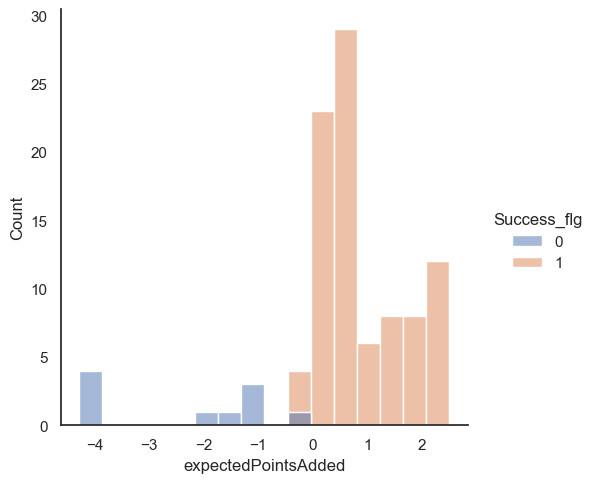

In [214]:
c1 = (all_runs['yardsToGo'].isin([1]))
c2 = (all_runs['offenseFormation'].isin(['SINGLEBACK','JUMBO','I_FORM']))
c3 = (all_runs['position'] == 'QB')

short_qb_run = all_runs[c1&c2&c3]
short_qb_run['Success_flg'] = np.where((short_qb_run['playResult'] >= short_qb_run['yardsToGo'])&(short_qb_run['expectedPointsAdded'] >= -0.5), 1,0)

sns.displot(data = short_qb_run, x = 'expectedPointsAdded', hue = 'Success_flg')

In [99]:
qb_sneak_results = short_qb_run.groupby(['possessionTeam']).agg({'u_event':'nunique','Success_flg':'sum'}).reset_index()
qb_sneak_results = qb_sneak_results.sort_values(by = 'u_event', ascending = False)

total_qb_sneak_results = qb_sneak_results['u_event'].sum()
qb_sneak_results['Success_pct'] =  qb_sneak_results['Success_flg'] / qb_sneak_results['u_event']
qb_sneak_results['total_league_sneaks'] = total_qb_sneak_results

qb_sneak_results['cum_u_event'] = qb_sneak_results['u_event'].cumsum()
qb_sneak_results['pct_of_league_sneaks'] = qb_sneak_results['cum_u_event'] / qb_sneak_results['total_league_sneaks']
qb_sneak_results

,possessionTeam,u_event,Success_flg,Success_pct,total_league_sneaks,cum_u_event,pct_of_league_sneaks
18,PHI,15,14,0.933333,100,15,0.15
6,CLE,13,12,0.923077,100,28,0.28
5,CIN,9,9,1.000000,100,37,0.37
10,JAX,7,6,0.857143,100,44,0.44
21,SF,6,6,1.000000,100,50,0.50
2,BUF,6,6,1.000000,100,56,0.56
4,CHI,6,6,1.000000,100,62,0.62
19,PIT,5,5,1.000000,100,67,0.67
8,DEN,4,3,0.750000,100,71,0.71
16,NYG,3,3,1.000000,100,74,0.74


In [90]:
qb_sneak_results = short_qb_run.agg({'u_event':'nunique','Success_flg':'sum'})
qb_sneak_results['Success_pct'] =  qb_sneak_results['Success_flg'] / qb_sneak_results['u_event']
qb_sneak_results

u_event        100.0
Success_flg     90.0
Success_pct      0.9
dtype: float64

In [566]:
print((90-14) / (100-15))

0.8941176470588236


In [568]:
all_runs.groupby(['week']).agg({'u_event':'nunique'})

,u_event
week,
1,674
2,676
3,692
4,733
5,724
6,633
7,640
8,700
9,602


In [100]:
qb_sneak_results = short_qb_run.groupby(['defensiveTeam']).agg({'u_event':'nunique','Success_flg':'sum'}).reset_index()
qb_sneak_results = qb_sneak_results.sort_values(by = 'u_event', ascending = False)

total_qb_sneak_results = qb_sneak_results['u_event'].sum()
qb_sneak_results['Success_pct'] =  qb_sneak_results['Success_flg'] / qb_sneak_results['u_event']
qb_sneak_results['total_league_sneaks'] = total_qb_sneak_results

qb_sneak_results['cum_u_event'] = qb_sneak_results['u_event'].cumsum()
qb_sneak_results['pct_of_league_sneaks'] = qb_sneak_results['cum_u_event'] / qb_sneak_results['total_league_sneaks']
qb_sneak_results

,defensiveTeam,u_event,Success_flg,Success_pct,total_league_sneaks,cum_u_event,pct_of_league_sneaks
23,NYJ,9,9,1.000000,100,9,0.09
0,ARI,8,6,0.750000,100,17,0.17
2,BAL,7,6,0.857143,100,24,0.24
15,KC,6,6,1.000000,100,30,0.30
14,JAX,6,5,0.833333,100,36,0.36
1,ATL,5,5,1.000000,100,41,0.41
4,CAR,5,5,1.000000,100,46,0.46
25,PIT,4,3,0.750000,100,50,0.50
28,WAS,3,3,1.000000,100,53,0.53
27,TB,3,3,1.000000,100,56,0.56


# All QB sneak tracking

In [209]:
Standardised.head(5)

,gameId,playId,u_event,nflId,displayName,frameId,time,jerseyNumber,club,playDirection,x,y,s,a,dis,o,dir,event,team2,possessionTeam,homeTeamAbbr,visitorTeamAbbr,yardlineNumber,yardlineSide,possessionTeam_alt,PlayerTeam,team,position,weight,Dir_rad,ToLeft,TeamOnOffense,IsOnOffense,YardLine_std,yardlineSide_ha,X_std,Y_std,Dir_std,dx,dy,Orientation_rad,Orientation_std,Orientation_deg_std,Dir_deg_std,MPH,X_std_true,Y_std_true,ball_snap_frameId
0,2022090800,56,2022090800|56,35472.0,Rodger Saffold,1,2022-09-08 20:24:05.200000Z,76.0,BUF,left,88.37,27.27,1.62,1.15,0.16,231.74,147.90,NaN,BUF,away,LA,BUF,25,BUF,away,BUF,away,G,325.0,5.272640,True,away,True,25,away,31.63,26.06,2.131047,-0.86,1.37,3.809356,0.667763,38.26,122.10,3.313636,-3.37,26.06,NaN
1,2022090800,56,2022090800|56,35472.0,Rodger Saffold,2,2022-09-08 20:24:05.299999Z,76.0,BUF,left,88.47,27.13,1.67,0.61,0.17,230.98,148.53,pass_arrived,BUF,away,LA,BUF,25,BUF,away,BUF,away,G,325.0,5.261644,True,away,True,25,away,31.53,26.20,2.120051,-0.87,1.42,3.822620,0.681027,39.02,121.47,3.415908,-3.47,26.20,NaN
2,2022090800,56,2022090800|56,35472.0,Rodger Saffold,3,2022-09-08 20:24:05.400000Z,76.0,BUF,left,88.56,27.01,1.57,0.49,0.15,230.98,147.05,NaN,BUF,away,LA,BUF,25,BUF,away,BUF,away,G,325.0,5.287475,True,away,True,25,away,31.44,26.32,2.145882,-0.85,1.32,3.822620,0.681027,39.02,122.95,3.211363,-3.56,26.32,NaN
3,2022090800,56,2022090800|56,35472.0,Rodger Saffold,4,2022-09-08 20:24:05.500000Z,76.0,BUF,left,88.64,26.90,1.44,0.89,0.14,232.38,145.42,NaN,BUF,away,LA,BUF,25,BUF,away,BUF,away,G,325.0,5.315924,True,away,True,25,away,31.36,26.43,2.174331,-0.82,1.19,3.798186,0.656593,37.62,124.58,2.945454,-3.64,26.43,NaN
4,2022090800,56,2022090800|56,35472.0,Rodger Saffold,5,2022-09-08 20:24:05.599999Z,76.0,BUF,left,88.72,26.80,1.29,1.24,0.13,233.36,141.95,NaN,BUF,away,LA,BUF,25,BUF,away,BUF,away,G,325.0,5.376487,True,away,True,25,away,31.28,26.53,2.234894,-0.80,1.02,3.781081,0.639489,36.64,128.05,2.638636,-3.72,26.53,NaN


In [121]:
short_qb_run.head(5)

,gameId,playId,u_event,ballCarrierId,ballCarrierDisplayName,playDescription,quarter,down,yardsToGo,possessionTeam,defensiveTeam,yardlineSide,yardlineNumber,gameClock,preSnapHomeScore,preSnapVisitorScore,passResult,passLength,penaltyYards,prePenaltyPlayResult,playResult,playNullifiedByPenalty,absoluteYardlineNumber,offenseFormation,defendersInTheBox,passProbability,preSnapHomeTeamWinProbability,preSnapVisitorTeamWinProbability,homeTeamWinProbabilityAdded,visitorTeamWinProbilityAdded,expectedPoints,expectedPointsAdded,foulName1,foulName2,foulNFLId1,foulNFLId2,run_pass,season,week,old_game_id,play_id,yardline_100,run_location,run_gap,fumble,home_team,away_team,home_coach,away_coach,run_loc_simple,possession_coach,nflId,position,Success_flg
7,2022102304,3401,2022102304|3401,53430,Trevor Lawrence,(11:30) T.Lawrence up the middle to NYG 20 for no gain (J.Smith; J.Love).,4,4,1,JAX,NYG,NYG,20,11:30,17,13,NaN,NaN,NaN,0,0,N,90,I_FORM,9.0,0.153301,0.812003,0.187997,-0.095771,0.095771,2.986392,-4.255993,NaN,NaN,NaN,NaN,run,2022,7,2022102304,3401,20.0,middle,middle,0.0,JAX,NYG,Doug Pederson,Brian Daboll,d. Middle,Doug Pederson,53430,QB,0
101,2022091200,716,2022091200|716,39987,Geno Smith,"(3:00) G.Smith up the middle to DEN 7 for no gain (D.Jones, J.Simmons). Official measurement",1,4,1,SEA,DEN,DEN,7,3:00,7,3,NaN,NaN,NaN,0,0,N,103,SINGLEBACK,8.0,0.320479,0.589820,0.410180,-0.102650,0.102650,4.337419,-4.280289,NaN,NaN,NaN,NaN,run,2022,1,2022091200,716,7.0,middle,middle,0.0,SEA,DEN,Pete Carroll,Nathaniel Hackett,d. Middle,Pete Carroll,39987,QB,0
260,2022102300,244,2022102300|244,43380,Jacoby Brissett,(10:00) J.Brissett up the middle to BLT 8 for 1 yard (J.Pierre-Paul).,1,4,1,CLE,BAL,BAL,9,10:00,0,0,NaN,NaN,NaN,1,1,N,101,SINGLEBACK,9.0,0.347194,0.467326,0.532674,-0.029708,0.029708,4.282091,1.295318,NaN,NaN,NaN,NaN,run,2022,7,2022102300,244,9.0,middle,middle,0.0,BAL,CLE,John Harbaugh,Kevin Stefanski,d. Middle,Kevin Stefanski,43380,QB,1
294,2022091800,1688,2022091800|1688,52413,Tua Tagovailoa,(2:00) T.Tagovailoa up the middle to MIA 46 for 1 yard (J.Madubuike).,2,4,1,MIA,BAL,MIA,45,2:00,21,7,NaN,NaN,NaN,1,1,N,55,SINGLEBACK,8.0,0.162111,0.875117,0.124883,-0.015501,0.015501,0.703475,1.317787,NaN,NaN,NaN,NaN,run,2022,2,2022091800,1688,55.0,middle,middle,0.0,BAL,MIA,John Harbaugh,Mike McDaniel,d. Middle,Mike McDaniel,52413,QB,1
301,2022091102,3652,2022091102|3652,53432,Trey Lance,(6:32) T.Lance right guard to SF 22 for 3 yards (N.Morrow).,4,3,1,SF,CHI,SF,19,6:32,19,10,NaN,NaN,NaN,3,3,N,29,SINGLEBACK,8.0,0.302846,0.902265,0.097735,0.001287,-0.001287,0.270198,0.438432,NaN,NaN,NaN,NaN,run,2022,1,2022091102,3652,81.0,right,guard,0.0,CHI,SF,Matt Eberflus,Kyle Shanahan,e. R Guard,Kyle Shanahan,53432,QB,1


In [215]:
all_runs_tracking = pd.merge(Standardised, all_runs[['u_event']], how = 'inner', on = ['u_event'])

# QB start location
c1 = (all_runs_tracking['event'] == 'ball_snap')
c2 = (all_runs_tracking['position'] == 'QB')
c3 = (all_runs_tracking['IsOnOffense'] == True)

qb_starting_snap = all_runs_tracking[c1&c2&c3][['u_event','Y_std_true']]
qb_starting_snap = qb_starting_snap.rename(columns={'Y_std_true': 'QB_start_Y_std_true'})

all_runs_tracking = pd.merge(all_runs_tracking, qb_starting_snap, how = 'left', on = ['u_event'])
all_runs_tracking['Y_std_true_nml'] = all_runs_tracking['QB_start_Y_std_true'] - all_runs_tracking['Y_std_true']

all_runs_tracking.head(5)

,gameId,playId,u_event,nflId,displayName,frameId,time,jerseyNumber,club,playDirection,x,y,s,a,dis,o,dir,event,team2,possessionTeam,homeTeamAbbr,visitorTeamAbbr,yardlineNumber,yardlineSide,possessionTeam_alt,PlayerTeam,team,position,weight,Dir_rad,ToLeft,TeamOnOffense,IsOnOffense,YardLine_std,yardlineSide_ha,X_std,Y_std,Dir_std,dx,dy,Orientation_rad,Orientation_std,Orientation_deg_std,Dir_deg_std,MPH,X_std_true,Y_std_true,ball_snap_frameId,QB_start_Y_std_true,Y_std_true_nml
0,2022090800,101,2022090800|101,35472.0,Rodger Saffold,1,2022-09-08 20:25:08.200000Z,76.0,BUF,left,73.13,27.64,0.01,0.01,0.00,267.95,182.22,NaN,BUF,away,LA,BUF,38,BUF,away,BUF,away,G,325.0,4.673643,True,away,True,38,away,46.87,25.69,1.532050,0.0,0.01,3.177372,0.035779,2.05,87.78,0.020455,-1.13,25.69,6.0,23.77,-1.92
1,2022090800,101,2022090800|101,35472.0,Rodger Saffold,2,2022-09-08 20:25:08.299999Z,76.0,BUF,left,73.13,27.64,0.01,0.01,0.00,267.95,182.56,NaN,BUF,away,LA,BUF,38,BUF,away,BUF,away,G,325.0,4.667709,True,away,True,38,away,46.87,25.69,1.526116,0.0,0.01,3.177372,0.035779,2.05,87.44,0.020455,-1.13,25.69,6.0,23.77,-1.92
2,2022090800,101,2022090800|101,35472.0,Rodger Saffold,3,2022-09-08 20:25:08.400000Z,76.0,BUF,left,73.13,27.63,0.01,0.01,0.00,267.95,182.15,NaN,BUF,away,LA,BUF,38,BUF,away,BUF,away,G,325.0,4.674864,True,away,True,38,away,46.87,25.70,1.533272,0.0,0.01,3.177372,0.035779,2.05,87.85,0.020455,-1.13,25.70,6.0,23.77,-1.93
3,2022090800,101,2022090800|101,35472.0,Rodger Saffold,4,2022-09-08 20:25:08.500000Z,76.0,BUF,left,73.13,27.64,0.00,0.01,0.01,274.37,179.54,NaN,BUF,away,LA,BUF,38,BUF,away,BUF,away,G,325.0,4.720417,True,away,True,38,away,46.87,25.69,1.578825,-0.0,0.00,3.065322,6.206914,355.63,90.46,0.000000,-1.13,25.69,6.0,23.77,-1.92
4,2022090800,101,2022090800|101,35472.0,Rodger Saffold,5,2022-09-08 20:25:08.599999Z,76.0,BUF,left,73.13,27.65,0.00,0.25,0.01,274.95,1.03,NaN,BUF,away,LA,BUF,38,BUF,away,BUF,away,G,325.0,1.552819,True,away,True,38,away,46.87,25.68,4.694412,-0.0,-0.00,3.055199,6.196792,355.05,268.97,0.000000,-1.13,25.68,6.0,23.77,-1.91


In [216]:
QB_sneak_tracking = pd.merge(all_runs_tracking, short_qb_run[['u_event']], how = 'inner', on = ['u_event'])
QB_sneak_tracking.head(5)

,gameId,playId,u_event,nflId,displayName,frameId,time,jerseyNumber,club,playDirection,x,y,s,a,dis,o,dir,event,team2,possessionTeam,homeTeamAbbr,visitorTeamAbbr,yardlineNumber,yardlineSide,possessionTeam_alt,PlayerTeam,team,position,weight,Dir_rad,ToLeft,TeamOnOffense,IsOnOffense,YardLine_std,yardlineSide_ha,X_std,Y_std,Dir_std,dx,dy,Orientation_rad,Orientation_std,Orientation_deg_std,Dir_deg_std,MPH,X_std_true,Y_std_true,ball_snap_frameId,QB_start_Y_std_true,Y_std_true_nml
0,2022091101,2431,2022091101|2431,41264.0,Joel Bitonio,1,2022-09-11 15:00:14.599999Z,75.0,CLE,right,56.26,25.22,0.02,0.04,0.01,69.32,264.11,NaN,CLE,away,CAR,CLE,48,CLE,away,CLE,away,G,320.0,3.244393,False,away,True,48,away,56.26,25.22,3.244393,-0.02,-0.00,0.360934,0.360934,20.68,185.89,0.040909,-1.74,25.22,6.0,23.77,-1.45
1,2022091101,2431,2022091101|2431,41264.0,Joel Bitonio,2,2022-09-11 15:00:14.700000Z,75.0,CLE,right,56.26,25.22,0.01,0.03,0.00,69.32,264.12,NaN,CLE,away,CAR,CLE,48,CLE,away,CLE,away,G,320.0,3.244218,False,away,True,48,away,56.26,25.22,3.244218,-0.01,-0.00,0.360934,0.360934,20.68,185.88,0.020455,-1.74,25.22,6.0,23.77,-1.45
2,2022091101,2431,2022091101|2431,41264.0,Joel Bitonio,3,2022-09-11 15:00:14.799999Z,75.0,CLE,right,56.59,25.15,0.01,0.03,0.33,157.16,117.42,NaN,CLE,away,CAR,CLE,48,CLE,away,CLE,away,G,320.0,5.804616,False,away,True,48,away,56.59,25.15,5.804616,0.01,-0.00,5.111022,5.111022,292.84,332.58,0.020455,-1.41,25.15,6.0,23.77,-1.38
3,2022091101,2431,2022091101|2431,41264.0,Joel Bitonio,4,2022-09-11 15:00:14.900000Z,75.0,CLE,right,56.71,25.10,0.02,0.04,0.13,197.52,114.10,NaN,CLE,away,CAR,CLE,48,CLE,away,CLE,away,G,320.0,5.862561,False,away,True,48,away,56.71,25.10,5.862561,0.02,-0.01,4.406607,4.406607,252.48,335.90,0.040909,-1.29,25.10,6.0,23.77,-1.33
4,2022091101,2431,2022091101|2431,41264.0,Joel Bitonio,5,2022-09-11 15:00:15.000000Z,75.0,CLE,right,56.55,25.06,0.01,0.02,0.16,172.00,140.61,NaN,CLE,away,CAR,CLE,48,CLE,away,CLE,away,G,320.0,5.399874,False,away,True,48,away,56.55,25.06,5.399874,0.01,-0.01,4.852015,4.852015,278.00,309.39,0.020455,-1.45,25.06,6.0,23.77,-1.29


In [248]:
c1 = (QB_sneak_tracking['position'] == 'QB')
c2 = (QB_sneak_tracking['displayName'] == 'Jalen Hurts')
c3 = (QB_sneak_tracking['frameId'] >= 6)
c4 = (QB_sneak_tracking['frameId'] <= 16)
c5 = (QB_sneak_tracking['frameId'] >= 16)

jh = QB_sneak_tracking[c1&c2&c3&c4]
jh_ah = QB_sneak_tracking[c1&c2&c3&c5]
jh

,gameId,playId,u_event,nflId,displayName,frameId,time,jerseyNumber,club,playDirection,x,y,s,a,dis,o,dir,event,team2,possessionTeam,homeTeamAbbr,visitorTeamAbbr,yardlineNumber,yardlineSide,possessionTeam_alt,PlayerTeam,team,position,weight,Dir_rad,ToLeft,TeamOnOffense,IsOnOffense,YardLine_std,yardlineSide_ha,X_std,Y_std,Dir_std,dx,dy,Orientation_rad,Orientation_std,Orientation_deg_std,Dir_deg_std,MPH,X_std_true,Y_std_true,ball_snap_frameId,QB_start_Y_std_true,Y_std_true_nml
1939,2022091104,4469,2022091104|4469,52461.0,Jalen Hurts,6,2022-09-11 16:17:44.000000Z,1.0,PHI,right,69.08,29.55,0.09,0.32,0.05,90.81,71.12,ball_snap,PHI,away,DET,PHI,40,DET,away,PHI,away,QB,218.0,0.329518,False,away,True,60,home,69.08,29.55,0.329518,0.09,0.03,6.269048,6.269048,359.19,18.88,0.184091,-0.92,29.55,6.0,29.55,0.00
1940,2022091104,4469,2022091104|4469,52461.0,Jalen Hurts,7,2022-09-11 16:17:44.099999Z,1.0,PHI,right,69.11,29.55,0.17,0.84,0.03,93.54,77.42,NaN,PHI,away,DET,PHI,40,DET,away,PHI,away,QB,218.0,0.219562,False,away,True,60,home,69.11,29.55,0.219562,0.17,0.04,6.221401,6.221401,356.46,12.58,0.347727,-0.89,29.55,6.0,29.55,0.00
1941,2022091104,4469,2022091104|4469,52461.0,Jalen Hurts,8,2022-09-11 16:17:44.200000Z,1.0,PHI,right,69.15,29.56,0.33,1.40,0.04,98.27,80.14,NaN,PHI,away,DET,PHI,40,DET,away,PHI,away,QB,218.0,0.172089,False,away,True,60,home,69.15,29.56,0.172089,0.33,0.06,6.138847,6.138847,351.73,9.86,0.675000,-0.85,29.56,6.0,29.55,-0.01
1942,2022091104,4469,2022091104|4469,52461.0,Jalen Hurts,9,2022-09-11 16:17:44.299999Z,1.0,PHI,right,69.22,29.56,0.66,2.20,0.08,103.17,88.17,NaN,PHI,away,DET,PHI,40,DET,away,PHI,away,QB,218.0,0.031940,False,away,True,60,home,69.22,29.56,0.031940,0.66,0.02,6.053325,6.053325,346.83,1.83,1.350000,-0.78,29.56,6.0,29.55,-0.01
1943,2022091104,4469,2022091104|4469,52461.0,Jalen Hurts,10,2022-09-11 16:17:44.400000Z,1.0,PHI,right,69.31,29.55,0.94,2.62,0.08,104.05,93.97,NaN,PHI,away,DET,PHI,40,DET,away,PHI,away,QB,218.0,6.213896,False,away,True,60,home,69.31,29.55,6.213896,0.94,-0.07,6.037967,6.037967,345.95,356.03,1.922727,-0.69,29.55,6.0,29.55,0.00
1944,2022091104,4469,2022091104|4469,52461.0,Jalen Hurts,11,2022-09-11 16:17:44.500000Z,1.0,PHI,right,69.42,29.51,1.24,2.47,0.12,102.84,102.09,NaN,PHI,away,DET,PHI,40,DET,away,PHI,away,QB,218.0,6.072175,False,away,True,60,home,69.42,29.51,6.072175,1.21,-0.26,6.059085,6.059085,347.16,347.91,2.536363,-0.58,29.51,6.0,29.55,0.04
1945,2022091104,4469,2022091104|4469,52461.0,Jalen Hurts,12,2022-09-11 16:17:44.599999Z,1.0,PHI,right,69.55,29.48,1.46,2.09,0.13,104.34,103.47,run,PHI,away,DET,PHI,40,DET,away,PHI,away,QB,218.0,6.048089,False,away,True,60,home,69.55,29.48,6.048089,1.42,-0.34,6.032905,6.032905,345.66,346.53,2.986363,-0.45,29.48,6.0,29.55,0.07
1946,2022091104,4469,2022091104|4469,52461.0,Jalen Hurts,13,2022-09-11 16:17:44.700000Z,1.0,PHI,right,69.70,29.40,1.73,1.96,0.18,104.34,110.83,NaN,PHI,away,DET,PHI,40,DET,away,PHI,away,QB,218.0,5.919633,False,away,True,60,home,69.70,29.40,5.919633,1.62,-0.62,6.032905,6.032905,345.66,339.17,3.538636,-0.30,29.40,6.0,29.55,0.15
1947,2022091104,4469,2022091104|4469,52461.0,Jalen Hurts,14,2022-09-11 16:17:44.799999Z,1.0,PHI,right,69.87,29.30,1.96,1.91,0.20,105.80,116.22,NaN,PHI,away,DET,PHI,40,DET,away,PHI,away,QB,218.0,5.825560,False,away,True,60,home,69.87,29.30,5.825560,1.76,-0.87,6.007423,6.007423,344.20,333.78,4.009090,-0.13,29.30,6.0,29.55,0.25
1948,2022091104,4469,2022091104|4469,52461.0,Jalen Hurts,15,2022-09-11 16:17:44.900000Z,1.0,PHI,right,70.06,29.19,2.15,1.68,0.21,108.97,119.98,first_contact,PHI,away,DET,PHI,40,DET,away,PHI,away,QB,218.0,5.759936,False,away,True,60,home,70.06,29.19,5.759936,1.86,-1.07,5.952096,5.952096,341.03,330.02,4.397726,0.06,29.19,6.0,29.55,0.36


(-1.5, 1.5)

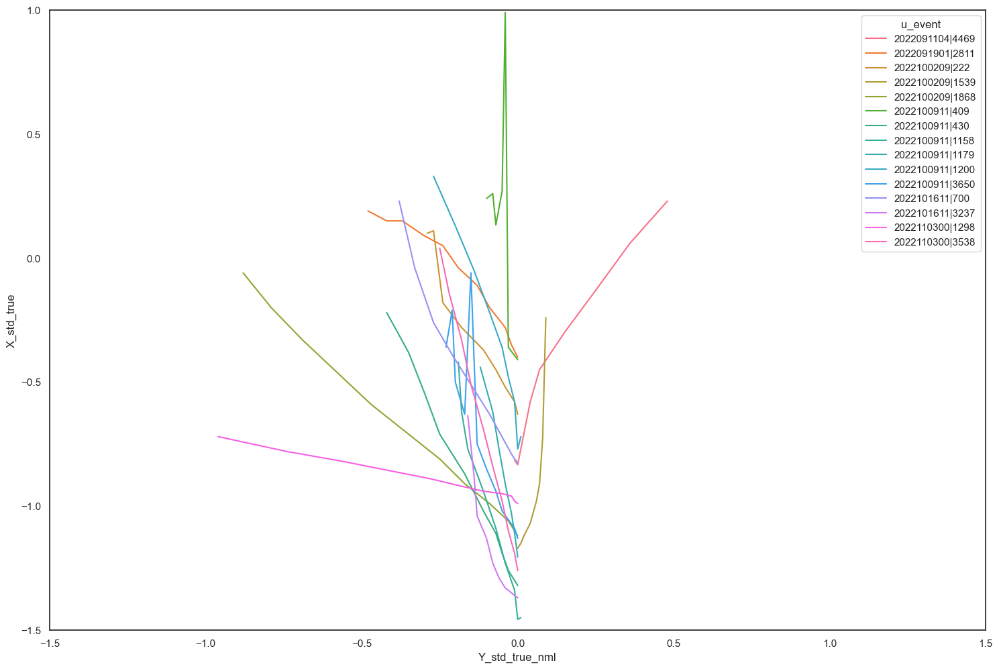

In [220]:
sns.set(rc={'figure.figsize':(18,12)})
sns.set_theme(style='white')
ax = sns.lineplot(data = jh, x = 'Y_std_true_nml', y = 'X_std_true', hue = 'u_event', errorbar = None)
ax.set_ylim(-1.5, 1.0)
ax.set_xlim(-1.5, 1.5)

(-1.5, 1.5)

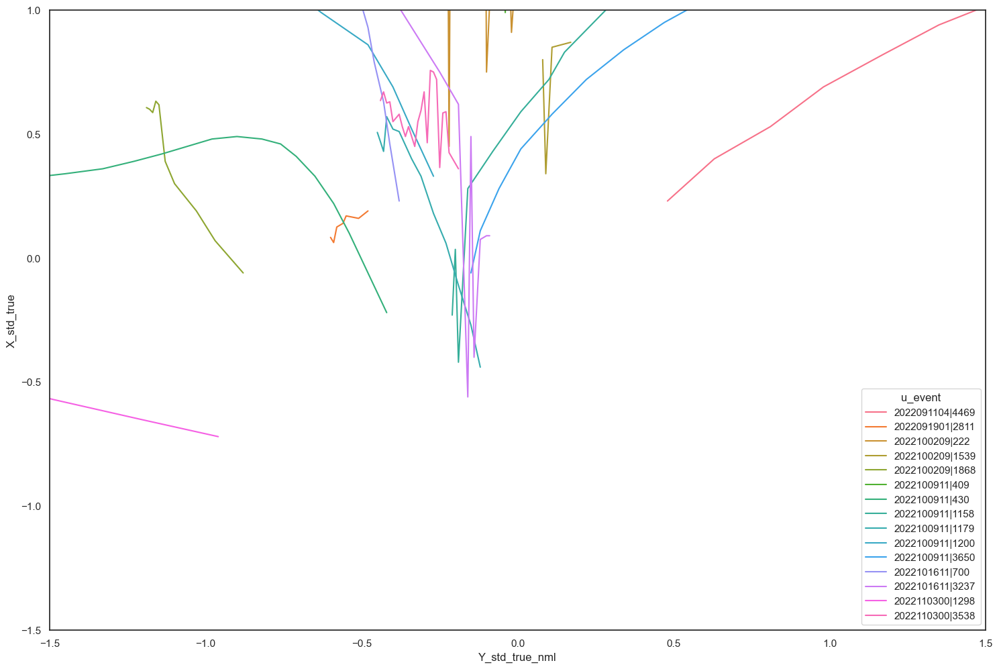

In [249]:
sns.set(rc={'figure.figsize':(18,12)})
sns.set_theme(style='white')
ax = sns.lineplot(data = jh_ah, x = 'Y_std_true_nml', y = 'X_std_true', hue = 'u_event', errorbar = None)
ax.set_ylim(-1.5, 1.0)
ax.set_xlim(-1.5, 1.5)

In [139]:
c1 = (QB_sneak_tracking['position'] == 'QB')
c2 = (QB_sneak_tracking['displayName'] != 'Jalen Hurts')
c3 = (QB_sneak_tracking['frameId'] >= 6)
c4 = (QB_sneak_tracking['frameId'] <= 16)

not_jh = QB_sneak_tracking[c1&c2&c3&c4]
not_jh

,gameId,playId,u_event,nflId,displayName,frameId,time,jerseyNumber,club,playDirection,x,y,s,a,dis,o,dir,event,team2,possessionTeam,homeTeamAbbr,visitorTeamAbbr,yardlineNumber,yardlineSide,possessionTeam_alt,PlayerTeam,team,position,Dir_rad,ToLeft,TeamOnOffense,IsOnOffense,YardLine_std,yardlineSide_ha,X_std,Y_std,Dir_std,dx,dy,Orientation_rad,Orientation_std,Orientation_deg_std,Dir_deg_std,MPH,X_std_true,Y_std_true,ball_snap_frameId,QB_start_Y_std_true,Y_std_true_nml
117,2022091101,2431,2022091101|2431,43380.0,Jacoby Brissett,6,2022-09-11 15:00:15.099999ZZZZ,7.0,CLE,right,56.62,23.77,0.00,0.00,0.00,56.78,159.55,ball_snap,CLE,away,CAR,CLE,48,CLE,away,CLE,away,QB,5.069309,False,away,True,48,away,56.62,23.77,5.069309,0.00,-0.00,0.579798,0.579798,33.22,290.45,0.000000,-1.38,23.77,6.0,23.77,0.00
118,2022091101,2431,2022091101|2431,43380.0,Jacoby Brissett,7,2022-09-11 15:00:15.200000ZZZZ,7.0,CLE,right,56.62,23.77,0.00,0.00,0.00,56.05,194.25,NaN,CLE,away,CAR,CLE,48,CLE,away,CLE,away,QB,4.463680,False,away,True,48,away,56.62,23.77,4.463680,-0.00,-0.00,0.592539,0.592539,33.95,255.75,0.000000,-1.38,23.77,6.0,23.77,0.00
119,2022091101,2431,2022091101|2431,43380.0,Jacoby Brissett,8,2022-09-11 15:00:15.299999ZZZZ,7.0,CLE,right,56.62,23.78,0.00,0.06,0.00,56.05,301.55,run,CLE,away,CAR,CLE,48,CLE,away,CLE,away,QB,2.590941,False,away,True,48,away,56.62,23.78,2.590941,-0.00,0.00,0.592539,0.592539,33.95,148.45,0.000000,-1.38,23.78,6.0,23.77,-0.01
120,2022091101,2431,2022091101|2431,43380.0,Jacoby Brissett,9,2022-09-11 15:00:15.400000ZZZZ,7.0,CLE,right,56.61,23.78,0.01,0.03,0.00,56.05,308.55,NaN,CLE,away,CAR,CLE,48,CLE,away,CLE,away,QB,2.468768,False,away,True,48,away,56.61,23.78,2.468768,-0.01,0.01,0.592539,0.592539,33.95,141.45,0.020455,-1.39,23.78,6.0,23.77,-0.01
121,2022091101,2431,2022091101|2431,43380.0,Jacoby Brissett,10,2022-09-11 15:00:15.500000ZZZZ,7.0,CLE,right,56.61,23.78,0.01,0.00,0.00,56.05,308.74,NaN,CLE,away,CAR,CLE,48,CLE,away,CLE,away,QB,2.465452,False,away,True,48,away,56.61,23.78,2.465452,-0.01,0.01,0.592539,0.592539,33.95,141.26,0.020455,-1.39,23.78,6.0,23.77,-0.01
122,2022091101,2431,2022091101|2431,43380.0,Jacoby Brissett,11,2022-09-11 15:00:15.599999ZZZZ,7.0,CLE,right,56.61,23.78,0.01,0.02,0.00,56.05,312.02,NaN,CLE,away,CAR,CLE,48,CLE,away,CLE,away,QB,2.408205,False,away,True,48,away,56.61,23.78,2.408205,-0.01,0.01,0.592539,0.592539,33.95,137.98,0.020455,-1.39,23.78,6.0,23.77,-0.01
123,2022091101,2431,2022091101|2431,43380.0,Jacoby Brissett,12,2022-09-11 15:00:15.700000ZZZZ,7.0,CLE,right,56.61,23.78,0.01,0.02,0.00,56.05,312.63,NaN,CLE,away,CAR,CLE,48,CLE,away,CLE,away,QB,2.397559,False,away,True,48,away,56.61,23.78,2.397559,-0.01,0.01,0.592539,0.592539,33.95,137.37,0.020455,-1.39,23.78,6.0,23.77,-0.01
124,2022091101,2431,2022091101|2431,43380.0,Jacoby Brissett,13,2022-09-11 15:00:15.799999ZZZZ,7.0,CLE,right,56.61,23.78,0.01,0.02,0.00,56.05,315.25,NaN,CLE,away,CAR,CLE,48,CLE,away,CLE,away,QB,2.351831,False,away,True,48,away,56.61,23.78,2.351831,-0.01,0.01,0.592539,0.592539,33.95,134.75,0.020455,-1.39,23.78,6.0,23.77,-0.01
125,2022091101,2431,2022091101|2431,43380.0,Jacoby Brissett,14,2022-09-11 15:00:15.900000ZZZZ,7.0,CLE,right,56.61,23.78,0.01,0.01,0.00,56.05,317.21,first_contact,CLE,away,CAR,CLE,48,CLE,away,CLE,away,QB,2.317623,False,away,True,48,away,56.61,23.78,2.317623,-0.01,0.01,0.592539,0.592539,33.95,132.79,0.020455,-1.39,23.78,6.0,23.77,-0.01
126,2022091101,2431,2022091101|2431,43380.0,Jacoby Brissett,15,2022-09-11 15:00:16.000000ZZZZ,7.0,CLE,right,56.60,23.79,0.02,0.07,0.00,56.05,323.20,NaN,CLE,away,CAR,CLE,48,CLE,away,CLE,away,QB,2.213077,False,away,True,48,away,56.60,23.79,2.213077,-0.01,0.02,0.592539,0.592539,33.95,126.80,0.040909,-1.40,23.79,6.0,23.77,-0.02


(-1.5, 1.5)

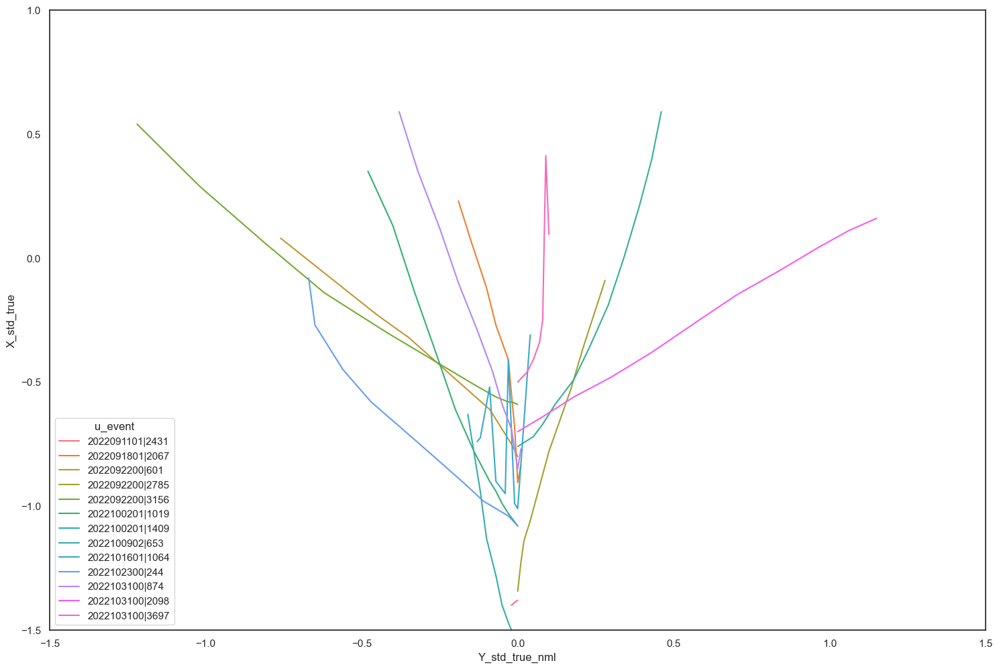

In [145]:
c1 = (QB_sneak_tracking['position'] == 'QB')
c2 = (QB_sneak_tracking['club'] == 'CLE')
c3 = (QB_sneak_tracking['frameId'] >= 6)
c4 = (QB_sneak_tracking['frameId'] <= 16)

club_t = QB_sneak_tracking[c1&c2&c3&c4]

sns.set(rc={'figure.figsize':(18,12)})
sns.set_theme(style='white')
ax = sns.lineplot(data = club_t, x = 'Y_std_true_nml', y = 'X_std_true', hue = 'u_event', errorbar = None)
ax.set_ylim(-1.5, 1.0)
ax.set_xlim(-1.5, 1.5)

(-1.5, 1.5)

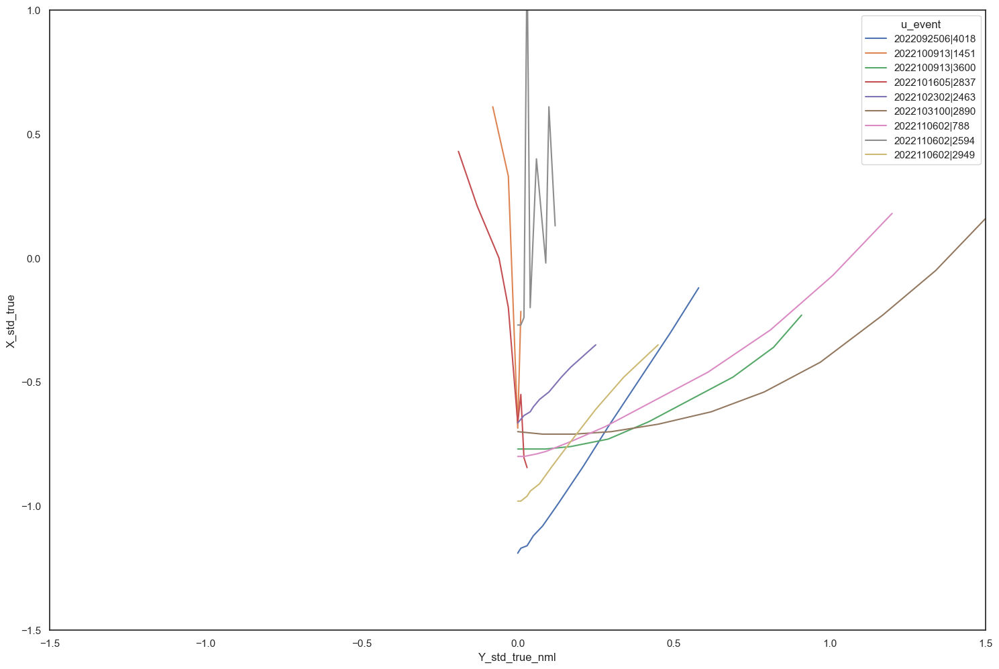

In [221]:
c1 = (QB_sneak_tracking['position'] == 'QB')
c2 = (QB_sneak_tracking['club'] == 'CIN')
c3 = (QB_sneak_tracking['frameId'] >= 6)
c4 = (QB_sneak_tracking['frameId'] <= 16)

club_t = QB_sneak_tracking[c1&c2&c3&c4]

sns.set(rc={'figure.figsize':(18,12)})
sns.set_theme(style='white')
ax = sns.lineplot(data = club_t, x = 'Y_std_true_nml', y = 'X_std_true', hue = 'u_event', errorbar = None)
ax.set_ylim(-1.5, 1.0)
ax.set_xlim(-1.5, 1.5)

(-1.5, 1.5)

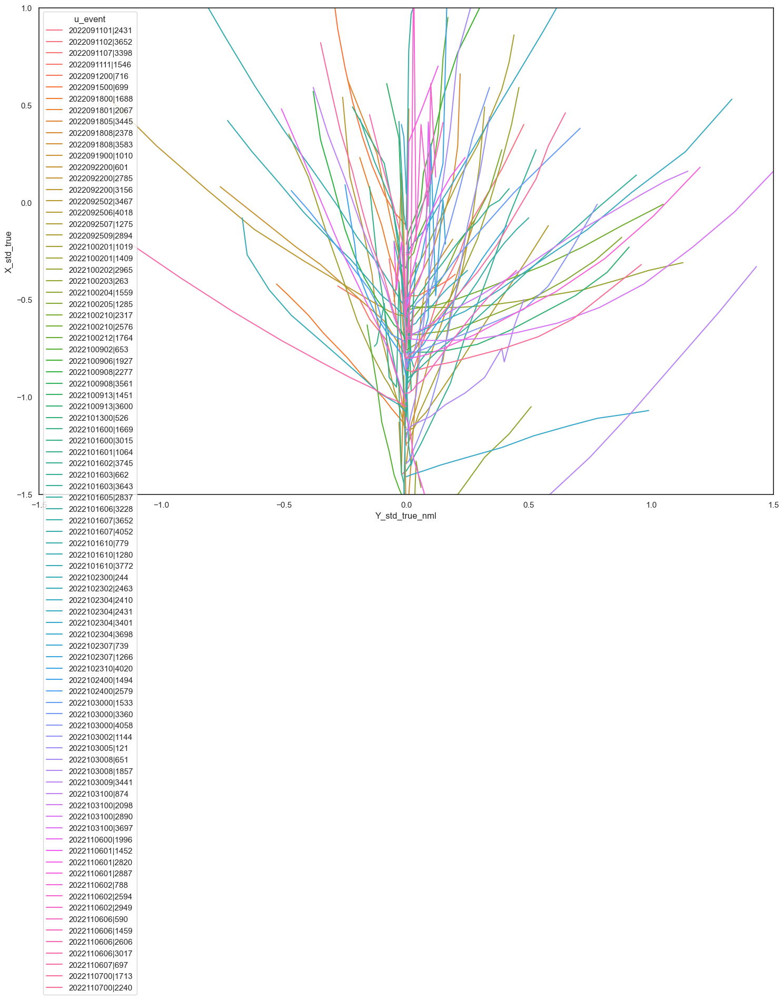

In [222]:
sns.set(rc={'figure.figsize':(18,12)})
sns.set_theme(style='white')
ax = sns.lineplot(data = not_jh, x = 'Y_std_true_nml', y = 'X_std_true', hue = 'u_event', errorbar = None)
ax.set_ylim(-1.5, 1.0)
ax.set_xlim(-1.5, 1.5)

In [223]:
c1 = (all_runs_tracking['position'].isin(['T','G','C']))
c11 = (all_runs_tracking['displayName'] == 'Football')
c2 = (all_runs_tracking['event'] == 'ball_snap')

snap_big_boys = all_runs_tracking[c1&c2]
snap_football = all_runs_tracking[c11&c2][['u_event','X_std','Y_std']]
snap_football = snap_football.rename(columns={'X_std': 'Football_X_std','Y_std': 'Football_Y_std'})
snap_big_boys = pd.merge(snap_big_boys, snap_football, how = 'left', on = ['u_event'])

cal1 = (snap_big_boys['Football_X_std'] - snap_big_boys['X_std'])
cal2 = (snap_big_boys['Football_Y_std'] - snap_big_boys['Y_std'])
snap_big_boys['distance_football'] =(np.sqrt(cal1**2+cal2**2))
snap_big_boys['distance_football_rank'] = snap_big_boys.groupby(['u_event'])['distance_football'].rank(method="first", ascending=True)

big_boy_at_snap_big_boys = snap_big_boys.groupby(['u_event']).agg({'displayName':'nunique'}).reset_index()
big_boy_at_snap_big_boys = big_boy_at_snap_big_boys.rename(columns={'displayName': 'oline_at_snap'})
snap_big_boys = pd.merge(snap_big_boys, big_boy_at_snap_big_boys, how = 'left', on = ['u_event'])
snap_big_boys['y_loc_rank'] = snap_big_boys.groupby(['u_event'])['Y_std_true'].rank(method="first", ascending=True)

def basic_position_sum(snap_big_boys):
# short attack section
    if ((snap_big_boys['oline_at_snap'] == 5) & (snap_big_boys['y_loc_rank'] == 5.0)):
        return 'LT'
        
    elif ((snap_big_boys['oline_at_snap'] == 5) & (snap_big_boys['y_loc_rank'] == 4.0)):
        return 'LG'
    elif ((snap_big_boys['oline_at_snap'] == 5) & (snap_big_boys['y_loc_rank'] == 3.0)):
        return 'C'
    elif ((snap_big_boys['oline_at_snap'] == 5) & (snap_big_boys['y_loc_rank'] == 2.0)):
        return 'RG'
    elif ((snap_big_boys['oline_at_snap'] == 5) & (snap_big_boys['y_loc_rank'] == 1.0)):
        return 'RT'

    
    else:
        return 'OTH'
    
snap_big_boys['basic_position'] = snap_big_boys.apply(basic_position_sum, axis = 1)

snap_big_boys_centre_loc = snap_big_boys[snap_big_boys['distance_football_rank'] == 1][['u_event','X_std_true','Y_std_true']]
snap_big_boys_centre_loc = snap_big_boys_centre_loc.rename(columns={'X_std_true': 'C_X_std_true','Y_std_true': 'C_Y_std_true'})

snap_big_boys = pd.merge(snap_big_boys,snap_big_boys_centre_loc , how = 'left', on = 'u_event')
snap_big_boys['left_of_C_flg'] = np.where(snap_big_boys['Y_std_true'] > snap_big_boys['C_Y_std_true'],1,0)
snap_big_boys['right_of_C_flg'] = np.where(snap_big_boys['Y_std_true'] < snap_big_boys['C_Y_std_true'],1,0)

cal1 = (snap_big_boys['C_Y_std_true'] - snap_big_boys['Y_std_true'])
snap_big_boys['y_dis_from_C'] =(np.sqrt(cal1**2))

snap_big_boys['left_dis_from_C_rank'] = snap_big_boys.groupby(['u_event','left_of_C_flg'])['y_dis_from_C'].rank(method="first", ascending=True)
snap_big_boys['right_dis_from_C_rank'] = snap_big_boys.groupby(['u_event','right_of_C_flg'])['y_dis_from_C'].rank(method="first", ascending=True)


def detail_position_sum(snap_big_boys):
# short attack section
    if ((snap_big_boys['left_of_C_flg'] == 0) & (snap_big_boys['right_of_C_flg'] == 0)):
        return 'C'
        
    elif ((snap_big_boys['left_of_C_flg'] == 1) & (snap_big_boys['right_of_C_flg'] == 0) & (snap_big_boys['left_dis_from_C_rank'] == 1)):
        return 'LG'
    elif ((snap_big_boys['left_of_C_flg'] == 1) & (snap_big_boys['right_of_C_flg'] == 0) & (snap_big_boys['left_dis_from_C_rank'] == 2)):
        return 'LT'
    elif ((snap_big_boys['left_of_C_flg'] == 1) & (snap_big_boys['right_of_C_flg'] == 0) & (snap_big_boys['left_dis_from_C_rank'] > 2)):
        return 'LOTH'
    elif ((snap_big_boys['left_of_C_flg'] == 0) & (snap_big_boys['right_of_C_flg'] == 1) & (snap_big_boys['right_dis_from_C_rank'] == 1)):
        return 'RG'
    elif ((snap_big_boys['left_of_C_flg'] == 0) & (snap_big_boys['right_of_C_flg'] == 1) & (snap_big_boys['right_dis_from_C_rank'] == 2)):
        return 'RT'
    elif ((snap_big_boys['left_of_C_flg'] == 0) & (snap_big_boys['right_of_C_flg'] == 1) & (snap_big_boys['right_dis_from_C_rank'] > 2)):
        return 'ROTH'
    else:
        return 'OTH'
    
snap_big_boys['detail_position'] = snap_big_boys.apply(detail_position_sum, axis = 1)
snap_big_boys.head(10)

,gameId,playId,u_event,nflId,displayName,frameId,time,jerseyNumber,club,playDirection,x,y,s,a,dis,o,dir,event,team2,possessionTeam,homeTeamAbbr,visitorTeamAbbr,yardlineNumber,yardlineSide,possessionTeam_alt,PlayerTeam,team,position,weight,Dir_rad,ToLeft,TeamOnOffense,IsOnOffense,YardLine_std,yardlineSide_ha,X_std,Y_std,Dir_std,dx,dy,Orientation_rad,Orientation_std,Orientation_deg_std,Dir_deg_std,MPH,X_std_true,Y_std_true,ball_snap_frameId,QB_start_Y_std_true,Y_std_true_nml,Football_X_std,Football_Y_std,distance_football,distance_football_rank,oline_at_snap,y_loc_rank,basic_position,C_X_std_true,C_Y_std_true,left_of_C_flg,right_of_C_flg,y_dis_from_C,left_dis_from_C_rank,right_dis_from_C_rank,detail_position
0,2022090800,101,2022090800|101,35472.0,Rodger Saffold,6,2022-09-08 20:25:08.700000Z,76.0,BUF,left,73.13,27.67,0.10,1.14,0.02,273.97,348.75,ball_snap,BUF,away,LA,BUF,38,BUF,away,BUF,away,G,325.0,1.767146,True,away,True,38,away,46.87,25.66,4.908739,0.02,-0.10,3.072303,6.213896,356.03,281.25,0.204545,-1.13,25.66,6.0,23.77,-1.89,47.96,23.81,2.147231,3.0,5,4.0,LG,-0.50,23.86,1,0,1.80,1.0,2.0,LG
1,2022090800,101,2022090800|101,42392.0,Mitch Morse,6,2022-09-08 20:25:08.700000Z,60.0,BUF,left,72.50,29.47,0.00,0.08,0.00,273.23,224.11,ball_snap,BUF,away,LA,BUF,38,BUF,away,BUF,away,C,305.0,3.942524,True,away,True,38,away,47.50,23.86,0.800932,0.00,0.00,3.085219,6.226811,356.77,45.89,0.000000,-0.50,23.86,6.0,23.77,-0.09,47.96,23.81,0.462709,1.0,5,3.0,C,-0.50,23.86,0,0,0.00,1.0,1.0,C
2,2022090800,101,2022090800|101,44875.0,Dion Dawkins,6,2022-09-08 20:25:08.700000Z,73.0,BUF,left,73.15,26.05,0.00,0.00,0.00,261.37,280.21,ball_snap,BUF,away,LA,BUF,38,BUF,away,BUF,away,T,320.0,2.963395,True,away,True,38,away,46.85,27.28,6.104987,0.00,-0.00,3.292215,0.150622,8.63,349.79,0.000000,-1.15,27.28,6.0,23.77,-3.51,47.96,23.81,3.643213,5.0,5,5.0,LT,-0.50,23.86,1,0,3.42,2.0,3.0,LT
3,2022090800,101,2022090800|101,48512.0,Ryan Bates,6,2022-09-08 20:25:08.700000Z,71.0,BUF,left,73.06,31.24,0.00,0.00,0.00,277.87,315.85,ball_snap,BUF,away,LA,BUF,38,BUF,away,BUF,away,C,300.0,2.341359,True,away,True,38,away,46.94,22.09,5.482952,0.00,-0.00,3.004235,6.145828,352.13,314.15,0.000000,-1.06,22.09,6.0,23.77,1.68,47.96,23.81,1.999700,2.0,5,2.0,RG,-0.50,23.86,0,1,1.77,2.0,1.0,RG
4,2022090800,101,2022090800|101,53522.0,Spencer Brown,6,2022-09-08 20:25:08.700000Z,79.0,BUF,left,73.15,32.80,0.00,0.00,0.00,267.12,339.31,ball_snap,BUF,away,LA,BUF,38,BUF,away,BUF,away,T,321.0,1.931905,True,away,True,38,away,46.85,20.53,5.073498,0.00,-0.00,3.191858,0.050265,2.88,290.69,0.000000,-1.15,20.53,6.0,23.77,3.24,47.96,23.81,3.462730,4.0,5,1.0,RT,-0.50,23.86,0,1,3.33,3.0,2.0,RT
5,2022090800,146,2022090800|146,35472.0,Rodger Saffold,6,2022-09-08 20:26:29.900000Z,76.0,BUF,left,59.85,27.81,0.07,0.66,0.01,274.38,276.09,ball_snap,BUF,away,LA,BUF,49,LA,away,BUF,away,G,325.0,3.035302,True,away,True,51,home,60.15,25.52,6.176895,0.07,-0.01,3.065147,6.206740,355.62,353.91,0.143182,-0.85,25.52,6.0,23.78,-1.74,58.18,23.64,2.723105,3.0,5,4.0,LG,-1.21,22.29,1,0,3.23,2.0,3.0,LT
6,2022090800,146,2022090800|146,42392.0,Mitch Morse,6,2022-09-08 20:26:29.900000Z,60.0,BUF,left,59.46,29.50,0.16,0.38,0.02,265.81,305.06,ball_snap,BUF,away,LA,BUF,49,LA,away,BUF,away,C,305.0,2.529680,True,away,True,51,home,60.54,23.83,5.671273,0.13,-0.09,3.214722,0.073129,4.19,324.94,0.327273,-0.46,23.83,6.0,23.78,-0.05,58.18,23.64,2.367636,2.0,5,3.0,C,-1.21,22.29,1,0,1.54,1.0,2.0,LG
7,2022090800,146,2022090800|146,44875.0,Dion Dawkins,6,2022-09-08 20:26:29.900000Z,73.0,BUF,left,59.93,26.19,0.01,0.17,0.00,262.65,2.48,ball_snap,BUF,away,LA,BUF,49,LA,away,BUF,away,T,320.0,1.527512,True,away,True,51,home,60.07,27.14,4.669105,-0.00,-0.01,3.269874,0.128282,7.35,267.52,0.020455,-0.93,27.14,6.0,23.78,-3.36,58.18,23.64,3.977700,5.0,5,5.0,LT,-1.21,22.29,1,0,4.85,3.0,4.0,LOTH
8,2022090800,146,2022090800|146,48512.0,Ryan Bates,6,2022-09-08 20:26:29.900000Z,71.0,BUF,left,60.21,31.04,0.19,0.19,0.03,247.49,65.42,ball_snap,BUF,away,LA,BUF,49,

In [250]:
snap_big_boys.groupby(['club','nflId','displayName','weight','detail_position']).agg({'u_event':'nunique','gameId':'nunique','y_dis_from_C':'mean'}).reset_index()

,club,nflId,displayName,weight,detail_position,u_event,gameId,y_dis_from_C
0,ARI,37130.0,Rodney Hudson,315.0,C,82,4,0.000000
1,ARI,38779.0,Kelvin Beachum,308.0,C,1,1,NaN
2,ARI,38779.0,Kelvin Beachum,308.0,RG,1,1,1.500000
3,ARI,38779.0,Kelvin Beachum,308.0,ROTH,2,2,4.415000
4,ARI,38779.0,Kelvin Beachum,308.0,RT,177,9,3.216328
5,ARI,39965.0,Justin Pugh,311.0,C,1,1,0.000000
6,ARI,39965.0,Justin Pugh,311.0,LG,81,5,1.512840
7,ARI,39965.0,Justin Pugh,311.0,LT,1,1,2.960000
8,ARI,42367.0,D.J. Humphries,307.0,C,1,1,NaN
9,ARI,42367.0,D.J. Humphries,307.0,LG,2,2,1.520000


In [252]:
big_boy_starters = snap_big_boys.groupby(['club','nflId','displayName','weight','detail_position','y_dis_from_C']).agg({'u_event':'nunique','gameId':'nunique'}).reset_index()
big_boy_starters = big_boy_starters[big_boy_starters['detail_position'].isin(['LT','LG','C','RG','RT'])]

big_boy_starters['starting_position_game_rank'] = big_boy_starters.groupby(['club','detail_position'])['gameId'].rank(method="first", ascending=False)
big_boy_starters['starting_position_event_rank'] = big_boy_starters.groupby(['club','detail_position','starting_position_game_rank'])['u_event'].rank(method="first", ascending=False)

c1 = (big_boy_starters['starting_position_game_rank'] == 1)
c2 = (big_boy_starters['starting_position_event_rank'] == 1)
big_boy_starters['is_starter'] = np.where(c1 & c2,1,0)
big_boy_starters = big_boy_starters[big_boy_starters['is_starter'] == 1]
big_boy_starters

,club,nflId,displayName,weight,detail_position,y_dis_from_C,u_event,gameId,starting_position_game_rank,starting_position_event_rank,is_starter
0,ARI,37130.0,Rodney Hudson,315.0,C,0.00,81,4,1.0,1.0,1
71,ARI,38779.0,Kelvin Beachum,308.0,RT,3.32,5,5,1.0,1.0,1
120,ARI,39965.0,Justin Pugh,311.0,LG,1.34,4,3,1.0,1.0,1
210,ARI,42367.0,D.J. Humphries,307.0,LT,2.93,5,4,1.0,1.0,1
386,ARI,46103.0,Will Hernandez,327.0,RG,1.56,10,7,1.0,1.0,1
544,ATL,41232.0,Jake Matthews,309.0,LT,2.96,9,6,1.0,1.0,1
625,ATL,45550.0,Elijah Wilkinson,329.0,LG,1.30,9,6,1.0,1.0,1
734,ATL,47797.0,Chris Lindstrom,307.0,RG,1.48,12,7,1.0,1.0,1
804,ATL,47814.0,Kaleb McGary,306.0,RT,2.98,12,6,1.0,1.0,1
873,ATL,53543.0,Drew Dalman,300.0,C,0.00,263,9,1.0,1.0,1


In [260]:
big_boy_LT = big_boy_starters[big_boy_starters['detail_position'] == 'LT']
big_boy_LG = big_boy_starters[big_boy_starters['detail_position'] == 'LG']
big_boy_C = big_boy_starters[big_boy_starters['detail_position'] == 'C']
big_boy_RG = big_boy_starters[big_boy_starters['detail_position'] == 'RG']
big_boy_RT = big_boy_starters[big_boy_starters['detail_position'] == 'RT']

big_boy_LS = big_boy_starters[big_boy_starters['detail_position'].isin(['LT','LG'])].groupby(['club']).agg({'weight':'sum'}).reset_index()
big_boy_LS = big_boy_LS.rename(columns={'weight': 'left_side_combined_weight'})
big_boy_RS = big_boy_starters[big_boy_starters['detail_position'].isin(['RT','RG'])].groupby(['club']).agg({'weight':'sum'}).reset_index()
big_boy_RS = big_boy_RS.rename(columns={'weight': 'right_side_combined_weight'})

def percentile_rank(column):
   return column.rank(pct = True)
# calling the user-defined method
big_boy_LT['position_weight_percentile'] = percentile_rank(big_boy_LT['weight'])
big_boy_LG['position_weight_percentile'] = percentile_rank(big_boy_LG['weight'])
big_boy_C['position_weight_percentile'] = percentile_rank(big_boy_C['weight'])
big_boy_RG['position_weight_percentile'] = percentile_rank(big_boy_RG['weight'])
big_boy_RT['position_weight_percentile'] = percentile_rank(big_boy_RT['weight'])

big_boy_LS['left_side_weight_percentile'] = percentile_rank(big_boy_LS['left_side_combined_weight'])
big_boy_RS['right_side_weight_percentile'] = percentile_rank(big_boy_RS['right_side_combined_weight'])

frames = [big_boy_LT,big_boy_LG,big_boy_C,big_boy_RG,big_boy_RT]
big_boy_percentiles = pd.concat(frames)
big_boy_percentiles = pd.merge(big_boy_percentiles,big_boy_LS, how = 'left', on = 'club')
big_boy_percentiles = pd.merge(big_boy_percentiles,big_boy_RS, how = 'left', on = 'club')
big_boy_percentiles['y_dis_from_C_nml'] = np.where(big_boy_percentiles['detail_position'].isin(['LT','LG']),big_boy_percentiles['y_dis_from_C']*-1,big_boy_percentiles['y_dis_from_C'])
team_dis_to_c = big_boy_percentiles.groupby('club').agg({'y_dis_from_C':'mean'}).reset_index()
team_dis_to_c = team_dis_to_c.rename(columns={'y_dis_from_C': 'team_avg_gap'})
big_boy_percentiles = pd.merge(big_boy_percentiles,team_dis_to_c, how = 'left', on = 'club')
big_boy_percentiles.sort_values(by = ['club','detail_position'], ascending = [True,True])

,club,nflId,displayName,weight,detail_position,y_dis_from_C,u_event,gameId,starting_position_game_rank,starting_position_event_rank,is_starter,position_weight_percentile,left_side_combined_weight,left_side_weight_percentile,right_side_combined_weight,right_side_weight_percentile,y_dis_from_C_nml,team_avg_gap
64,ARI,37130.0,Rodney Hudson,315.0,C,0.00,81,4,1.0,1.0,1,0.812500,618.0,0.218750,635.0,0.687500,0.00,1.830
32,ARI,39965.0,Justin Pugh,311.0,LG,1.34,4,3,1.0,1.0,1,0.500000,618.0,0.218750,635.0,0.687500,-1.34,1.830
0,ARI,42367.0,D.J. Humphries,307.0,LT,2.93,5,4,1.0,1.0,1,0.156250,618.0,0.218750,635.0,0.687500,-2.93,1.830
96,ARI,46103.0,Will Hernandez,327.0,RG,1.56,10,7,1.0,1.0,1,0.875000,618.0,0.218750,635.0,0.687500,1.56,1.830
128,ARI,38779.0,Kelvin Beachum,308.0,RT,3.32,5,5,1.0,1.0,1,0.171875,618.0,0.218750,635.0,0.687500,3.32,1.830
65,ATL,53543.0,Drew Dalman,300.0,C,0.00,263,9,1.0,1.0,1,0.281250,638.0,0.609375,613.0,0.125000,0.00,1.744
33,ATL,45550.0,Elijah Wilkinson,329.0,LG,1.30,9,6,1.0,1.0,1,0.875000,638.0,0.609375,613.0,0.125000,-1.30,1.744
1,ATL,41232.0,Jake Matthews,309.0,LT,2.96,9,6,1.0,1.0,1,0.187500,638.0,0.609375,613.0,0.125000,-2.96,1.744
97,ATL,47797.0,Chris Lindstrom,307.0,RG,1.48,12,7,1.0,1.0,1,0.343750,638.0,0.609375,613.0,0.125000,1.48,1.744
129,ATL,47814.0,Kaleb McGary,306.0,RT,2.98,12,6,1.0,1.0,1,0.093750,638.0,0.609375,613.0,0.125000,2.98,1.744


In [571]:
big_boy_percentiles[big_boy_percentiles['club'] == 'PHI']

,club,nflId,displayName,weight,detail_position,y_dis_from_C,u_event,gameId,starting_position_game_rank,starting_position_event_rank,is_starter,position_weight_percentile,left_side_combined_weight,left_side_weight_percentile,right_side_combined_weight,right_side_weight_percentile,y_dis_from_C_nml,team_avg_gap
25,PHI,46302.0,Jordan Mailata,344.0,LT,2.93,9,5,1.0,1.0,1,0.937500,669.0,0.96875,620.0,0.1875,-2.93,1.742
57,PHI,53466.0,Landon Dickerson,325.0,LG,1.34,5,5,1.0,1.0,1,0.781250,669.0,0.96875,620.0,0.1875,-1.34,1.742
89,PHI,37266.0,Jason Kelce,295.0,C,0.00,208,8,1.0,1.0,1,0.109375,669.0,0.96875,620.0,0.1875,0.00,1.742
121,PHI,43368.0,Isaac Seumalo,303.0,RG,1.34,5,5,1.0,1.0,1,0.156250,669.0,0.96875,620.0,0.1875,1.34,1.742
153,PHI,39950.0,Lane Johnson,317.0,RT,3.10,5,5,1.0,1.0,1,0.531250,669.0,0.96875,620.0,0.1875,3.10,1.742


In [572]:
big_boy_percentiles['left_side_combined_weight'].mean()

634.0625

<Axes: xlabel='y_dis_from_C_nml', ylabel='club'>

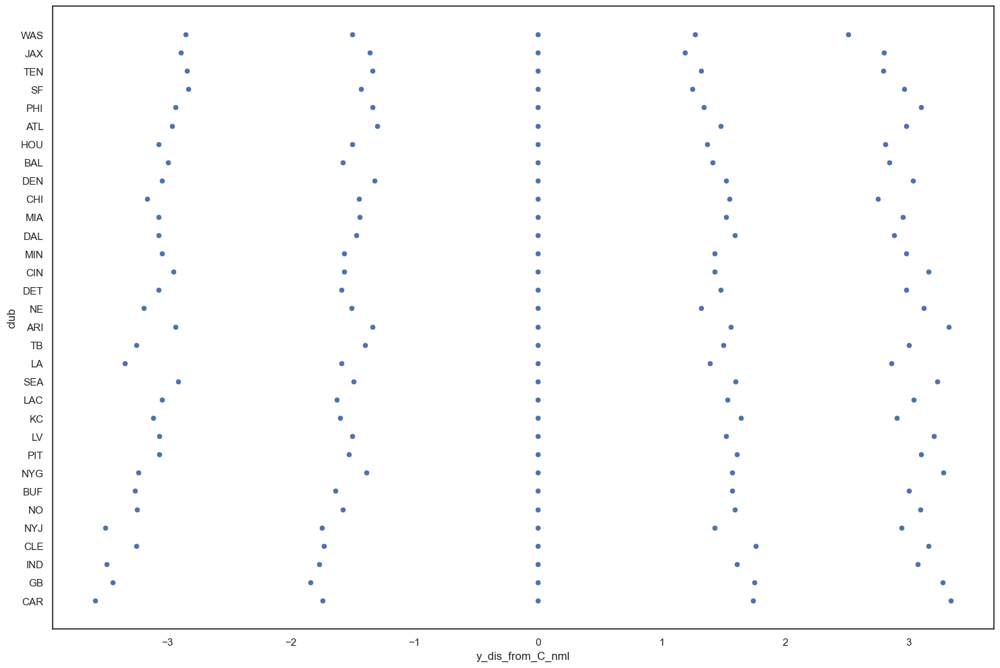

In [261]:
# actually this is only for overall run plays. not QB sneak
gap_graph = big_boy_percentiles.sort_values(by = ['team_avg_gap'], ascending = [True])
sns.scatterplot(data = gap_graph, x = 'y_dis_from_C_nml', y = 'club')

In [262]:
snap_big_boys.head(5)

,gameId,playId,u_event,nflId,displayName,frameId,time,jerseyNumber,club,playDirection,x,y,s,a,dis,o,dir,event,team2,possessionTeam,homeTeamAbbr,visitorTeamAbbr,yardlineNumber,yardlineSide,possessionTeam_alt,PlayerTeam,team,position,weight,Dir_rad,ToLeft,TeamOnOffense,IsOnOffense,YardLine_std,yardlineSide_ha,X_std,Y_std,Dir_std,dx,dy,Orientation_rad,Orientation_std,Orientation_deg_std,Dir_deg_std,MPH,X_std_true,Y_std_true,ball_snap_frameId,QB_start_Y_std_true,Y_std_true_nml,Football_X_std,Football_Y_std,distance_football,distance_football_rank,oline_at_snap,y_loc_rank,basic_position,C_X_std_true,C_Y_std_true,left_of_C_flg,right_of_C_flg,y_dis_from_C,left_dis_from_C_rank,right_dis_from_C_rank,detail_position
0,2022090800,101,2022090800|101,35472.0,Rodger Saffold,6,2022-09-08 20:25:08.700000Z,76.0,BUF,left,73.13,27.67,0.1,1.14,0.02,273.97,348.75,ball_snap,BUF,away,LA,BUF,38,BUF,away,BUF,away,G,325.0,1.767146,True,away,True,38,away,46.87,25.66,4.908739,0.02,-0.1,3.072303,6.213896,356.03,281.25,0.204545,-1.13,25.66,6.0,23.77,-1.89,47.96,23.81,2.147231,3.0,5,4.0,LG,-0.5,23.86,1,0,1.80,1.0,2.0,LG
1,2022090800,101,2022090800|101,42392.0,Mitch Morse,6,2022-09-08 20:25:08.700000Z,60.0,BUF,left,72.50,29.47,0.0,0.08,0.00,273.23,224.11,ball_snap,BUF,away,LA,BUF,38,BUF,away,BUF,away,C,305.0,3.942524,True,away,True,38,away,47.50,23.86,0.800932,0.00,0.0,3.085219,6.226811,356.77,45.89,0.000000,-0.50,23.86,6.0,23.77,-0.09,47.96,23.81,0.462709,1.0,5,3.0,C,-0.5,23.86,0,0,0.00,1.0,1.0,C
2,2022090800,101,2022090800|101,44875.0,Dion Dawkins,6,2022-09-08 20:25:08.700000Z,73.0,BUF,left,73.15,26.05,0.0,0.00,0.00,261.37,280.21,ball_snap,BUF,away,LA,BUF,38,BUF,away,BUF,away,T,320.0,2.963395,True,away,True,38,away,46.85,27.28,6.104987,0.00,-0.0,3.292215,0.150622,8.63,349.79,0.000000,-1.15,27.28,6.0,23.77,-3.51,47.96,23.81,3.643213,5.0,5,5.0,LT,-0.5,23.86,1,0,3.42,2.0,3.0,LT
3,2022090800,101,2022090800|101,48512.0,Ryan Bates,6,2022-09-08 20:25:08.700000Z,71.0,BUF,left,73.06,31.24,0.0,0.00,0.00,277.87,315.85,ball_snap,BUF,away,LA,BUF,38,BUF,away,BUF,away,C,300.0,2.341359,True,away,True,38,away,46.94,22.09,5.482952,0.00,-0.0,3.004235,6.145828,352.13,314.15,0.000000,-1.06,22.09,6.0,23.77,1.68,47.96,23.81,1.999700,2.0,5,2.0,RG,-0.5,23.86,0,1,1.77,2.0,1.0,RG
4,2022090800,101,2022090800|101,53522.0,Spencer Brown,6,2022-09-08 20:25:08.700000Z,79.0,BUF,left,73.15,32.80,0.0,0.00,0.00,267.12,339.31,ball_snap,BUF,away,LA,BUF,38,BUF,away,BUF,away,T,321.0,1.931905,True,away,True,38,away,46.85,20.53,5.073498,0.00,-0.0,3.191858,0.050265,2.88,290.69,0.000000,-1.15,20.53,6.0,23.77,3.24,47.96,23.81,3.462730,4.0,5,1.0,RT,-0.5,23.86,0,1,3.33,3.0,2.0,RT


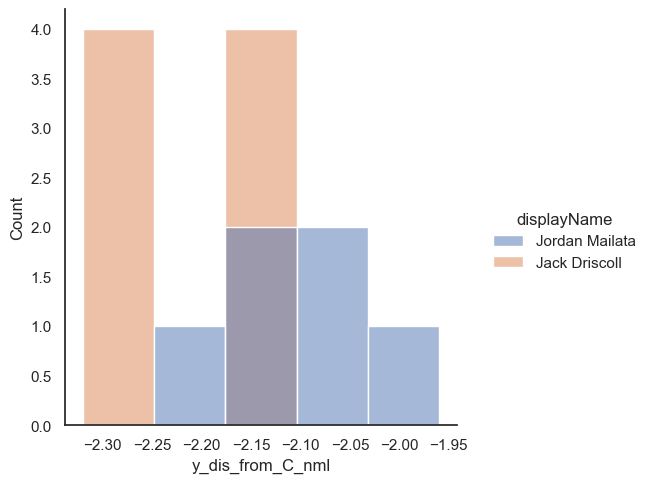

In [299]:
PHI_LT = QB_sneak_snap_big_boys[(QB_sneak_snap_big_boys['club'] == 'PHI')&(QB_sneak_snap_big_boys['detail_position'] == 'LT')]
sns.displot(data = PHI_LT, x = 'y_dis_from_C_nml', hue = 'displayName')

In [272]:
pd.merge(snap_big_boys[snap_big_boys['club'] == 'IND'], short_qb_run[['u_event']], how = 'inner', on = ['u_event'])

,gameId,playId,u_event,nflId,displayName,frameId,time,jerseyNumber,club,playDirection,x,y,s,a,dis,o,dir,event,team2,possessionTeam,homeTeamAbbr,visitorTeamAbbr,yardlineNumber,yardlineSide,possessionTeam_alt,PlayerTeam,team,position,weight,Dir_rad,ToLeft,TeamOnOffense,IsOnOffense,YardLine_std,yardlineSide_ha,X_std,Y_std,Dir_std,dx,dy,Orientation_rad,Orientation_std,Orientation_deg_std,Dir_deg_std,MPH,X_std_true,Y_std_true,ball_snap_frameId,QB_start_Y_std_true,Y_std_true_nml,Football_X_std,Football_Y_std,distance_football,distance_football_rank,oline_at_snap,y_loc_rank,basic_position,C_X_std_true,C_Y_std_true,left_of_C_flg,right_of_C_flg,y_dis_from_C,left_dis_from_C_rank,right_dis_from_C_rank,detail_position
0,2022092502,3467,2022092502|3467,43307.0,Ryan Kelly,6,2022-09-25 15:46:19.500000Z,78.0,IND,right,42.90,23.72,0.45,0.82,0.04,80.58,92.28,ball_snap,IND,home,IND,KC,33,IND,home,IND,home,C,309.0,6.243392,False,home,True,33,home,42.90,23.72,6.243392,0.45,-0.02,0.164410,0.164410,9.42,357.72,0.920454,-0.10,23.72,6.0,23.87,0.15,43.06,23.76,0.164924,1.0,5,4.0,LG,-0.1,23.72,0,0,0.00,1.0,1.0,C
1,2022092502,3467,2022092502|3467,46075.0,Quenton Nelson,6,2022-09-25 15:46:19.500000Z,56.0,IND,right,42.52,25.27,0.43,2.16,0.05,51.62,123.79,ball_snap,IND,home,IND,KC,33,IND,home,IND,home,G,330.0,5.693439,False,home,True,33,home,42.52,25.27,5.693439,0.36,-0.24,0.669857,0.669857,38.38,326.21,0.879545,-0.48,25.27,6.0,23.87,-1.40,43.06,23.76,1.603652,3.0,5,5.0,LT,-0.1,23.72,1,0,1.55,1.0,2.0,LG
2,2022092502,3467,2022092502|3467,46106.0,Braden Smith,6,2022-09-25 15:46:19.500000Z,72.0,IND,right,42.77,21.59,0.18,1.09,0.05,80.80,37.15,ball_snap,IND,home,IND,KC,33,IND,home,IND,home,T,315.0,0.922407,False,home,True,33,home,42.77,21.59,0.922407,0.11,0.14,0.160570,0.160570,9.20,52.85,0.368182,-0.23,21.59,6.0,23.87,2.28,43.06,23.76,2.189292,4.0,5,2.0,RG,-0.1,23.72,0,1,2.13,3.0,2.0,RT
3,2022092502,3467,2022092502|3467,46275.0,Matt Pryor,6,2022-09-25 15:46:19.500000Z,69.0,IND,right,42.14,20.02,0.03,0.03,0.03,55.16,323.95,ball_snap,IND,home,IND,KC,33,IND,home,IND,home,T,332.0,2.199988,False,home,True,33,home,42.14,20.02,2.199988,-0.02,0.02,0.608073,0.608073,34.84,126.05,0.061364,-0.86,20.02,6.0,23.87,3.85,43.06,23.76,3.851493,5.0,5,1.0,RT,-0.1,23.72,0,1,3.70,4.0,3.0,ROTH
4,2022092502,3467,2022092502|3467,52557.0,Danny Pinter,6,2022-09-25 15:46:19.500000Z,63.0,IND,right,42.67,22.78,0.41,1.48,0.04,96.07,38.09,ball_snap,IND,home,IND,KC,33,IND,home,IND,home,G,300.0,0.906000,False,home,True,33,home,42.67,22.78,0.906000,0.25,0.32,6.177244,6.177244,353.93,51.91,0.838636,-0.33,22.78,6.0,23.87,1.09,43.06,23.76,1.054751,2.0,5,3.0,C,-0.1,23.72,0,1,0.94,2.0,1.0,RG


<Axes: xlabel='y_dis_from_C_nml', ylabel='club'>

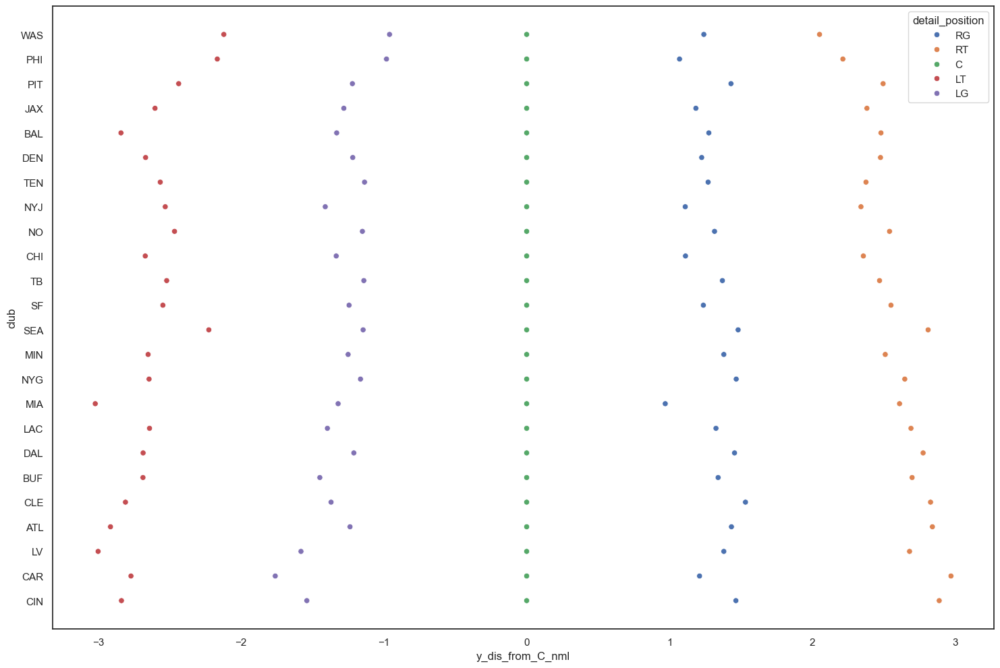

In [275]:
QB_sneak_snap_big_boys = pd.merge(snap_big_boys, short_qb_run[['u_event']], how = 'inner', on = ['u_event'])
QB_sneak_snap_big_boys = QB_sneak_snap_big_boys[QB_sneak_snap_big_boys['detail_position'].isin(['LT','LG','C','RG','RT'])]
QB_sneak_snap_big_boys['y_dis_from_C_nml'] = np.where(QB_sneak_snap_big_boys['detail_position'].isin(['LT','LG']),QB_sneak_snap_big_boys['y_dis_from_C']*-1,QB_sneak_snap_big_boys['y_dis_from_C'])
QB_sneak_snap_big_boys_sum = QB_sneak_snap_big_boys.groupby(['club','detail_position']).agg({'y_dis_from_C_nml':'mean'}).reset_index()

sneak_team_dis_to_c = QB_sneak_snap_big_boys.groupby('club').agg({'y_dis_from_C':'mean','u_event':'nunique'}).reset_index()
sneak_team_dis_to_c = sneak_team_dis_to_c.rename(columns={'y_dis_from_C': 'team_avg_gap','u_event':'events'})

QB_sneak_snap_big_boys_sum = pd.merge(QB_sneak_snap_big_boys_sum,sneak_team_dis_to_c, how = 'left', on = 'club')
sneak_gap_graph = QB_sneak_snap_big_boys_sum.sort_values(by = ['team_avg_gap'], ascending = [True])
sns.scatterplot(data = sneak_gap_graph[sneak_gap_graph['club'] != 'IND'], x = 'y_dis_from_C_nml', y = 'club', hue = 'detail_position')
# excluding IND as only one sneak which was off centre
#QB_sneak_snap_big_boys_sum

<Axes: xlabel='y_dis_from_C_nml', ylabel='Team'>

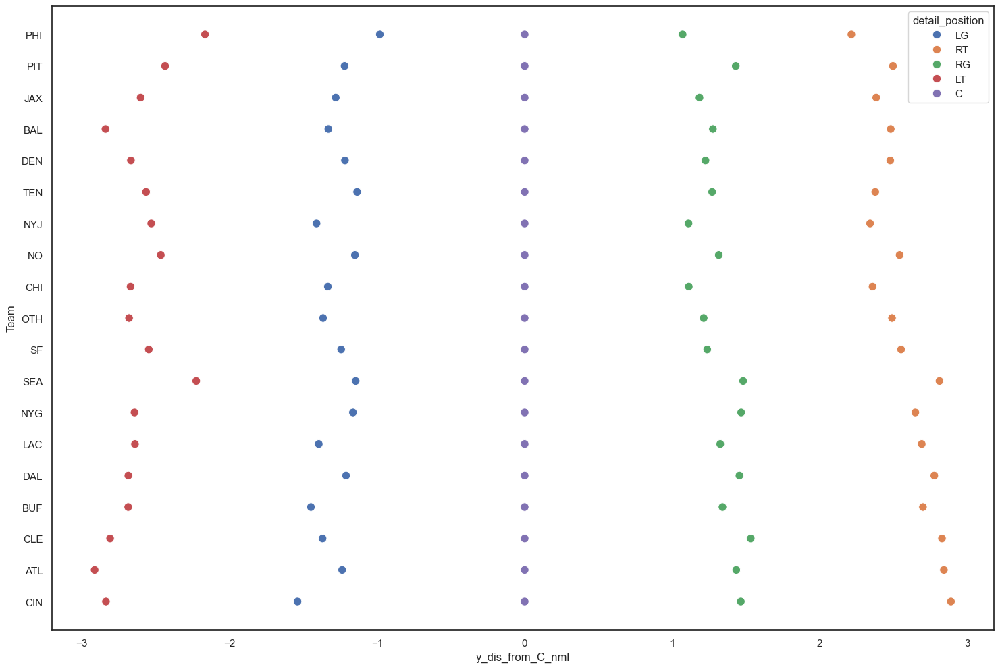

In [283]:
sneak_gap_graph_alt = sneak_gap_graph
sneak_gap_graph_alt['Team'] = np.where(sneak_gap_graph_alt['events'] == 1, 'OTH',sneak_gap_graph_alt['club'])
sneak_gap_graph_alt = sneak_gap_graph_alt.groupby(['Team','detail_position']).agg({'y_dis_from_C_nml':'mean','team_avg_gap':'mean','events':'sum'}).reset_index()
sneak_gap_graph_alt
sneak_gap_graph_alt = sneak_gap_graph_alt.sort_values(by = ['team_avg_gap'], ascending = [True])
b

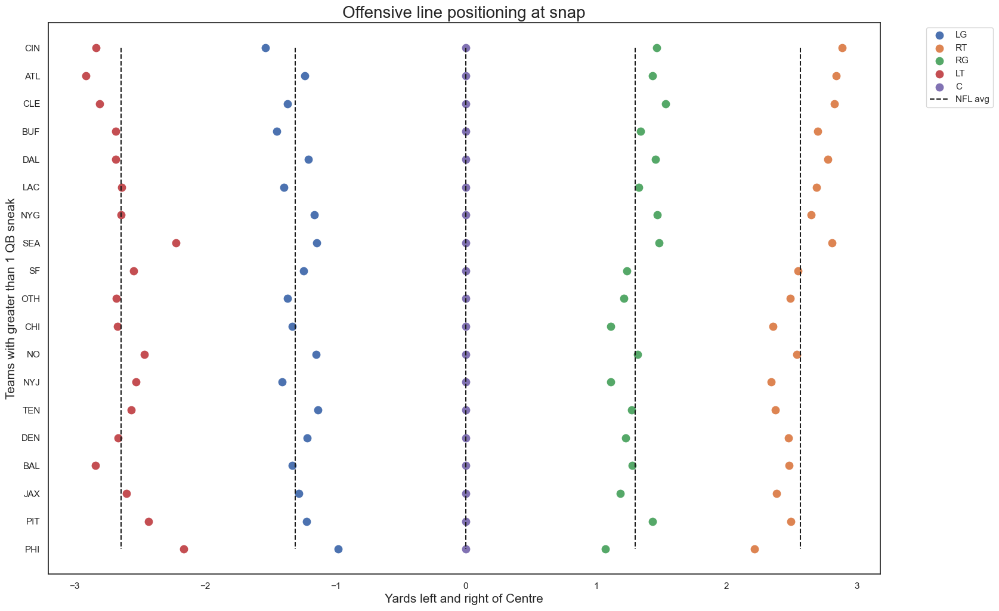

In [599]:
sneak_gap_graph_alt = sneak_gap_graph_alt[::-1]
for detail_position in sneak_gap_graph_alt['detail_position'].unique():
    # Create a mask for each category
    mask = sneak_gap_graph_alt['detail_position'] == detail_position
    # Use the mask to subset the dataframe and plot only those points
    plt.scatter(sneak_gap_graph_alt.loc[mask, 'y_dis_from_C_nml'], 
                sneak_gap_graph_alt.loc[mask, 'Team'], 
                label=detail_position, 
                s=80)

plt.plot([-2.645201, -2.645201], [18,0],'k--', label='NFL avg')  # 'k--' means black dashed line
plt.plot([-1.307720, -1.307720], [18,0],'k--')  # 'k--' means black dashed line
plt.plot([0, 0], [18,0], 'k--')  # 'k--' means black dashed line
plt.plot([1.297650, 1.297650], [18,0],'k--')  # 'k--' means black dashed line
plt.plot([2.566227, 2.566227], [18,0],'k--')  # 'k--' means black dashed line

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Add a title
plt.title("Offensive line positioning at snap", fontsize=20)

# Add x and y axis labels
plt.xlabel("Yards left and right of Centre", fontsize=15)
plt.ylabel("Teams with greater than 1 QB sneak", fontsize=15)

plt.show()

<Axes: xlabel='y_dis_from_C_nml', ylabel='Team'>

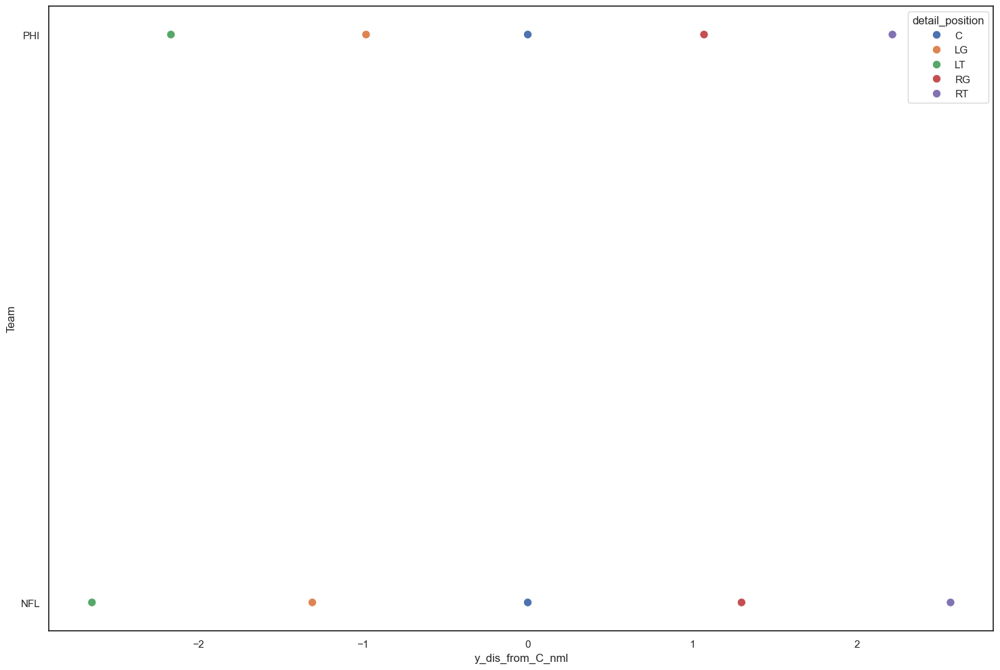

In [289]:
sneak_gap_graph_alt2 = sneak_gap_graph
sneak_gap_graph_alt2['Team'] = np.where(sneak_gap_graph_alt2['club'] != 'PHI', 'NFL',sneak_gap_graph_alt2['club'])
sneak_gap_graph_alt2 = sneak_gap_graph_alt2.groupby(['Team','detail_position']).agg({'y_dis_from_C_nml':'mean','team_avg_gap':'mean','events':'sum'}).reset_index()
sneak_gap_graph_alt2
sneak_gap_graph_alt2 = sneak_gap_graph_alt2.sort_values(by = ['team_avg_gap'], ascending = [True])
sns.scatterplot(data = sneak_gap_graph_alt2, x = 'y_dis_from_C_nml', y = 'Team', hue = 'detail_position', s=80)

In [291]:
sneak_gap_graph_alt2

,Team,detail_position,y_dis_from_C_nml,team_avg_gap,events
5,PHI,C,0.000000,1.274189,15
6,PHI,LG,-0.981333,1.274189,15
7,PHI,LT,-2.165714,1.274189,15
8,PHI,RG,1.070000,1.274189,15
9,PHI,RT,2.213333,1.274189,15
0,NFL,C,0.000000,1.532678,83
1,NFL,LG,-1.307720,1.532678,83
3,NFL,RG,1.297650,1.532678,83
4,NFL,RT,2.566227,1.532678,83
2,NFL,LT,-2.645201,1.549099,82


In [602]:
print(2.165714 - 0.981333)

1.184381


In [601]:
print(2.645201 - 1.307720)

1.3374810000000001


In [620]:
print(0.981333*36 - 23 - 4)

8.327987999999998


In [621]:
print((2.165714-0.981333)*36 - 23 - 4)

15.637715999999998


In [622]:
print(1.307720*36 - 23 - 4)

20.07792


In [623]:
print((2.645201-1.307720)*36 - 23 - 4)

21.149316000000006


In [624]:
team = ['PHI','PHI','NFL','NFL']
link = ['C-LG','LG-LT','C-LG','LG-LT']
gap = [8.32,15.64,20.08,21.15]
d = {'team': team, 'Positional gap': link, 'Gap (inches)': gap}
gap_inches = pd.DataFrame(data=d)
gap_inches

,team,Positional gap,Gap (inches)
0,PHI,C-LG,8.32
1,PHI,LG-LT,15.64
2,NFL,C-LG,20.08
3,NFL,LG-LT,21.15


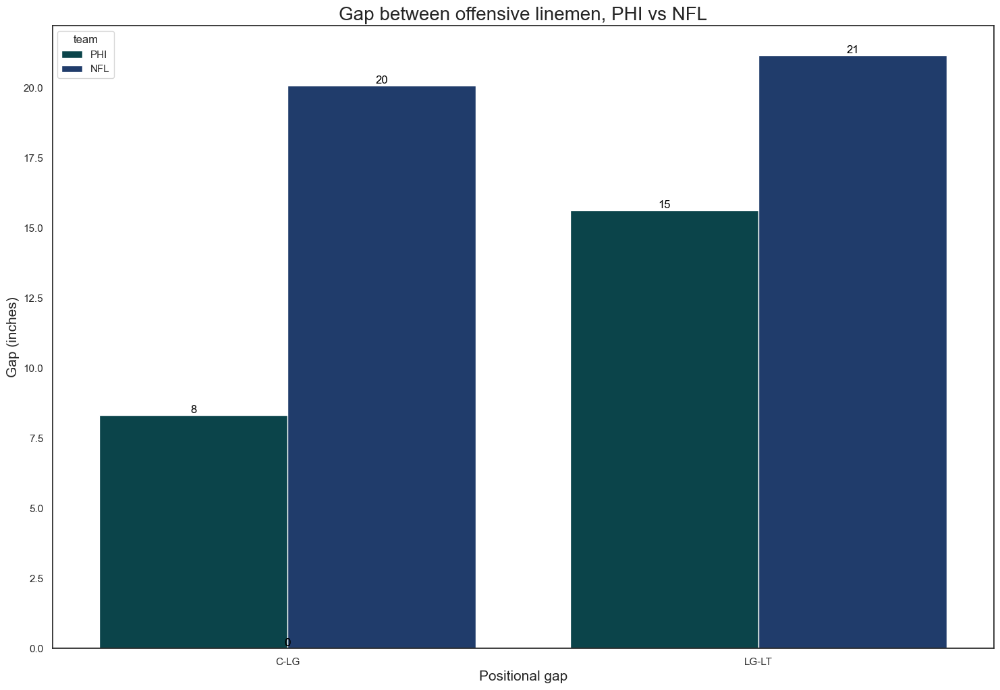

In [625]:
color_dict = {'PHI': '#004C54', 'NFL': '#143977'}
ax = sns.barplot(data = gap_inches, x = 'Positional gap', y='Gap (inches)',hue = 'team', palette=color_dict)

# Add labels to each bar
for p in ax.patches:
    ax.text(p.get_x() + p.get_width() / 2., p.get_height(), '%d' % int(p.get_height()), 
            fontsize=12, color='black', ha='center', va='bottom')
# Add a title
plt.title('Gap between offensive linemen, PHI vs NFL', fontsize=20)
# Add x and y axis labels
plt.xlabel('Positional gap', fontsize=15)
plt.ylabel('Gap (inches)', fontsize=15)
plt.show()

In [284]:
sneak_gap_graph_alt

,Team,detail_position,y_dis_from_C_nml,team_avg_gap,events
71,PHI,LG,-0.981333,1.274189,15
74,PHI,RT,2.213333,1.274189,15
73,PHI,RG,1.070000,1.274189,15
72,PHI,LT,-2.165714,1.274189,15
70,PHI,C,0.000000,1.274189,15
77,PIT,LT,-2.436000,1.382727,5
76,PIT,LG,-1.220000,1.382727,5
75,PIT,C,0.000000,1.382727,5
79,PIT,RT,2.495000,1.382727,5
78,PIT,RG,1.430000,1.382727,5


# Player First Contact

In [300]:
all_runs_tracking.head(10)

,gameId,playId,u_event,nflId,displayName,frameId,time,jerseyNumber,club,playDirection,x,y,s,a,dis,o,dir,event,team2,possessionTeam,homeTeamAbbr,visitorTeamAbbr,yardlineNumber,yardlineSide,possessionTeam_alt,PlayerTeam,team,position,weight,Dir_rad,ToLeft,TeamOnOffense,IsOnOffense,YardLine_std,yardlineSide_ha,X_std,Y_std,Dir_std,dx,dy,Orientation_rad,Orientation_std,Orientation_deg_std,Dir_deg_std,MPH,X_std_true,Y_std_true,ball_snap_frameId,QB_start_Y_std_true,Y_std_true_nml
0,2022090800,101,2022090800|101,35472.0,Rodger Saffold,1,2022-09-08 20:25:08.200000Z,76.0,BUF,left,73.13,27.64,0.01,0.01,0.00,267.95,182.22,NaN,BUF,away,LA,BUF,38,BUF,away,BUF,away,G,325.0,4.673643,True,away,True,38,away,46.87,25.69,1.532050,0.00,0.01,3.177372,0.035779,2.05,87.78,0.020455,-1.13,25.69,6.0,23.77,-1.92
1,2022090800,101,2022090800|101,35472.0,Rodger Saffold,2,2022-09-08 20:25:08.299999Z,76.0,BUF,left,73.13,27.64,0.01,0.01,0.00,267.95,182.56,NaN,BUF,away,LA,BUF,38,BUF,away,BUF,away,G,325.0,4.667709,True,away,True,38,away,46.87,25.69,1.526116,0.00,0.01,3.177372,0.035779,2.05,87.44,0.020455,-1.13,25.69,6.0,23.77,-1.92
2,2022090800,101,2022090800|101,35472.0,Rodger Saffold,3,2022-09-08 20:25:08.400000Z,76.0,BUF,left,73.13,27.63,0.01,0.01,0.00,267.95,182.15,NaN,BUF,away,LA,BUF,38,BUF,away,BUF,away,G,325.0,4.674864,True,away,True,38,away,46.87,25.70,1.533272,0.00,0.01,3.177372,0.035779,2.05,87.85,0.020455,-1.13,25.70,6.0,23.77,-1.93
3,2022090800,101,2022090800|101,35472.0,Rodger Saffold,4,2022-09-08 20:25:08.500000Z,76.0,BUF,left,73.13,27.64,0.00,0.01,0.01,274.37,179.54,NaN,BUF,away,LA,BUF,38,BUF,away,BUF,away,G,325.0,4.720417,True,away,True,38,away,46.87,25.69,1.578825,-0.00,0.00,3.065322,6.206914,355.63,90.46,0.000000,-1.13,25.69,6.0,23.77,-1.92
4,2022090800,101,2022090800|101,35472.0,Rodger Saffold,5,2022-09-08 20:25:08.599999Z,76.0,BUF,left,73.13,27.65,0.00,0.25,0.01,274.95,1.03,NaN,BUF,away,LA,BUF,38,BUF,away,BUF,away,G,325.0,1.552819,True,away,True,38,away,46.87,25.68,4.694412,-0.00,-0.00,3.055199,6.196792,355.05,268.97,0.000000,-1.13,25.68,6.0,23.77,-1.91
5,2022090800,101,2022090800|101,35472.0,Rodger Saffold,6,2022-09-08 20:25:08.700000Z,76.0,BUF,left,73.13,27.67,0.10,1.14,0.02,273.97,348.75,ball_snap,BUF,away,LA,BUF,38,BUF,away,BUF,away,G,325.0,1.767146,True,away,True,38,away,46.87,25.66,4.908739,0.02,-0.10,3.072303,6.213896,356.03,281.25,0.204545,-1.13,25.66,6.0,23.77,-1.89
6,2022090800,101,2022090800|101,35472.0,Rodger Saffold,7,2022-09-08 20:25:08.799999Z,76.0,BUF,left,73.11,27.71,0.42,2.43,0.04,272.30,346.58,NaN,BUF,away,LA,BUF,38,BUF,away,BUF,away,G,325.0,1.805020,True,away,True,38,away,46.89,25.62,4.946612,0.10,-0.41,3.101450,6.243043,357.70,283.42,0.859091,-1.11,25.62,6.0,23.77,-1.85
7,2022090800,101,2022090800|101,35472.0,Rodger Saffold,8,2022-09-08 20:25:08.900000Z,76.0,BUF,left,73.09,27.79,0.87,3.21,0.08,272.30,345.85,NaN,BUF,away,LA,BUF,38,BUF,away,BUF,away,G,325.0,1.817760,True,away,True,38,away,46.91,25.54,4.959353,0.21,-0.84,3.101450,6.243043,357.70,284.15,1.779545,-1.09,25.54,6.0,23.77,-1.77
8,2022090800,101,2022090800|101,35472.0,Rodger Saffold,9,2022-09-08 20:25:09.000000Z,76.0,BUF,left,73.05,27.92,1.45,3.80,0.14,274.76,342.86,NaN,BUF,away,LA,BUF,38,BUF,away,BUF,away,G,325.0,1.869946,True,away,True,38,away,46.95,25.41,5.011538,0.43,-1.39,3.058515,6.200108,355.24,287.14,2.965908,-1.05,25.41,6.0,23.77,-1.64
9,2022090800,101,2022090800|101,35472.0,Rodger Saffold,10,2022-09-08 20:25:09.099999Z,76.0,BUF,left,72.99,28.09,1.90,3.12,0.18,272.24,341.29,NaN,BUF,away,LA,BUF,38,BUF,away,BUF,away,G,325.0,1.897347,True,away,True,38,away,47.01,25.24,5.038940,0.61,-1.80,3.102497,6.244090,357.76,288.71,3.886363,-0.99,25.24,6.0,23.77,-1.47


In [ ]:
sneak_tracking_snap_loc = sneak_tracking[sneak_tracking['frameId'] == 6][['u_event','nflId','Y_std_true_nml','X_std_true']]
sneak_tracking_snap_loc = sneak_tracking_snap_loc.rename(columns={'X_std_true': 'player_snap_X_std_true','Y_std_true_nml':'player_snap_Y_std_true_nml'})
sneak_tracking_snap_loc.head(5)

In [555]:
sneak_tracking = pd.merge(all_runs_tracking, short_qb_run[['u_event']], how = 'inner', on = ['u_event'])
c1 = (sneak_tracking['position'] == 'QB')
c2 = (sneak_tracking['event'] == 'ball_snap')
c3 = (sneak_tracking['event'] == 'first_contact')

sneak_ball_snap = sneak_tracking[c2][['u_event','club','nflId','displayName','frameId','Y_std_true_nml','X_std_true']]
sneak_ball_snap = sneak_ball_snap.rename(columns={'frameId': 'ball_snap_frameId','X_std_true': 'player_snap_X_std_true','Y_std_true_nml':'player_snap_Y_std_true_nml'})
sneak_first_contact = sneak_tracking[c1&c3][['u_event','club','nflId','displayName','frameId']]
sneak_first_contact = sneak_first_contact.rename(columns={'frameId': 'first_contact_frameId'})
sneak_snap_to_contact = pd.merge(sneak_ball_snap,sneak_first_contact, how = 'left', on = ['u_event','club','nflId','displayName'])
sneak_snap_to_contact = sneak_snap_to_contact[sneak_snap_to_contact['first_contact_frameId'].notnull()]
sneak_snap_to_contact['is_phi'] = np.where(sneak_snap_to_contact['club'] == 'PHI',1,0)

sneak_tracking = pd.merge(sneak_tracking, sneak_ball_snap, how = 'inner', on = ['u_event','club','nflId','displayName'])

sneak_tracking['team3'] = np.where(sneak_tracking['team2'] == sneak_tracking['homeTeamAbbr'], 'home','away')
sneak_tracking['IsOnOffense2'] = np.where(sneak_tracking['possessionTeam_alt'] == sneak_tracking['team3'],'OFF','DEF')
sneak_tracking['PN_detail'] = sneak_tracking['position'] + ' - ' + sneak_tracking['displayName']

sneak_tracking.head(20)

,gameId,playId,u_event,nflId,displayName,frameId,time,jerseyNumber,club,playDirection,x,y,s,a,dis,o,dir,event,team2,possessionTeam,homeTeamAbbr,visitorTeamAbbr,yardlineNumber,yardlineSide,possessionTeam_alt,PlayerTeam,team,position,weight,Dir_rad,ToLeft,TeamOnOffense,IsOnOffense,YardLine_std,yardlineSide_ha,X_std,Y_std,Dir_std,dx,dy,Orientation_rad,Orientation_std,Orientation_deg_std,Dir_deg_std,MPH,X_std_true,Y_std_true,ball_snap_frameId_x,QB_start_Y_std_true,Y_std_true_nml,ball_snap_frameId_y,player_snap_Y_std_true_nml,player_snap_X_std_true,team3,IsOnOffense2,PN_detail
0,2022091101,2431,2022091101|2431,41264.0,Joel Bitonio,1,2022-09-11 15:00:14.599999Z,75.0,CLE,right,56.26,25.22,0.02,0.04,0.01,69.32,264.11,NaN,CLE,away,CAR,CLE,48,CLE,away,CLE,away,G,320.0,3.244393,False,away,True,48,away,56.26,25.22,3.244393,-0.02,-0.00,0.360934,0.360934,20.68,185.89,0.040909,-1.74,25.22,6.0,23.77,-1.45,6,-1.26,-1.4,away,OFF,G - Joel Bitonio
1,2022091101,2431,2022091101|2431,41264.0,Joel Bitonio,2,2022-09-11 15:00:14.700000Z,75.0,CLE,right,56.26,25.22,0.01,0.03,0.00,69.32,264.12,NaN,CLE,away,CAR,CLE,48,CLE,away,CLE,away,G,320.0,3.244218,False,away,True,48,away,56.26,25.22,3.244218,-0.01,-0.00,0.360934,0.360934,20.68,185.88,0.020455,-1.74,25.22,6.0,23.77,-1.45,6,-1.26,-1.4,away,OFF,G - Joel Bitonio
2,2022091101,2431,2022091101|2431,41264.0,Joel Bitonio,3,2022-09-11 15:00:14.799999Z,75.0,CLE,right,56.59,25.15,0.01,0.03,0.33,157.16,117.42,NaN,CLE,away,CAR,CLE,48,CLE,away,CLE,away,G,320.0,5.804616,False,away,True,48,away,56.59,25.15,5.804616,0.01,-0.00,5.111022,5.111022,292.84,332.58,0.020455,-1.41,25.15,6.0,23.77,-1.38,6,-1.26,-1.4,away,OFF,G - Joel Bitonio
3,2022091101,2431,2022091101|2431,41264.0,Joel Bitonio,4,2022-09-11 15:00:14.900000Z,75.0,CLE,right,56.71,25.10,0.02,0.04,0.13,197.52,114.10,NaN,CLE,away,CAR,CLE,48,CLE,away,CLE,away,G,320.0,5.862561,False,away,True,48,away,56.71,25.10,5.862561,0.02,-0.01,4.406607,4.406607,252.48,335.90,0.040909,-1.29,25.10,6.0,23.77,-1.33,6,-1.26,-1.4,away,OFF,G - Joel Bitonio
4,2022091101,2431,2022091101|2431,41264.0,Joel Bitonio,5,2022-09-11 15:00:15.000000Z,75.0,CLE,right,56.55,25.06,0.01,0.02,0.16,172.00,140.61,NaN,CLE,away,CAR,CLE,48,CLE,away,CLE,away,G,320.0,5.399874,False,away,True,48,away,56.55,25.06,5.399874,0.01,-0.01,4.852015,4.852015,278.00,309.39,0.020455,-1.45,25.06,6.0,23.77,-1.29,6,-1.26,-1.4,away,OFF,G - Joel Bitonio
5,2022091101,2431,2022091101|2431,41264.0,Joel Bitonio,6,2022-09-11 15:00:15.099999Z,75.0,CLE,right,56.60,25.03,0.01,0.02,0.05,189.92,135.80,ball_snap,CLE,away,CAR,CLE,48,CLE,away,CLE,away,G,320.0,5.483825,False,away,True,48,away,56.60,25.03,5.483825,0.01,-0.01,4.539252,4.539252,260.08,314.20,0.020455,-1.40,25.03,6.0,23.77,-1.26,6,-1.26,-1.4,away,OFF,G - Joel Bitonio
6,2022091101,2431,2022091101|2431,41264.0,Joel Bitonio,7,2022-09-11 15:00:15.200000Z,75.0,CLE,right,56.60,25.03,0.01,0.10,0.00,3.29,123.91,NaN,CLE,away,CAR,CLE,48,CLE,away,CLE,away,G,320.0,5.691344,False,away,True,48,away,56.60,25.03,5.691344,0.01,-0.01,1.513375,1.513375,86.71,326.09,0.020455,-1.40,25.03,6.0,23.77,-1.26,6,-1.26,-1.4,away,OFF,G - Joel Bitonio
7,2022091101,2431,2022091101|2431,41264.0,Joel Bitonio,8,2022-09-11 15:00:15.299999Z,75.0,CLE,right,56.86,25.03,0.11,0.80,0.26,0.62,94.58,run,CLE,away,CAR,CLE,48,CLE,away,CLE,away,G,320.0,6.203249,False,away,True,48,away,56.86,25.03,6.203249,0.11,-0.01,1.559975,1.559975,89.38,355.42,0.225000,-1.14,25.03,6.0,23.77,-1.26,6,-1.26,-1.4,away,OFF,G - Joel Bitonio
8,2022091101,2431,2022091101|2431,41264.0,Joel Bitonio,9,2022-09-11 15:00:15.400000Z,75.0,CLE,right,57.21,25.11,0.54,2.43,0.36,9.51,81.51,NaN,CLE,away,CAR,CLE,48,CLE,away,CLE,away,G,320.0,0.148178,False,away,True,48,away,57.21,25.11,0.148178,0.53,0.08,1.404816,1.404816,80.49,8.49,1.104545,-0.79,25.11,6.0,23.77,-1.34,6,-1.26,-1.4,away,OFF,G - Joel Bitonio
9,2022091101,2431,2022091101|2431,41264.0,Joel Bitonio,10,2022-09-11 15:00:15.500000Z,75.0,CLE,right,57.30,25.13,0.88,2.51,0.10,349.11,80.66,NaN,CLE,away,C

# Eagles Post Snap Movement

In [318]:
c1 = (sneak_tracking['club'] == 'PHI')
c2 = (sneak_tracking['position'].isin(['T','G','C','QB']))

phi_tracking = sneak_tracking[c1&c2]
phi_tracking.head(5)

,gameId,playId,u_event,nflId,displayName,frameId,time,jerseyNumber,club,playDirection,x,y,s,a,dis,o,dir,event,team2,possessionTeam,homeTeamAbbr,visitorTeamAbbr,yardlineNumber,yardlineSide,possessionTeam_alt,PlayerTeam,team,position,weight,Dir_rad,ToLeft,TeamOnOffense,IsOnOffense,YardLine_std,yardlineSide_ha,X_std,Y_std,Dir_std,dx,dy,Orientation_rad,Orientation_std,Orientation_deg_std,Dir_deg_std,MPH,X_std_true,Y_std_true,ball_snap_frameId,QB_start_Y_std_true,Y_std_true_nml
1610,2022091104,4469,2022091104|4469,37266.0,Jason Kelce,1,2022-09-11 16:17:43.500000Z,62.0,PHI,right,69.86,29.57,0.00,0.00,0.0,77.51,87.64,NaN,PHI,away,DET,PHI,40,DET,away,PHI,away,C,295.0,0.041190,False,away,True,60,home,69.86,29.57,0.041190,0.00,0.0,0.217992,0.217992,12.49,2.36,0.000000,-0.14,29.57,6.0,29.55,-0.02
1611,2022091104,4469,2022091104|4469,37266.0,Jason Kelce,2,2022-09-11 16:17:43.599999Z,62.0,PHI,right,69.86,29.57,0.00,0.00,0.0,77.51,87.22,NaN,PHI,away,DET,PHI,40,DET,away,PHI,away,C,295.0,0.048520,False,away,True,60,home,69.86,29.57,0.048520,0.00,0.0,0.217992,0.217992,12.49,2.78,0.000000,-0.14,29.57,6.0,29.55,-0.02
1612,2022091104,4469,2022091104|4469,37266.0,Jason Kelce,3,2022-09-11 16:17:43.700000Z,62.0,PHI,right,69.86,29.57,0.00,0.00,0.0,77.51,86.62,NaN,PHI,away,DET,PHI,40,DET,away,PHI,away,C,295.0,0.058992,False,away,True,60,home,69.86,29.57,0.058992,0.00,0.0,0.217992,0.217992,12.49,3.38,0.000000,-0.14,29.57,6.0,29.55,-0.02
1613,2022091104,4469,2022091104|4469,37266.0,Jason Kelce,4,2022-09-11 16:17:43.799999Z,62.0,PHI,right,69.87,29.57,0.00,0.06,0.0,78.49,88.09,NaN,PHI,away,DET,PHI,40,DET,away,PHI,away,C,295.0,0.033336,False,away,True,60,home,69.87,29.57,0.033336,0.00,0.0,0.200887,0.200887,11.51,1.91,0.000000,-0.13,29.57,6.0,29.55,-0.02
1614,2022091104,4469,2022091104|4469,37266.0,Jason Kelce,5,2022-09-11 16:17:43.900000Z,62.0,PHI,right,69.87,29.57,0.02,0.16,0.0,77.83,89.74,NaN,PHI,away,DET,PHI,40,DET,away,PHI,away,C,295.0,0.004538,False,away,True,60,home,69.87,29.57,0.004538,0.02,0.0,0.212407,0.212407,12.17,0.26,0.040909,-0.13,29.57,6.0,29.55,-0.02


In [322]:
phi_tracking.groupby(['u_event']).agg({'displayName':'nunique'}).reset_index()

,u_event,displayName
0,2022091104|4469,6
1,2022091901|2811,6
2,2022100209|1539,6
3,2022100209|1868,6
4,2022100209|222,6
5,2022100911|1158,6
6,2022100911|1179,6
7,2022100911|1200,6
8,2022100911|3650,6
9,2022100911|409,6


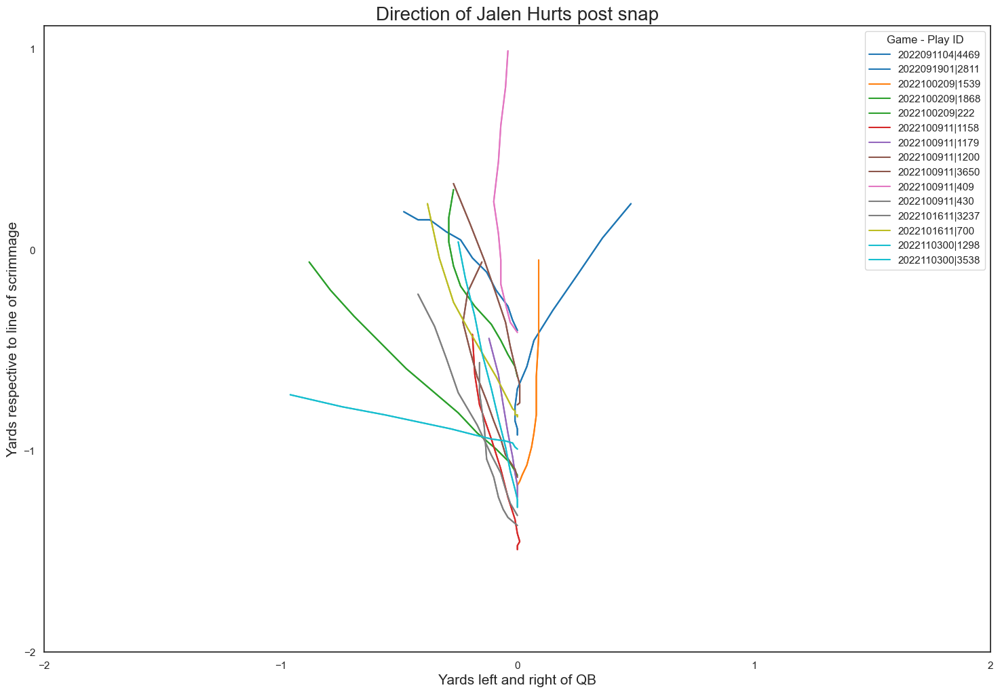

In [570]:
import matplotlib.pyplot as plt
df = jh
# Ensure your 'X_std_true' column is of type float
df['X_std_true'] = df['X_std_true'].astype(float)

# Sort your values
df = df.sort_values(by = ['u_event','position','time'], ascending = [True,True,True])

# Get unique categories
categories = df['u_event'].unique()

# Create a color map
cmap = plt.get_cmap('tab10')
colors = cmap(np.linspace(0, 1, len(categories)))

for i, category in enumerate(categories):
    # Subset to the category
    subset = df[df['u_event'] == category]
    # Make a separate call to plt.plot for each category
    plt.plot(subset['Y_std_true_nml'], subset['X_std_true'], color=colors[i])

for i, category in enumerate(categories):
    # Subset to the category
    subset = df[df['u_event'] == category]
    # Make a separate call to plt.plot for each category and add a label
    plt.plot(subset['Y_std_true_nml'], subset['X_std_true'], color=colors[i], label=category)

# Add a legend after the loop
plt.legend()
plt.legend(title="Game - Play ID")

# Add a title
plt.title("Direction of Jalen Hurts post snap", fontsize=20)

# Add x and y axis labels
plt.xlabel("Yards left and right of QB", fontsize=15)
plt.ylabel("Yards respective to line of scrimmage", fontsize=15)
plt.xticks(range(-2, 3))
plt.yticks(range(-2, 2))
plt.show()

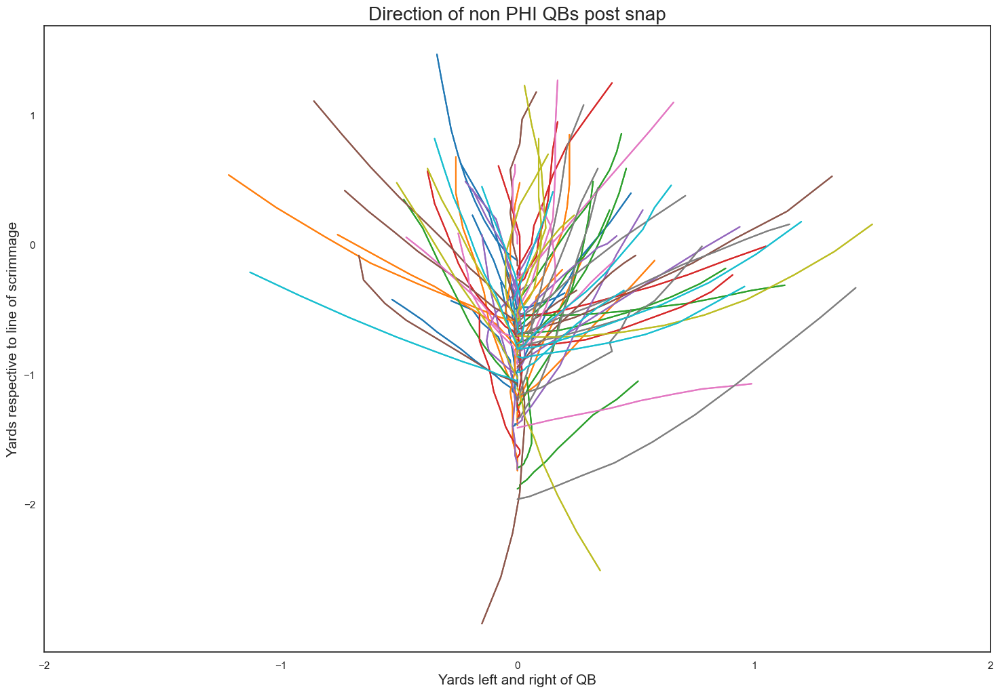

In [626]:
import matplotlib.pyplot as plt
df = not_jh
# Ensure your 'X_std_true' column is of type float
df['X_std_true'] = df['X_std_true'].astype(float)

# Sort your values
df = df.sort_values(by = ['u_event','position','time'], ascending = [True,True,True])

# Get unique categories
categories = df['u_event'].unique()

# Create a color map
cmap = plt.get_cmap('tab10')
colors = cmap(np.linspace(0, 1, len(categories)))

for i, category in enumerate(categories):
    # Subset to the category
    subset = df[df['u_event'] == category]
    # Make a separate call to plt.plot for each category
    plt.plot(subset['Y_std_true_nml'], subset['X_std_true'], color=colors[i])

for i, category in enumerate(categories):
    # Subset to the category
    subset = df[df['u_event'] == category]
    # Make a separate call to plt.plot for each category and add a label
    plt.plot(subset['Y_std_true_nml'], subset['X_std_true'], color=colors[i], label=category)

# Add a legend after the loop
#plt.legend()

plt.title("Direction of non PHI QBs post snap", fontsize=20)

# Add x and y axis labels
plt.xlabel("Yards left and right of QB", fontsize=15)
plt.ylabel("Yards respective to line of scrimmage", fontsize=15)
plt.xticks(range(-2, 3))
plt.yticks(range(-2, 2))
plt.show()

In [387]:
phi_tracking.groupby(['u_event']).agg({'displayName':'nunique'}).reset_index()

,u_event,displayName
0,2022091104|4469,6
1,2022091901|2811,6
2,2022100209|1539,6
3,2022100209|1868,6
4,2022100209|222,6
5,2022100911|1158,6
6,2022100911|1179,6
7,2022100911|1200,6
8,2022100911|3650,6
9,2022100911|409,6


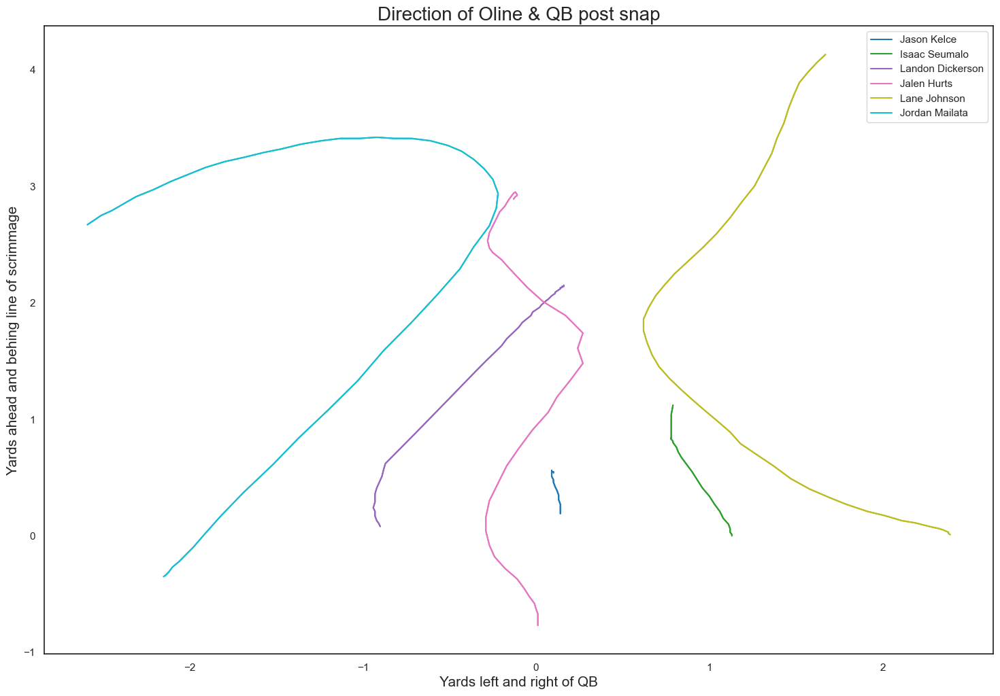

In [411]:
import matplotlib.pyplot as plt
df = phi_tracking[phi_tracking['u_event'] == '2022100209|222']
# Ensure your 'X_std_true' column is of type float
df['X_std_true'] = df['X_std_true'].astype(float)

# Sort your values
df = df.sort_values(by = ['u_event','position','time'], ascending = [True,True,True])

# Get unique categories
categories = df['displayName'].unique()

# Create a color map
cmap = plt.get_cmap('tab10')
colors = cmap(np.linspace(0, 1, len(categories)))

for i, category in enumerate(categories):
    # Subset to the category
    subset = df[df['displayName'] == category]
    # Make a separate call to plt.plot for each category
    plt.plot(subset['Y_std_true_nml'], subset['X_std_true'], color=colors[i])

for i, category in enumerate(categories):
    # Subset to the category
    subset = df[df['displayName'] == category]
    # Make a separate call to plt.plot for each category and add a label
    plt.plot(subset['Y_std_true_nml'], subset['X_std_true'], color=colors[i], label=category)

# Add a legend after the loop
plt.legend()

# Add a title
plt.title("Direction of Oline & QB post snap", fontsize=20)

# Add x and y axis labels
plt.xlabel("Yards left and right of QB", fontsize=15)
plt.ylabel("Yards ahead and behing line of scrimmage", fontsize=15)
plt.show()

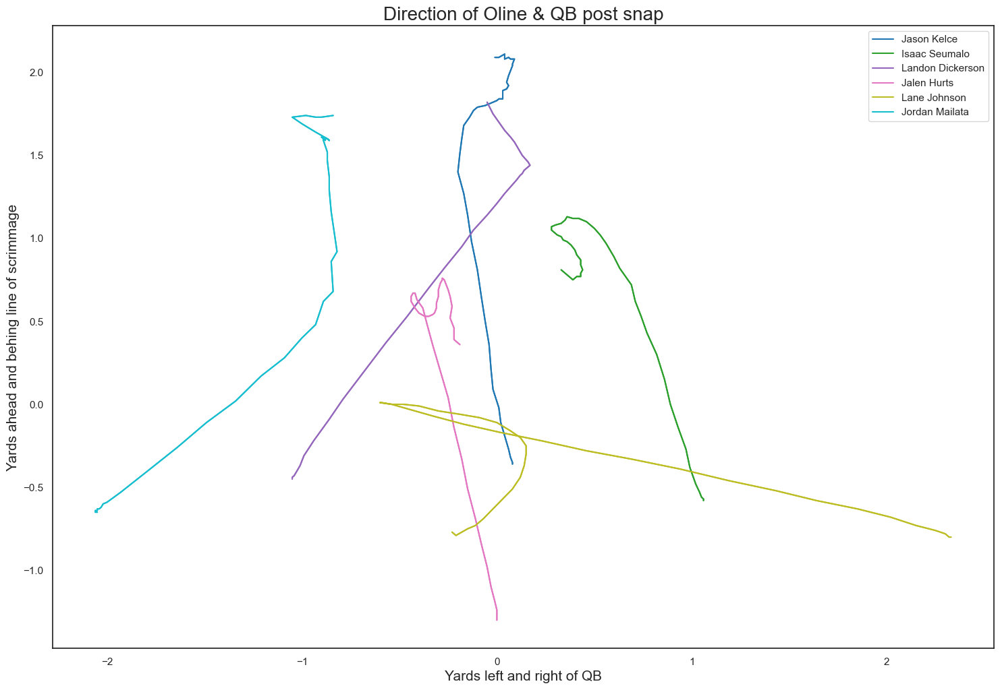

In [405]:
import matplotlib.pyplot as plt
df = phi_tracking[phi_tracking['u_event'] == '2022110300|3538']
# Ensure your 'X_std_true' column is of type float
df['X_std_true'] = df['X_std_true'].astype(float)

# Sort your values
df = df.sort_values(by = ['u_event','position','time'], ascending = [True,True,True])

# Get unique categories
categories = df['displayName'].unique()

# Create a color map
cmap = plt.get_cmap('tab10')
colors = cmap(np.linspace(0, 1, len(categories)))

for i, category in enumerate(categories):
    # Subset to the category
    subset = df[df['displayName'] == category]
    # Make a separate call to plt.plot for each category
    plt.plot(subset['Y_std_true_nml'], subset['X_std_true'], color=colors[i])

for i, category in enumerate(categories):
    # Subset to the category
    subset = df[df['displayName'] == category]
    # Make a separate call to plt.plot for each category and add a label
    plt.plot(subset['Y_std_true_nml'], subset['X_std_true'], color=colors[i], label=category)

# Add a legend after the loop
plt.legend()

# Add a title
plt.title("Direction of Oline & QB post snap", fontsize=20)

# Add x and y axis labels
plt.xlabel("Yards left and right of QB", fontsize=15)
plt.ylabel("Yards ahead and behing line of scrimmage", fontsize=15)
plt.show()

In [413]:
snap_big_boys.head(5)

,gameId,playId,u_event,nflId,displayName,frameId,time,jerseyNumber,club,playDirection,x,y,s,a,dis,o,dir,event,team2,possessionTeam,homeTeamAbbr,visitorTeamAbbr,yardlineNumber,yardlineSide,possessionTeam_alt,PlayerTeam,team,position,weight,Dir_rad,ToLeft,TeamOnOffense,IsOnOffense,YardLine_std,yardlineSide_ha,X_std,Y_std,Dir_std,dx,dy,Orientation_rad,Orientation_std,Orientation_deg_std,Dir_deg_std,MPH,X_std_true,Y_std_true,ball_snap_frameId,QB_start_Y_std_true,Y_std_true_nml,Football_X_std,Football_Y_std,distance_football,distance_football_rank,oline_at_snap,y_loc_rank,basic_position,C_X_std_true,C_Y_std_true,left_of_C_flg,right_of_C_flg,y_dis_from_C,left_dis_from_C_rank,right_dis_from_C_rank,detail_position
0,2022090800,101,2022090800|101,35472.0,Rodger Saffold,6,2022-09-08 20:25:08.700000Z,76.0,BUF,left,73.13,27.67,0.1,1.14,0.02,273.97,348.75,ball_snap,BUF,away,LA,BUF,38,BUF,away,BUF,away,G,325.0,1.767146,True,away,True,38,away,46.87,25.66,4.908739,0.02,-0.1,3.072303,6.213896,356.03,281.25,0.204545,-1.13,25.66,6.0,23.77,-1.89,47.96,23.81,2.147231,3.0,5,4.0,LG,-0.5,23.86,1,0,1.80,1.0,2.0,LG
1,2022090800,101,2022090800|101,42392.0,Mitch Morse,6,2022-09-08 20:25:08.700000Z,60.0,BUF,left,72.50,29.47,0.0,0.08,0.00,273.23,224.11,ball_snap,BUF,away,LA,BUF,38,BUF,away,BUF,away,C,305.0,3.942524,True,away,True,38,away,47.50,23.86,0.800932,0.00,0.0,3.085219,6.226811,356.77,45.89,0.000000,-0.50,23.86,6.0,23.77,-0.09,47.96,23.81,0.462709,1.0,5,3.0,C,-0.5,23.86,0,0,0.00,1.0,1.0,C
2,2022090800,101,2022090800|101,44875.0,Dion Dawkins,6,2022-09-08 20:25:08.700000Z,73.0,BUF,left,73.15,26.05,0.0,0.00,0.00,261.37,280.21,ball_snap,BUF,away,LA,BUF,38,BUF,away,BUF,away,T,320.0,2.963395,True,away,True,38,away,46.85,27.28,6.104987,0.00,-0.0,3.292215,0.150622,8.63,349.79,0.000000,-1.15,27.28,6.0,23.77,-3.51,47.96,23.81,3.643213,5.0,5,5.0,LT,-0.5,23.86,1,0,3.42,2.0,3.0,LT
3,2022090800,101,2022090800|101,48512.0,Ryan Bates,6,2022-09-08 20:25:08.700000Z,71.0,BUF,left,73.06,31.24,0.0,0.00,0.00,277.87,315.85,ball_snap,BUF,away,LA,BUF,38,BUF,away,BUF,away,C,300.0,2.341359,True,away,True,38,away,46.94,22.09,5.482952,0.00,-0.0,3.004235,6.145828,352.13,314.15,0.000000,-1.06,22.09,6.0,23.77,1.68,47.96,23.81,1.999700,2.0,5,2.0,RG,-0.5,23.86,0,1,1.77,2.0,1.0,RG
4,2022090800,101,2022090800|101,53522.0,Spencer Brown,6,2022-09-08 20:25:08.700000Z,79.0,BUF,left,73.15,32.80,0.0,0.00,0.00,267.12,339.31,ball_snap,BUF,away,LA,BUF,38,BUF,away,BUF,away,T,321.0,1.931905,True,away,True,38,away,46.85,20.53,5.073498,0.00,-0.0,3.191858,0.050265,2.88,290.69,0.000000,-1.15,20.53,6.0,23.77,3.24,47.96,23.81,3.462730,4.0,5,1.0,RT,-0.5,23.86,0,1,3.33,3.0,2.0,RT


In [419]:
phi_tracking_w_snap = pd.merge(phi_tracking,snap_big_boys[['u_event','nflId','detail_position']] , how = 'left', on = ['u_event','nflId'])
phi_tracking_w_snap['detail_position'] = np.where(phi_tracking_w_snap['position'] == 'QB','QB',phi_tracking_w_snap['detail_position'])
phi_tracking_w_snap = phi_tracking_w_snap[phi_tracking_w_snap['detail_position'].isin(['LT','LG','C','RG','RT','QB'])]

phi_tracking_w_snap_res = phi_tracking_w_snap.groupby(['detail_position','frameId']).agg({'X_std_true':'mean','Y_std_true_nml':'mean','u_event':'nunique'}).reset_index()
phi_tracking_w_snap_res = phi_tracking_w_snap_res[phi_tracking_w_snap_res['frameId'] <= 30]
phi_tracking_w_snap_res

,gameId,playId,u_event,nflId,displayName,frameId,time,jerseyNumber,club,playDirection,x,y,s,a,dis,o,dir,event,team2,possessionTeam,homeTeamAbbr,visitorTeamAbbr,yardlineNumber,yardlineSide,possessionTeam_alt,PlayerTeam,team,position,weight,Dir_rad,ToLeft,TeamOnOffense,IsOnOffense,YardLine_std,yardlineSide_ha,X_std,Y_std,Dir_std,dx,dy,Orientation_rad,Orientation_std,Orientation_deg_std,Dir_deg_std,MPH,X_std_true,Y_std_true,ball_snap_frameId,QB_start_Y_std_true,Y_std_true_nml,detail_position
0,2022091104,4469,2022091104|4469,37266.0,Jason Kelce,1,2022-09-11 16:17:43.500000Z,62.0,PHI,right,69.86,29.57,0.00,0.00,0.0,77.51,87.64,NaN,PHI,away,DET,PHI,40,DET,away,PHI,away,C,295.0,0.041190,False,away,True,60,home,69.86,29.57,0.041190,0.00,0.0,0.217992,0.217992,12.49,2.36,0.000000,-0.14,29.57,6.0,29.55,-0.02,C
1,2022091104,4469,2022091104|4469,37266.0,Jason Kelce,2,2022-09-11 16:17:43.599999Z,62.0,PHI,right,69.86,29.57,0.00,0.00,0.0,77.51,87.22,NaN,PHI,away,DET,PHI,40,DET,away,PHI,away,C,295.0,0.048520,False,away,True,60,home,69.86,29.57,0.048520,0.00,0.0,0.217992,0.217992,12.49,2.78,0.000000,-0.14,29.57,6.0,29.55,-0.02,C
2,2022091104,4469,2022091104|4469,37266.0,Jason Kelce,3,2022-09-11 16:17:43.700000Z,62.0,PHI,right,69.86,29.57,0.00,0.00,0.0,77.51,86.62,NaN,PHI,away,DET,PHI,40,DET,away,PHI,away,C,295.0,0.058992,False,away,True,60,home,69.86,29.57,0.058992,0.00,0.0,0.217992,0.217992,12.49,3.38,0.000000,-0.14,29.57,6.0,29.55,-0.02,C
3,2022091104,4469,2022091104|4469,37266.0,Jason Kelce,4,2022-09-11 16:17:43.799999Z,62.0,PHI,right,69.87,29.57,0.00,0.06,0.0,78.49,88.09,NaN,PHI,away,DET,PHI,40,DET,away,PHI,away,C,295.0,0.033336,False,away,True,60,home,69.87,29.57,0.033336,0.00,0.0,0.200887,0.200887,11.51,1.91,0.000000,-0.13,29.57,6.0,29.55,-0.02,C
4,2022091104,4469,2022091104|4469,37266.0,Jason Kelce,5,2022-09-11 16:17:43.900000Z,62.0,PHI,right,69.87,29.57,0.02,0.16,0.0,77.83,89.74,NaN,PHI,away,DET,PHI,40,DET,away,PHI,away,C,295.0,0.004538,False,away,True,60,home,69.87,29.57,0.004538,0.02,0.0,0.212407,0.212407,12.17,0.26,0.040909,-0.13,29.57,6.0,29.55,-0.02,C


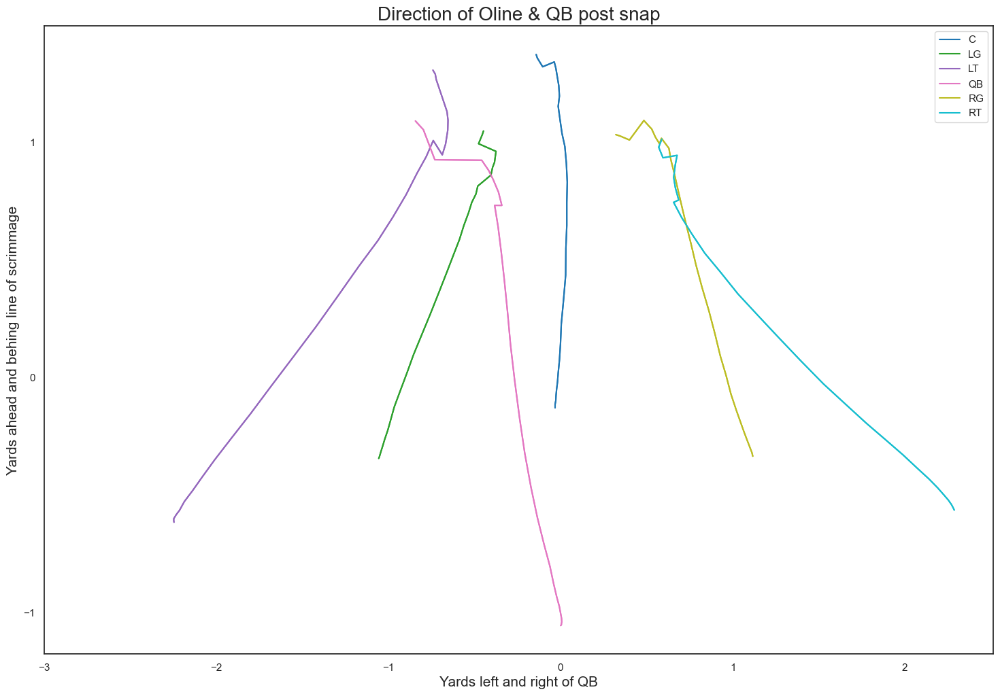

In [432]:
import matplotlib.pyplot as plt
df = phi_tracking_w_snap_res
# Ensure your 'X_std_true' column is of type float
df['X_std_true'] = df['X_std_true'].astype(float)

# Sort your values
#df = df.sort_values(by = ['u_event','position','time'], ascending = [True,True,True])

# Get unique categories
categories = df['detail_position'].unique()

# Create a color map
cmap = plt.get_cmap('tab10')
colors = cmap(np.linspace(0, 1, len(categories)))

for i, category in enumerate(categories):
    # Subset to the category
    subset = df[df['detail_position'] == category]
    # Make a separate call to plt.plot for each category
    plt.plot(subset['Y_std_true_nml'], subset['X_std_true'], color=colors[i])

for i, category in enumerate(categories):
    # Subset to the category
    subset = df[df['detail_position'] == category]
    # Make a separate call to plt.plot for each category and add a label
    plt.plot(subset['Y_std_true_nml'], subset['X_std_true'], color=colors[i], label=category)

# Add a legend after the loop
plt.legend()

# Add a title
plt.title("Direction of Oline & QB post snap", fontsize=20)

# Add x and y axis labels
plt.xlabel("Yards left and right of QB", fontsize=15)
plt.ylabel("Yards ahead and behing line of scrimmage", fontsize=15)
plt.xticks(range(-3, 3))
plt.yticks(range(-1, 2))
plt.show()

# Non Eagles Movement

In [635]:
n_phi_tracking_w_snap.groupby(['detail_position']).agg({'weight':'mean'})

,weight
detail_position,
C,311.821109
LG,317.507156
LT,316.937672
QB,227.013356
RG,308.876565
RT,315.511942


In [457]:
c1 = (sneak_tracking['club'] != 'PHI')
c2 = (sneak_tracking['position'].isin(['T','G','C','QB']))

n_phi_tracking = sneak_tracking[c1&c2]

n_phi_tracking_w_snap = pd.merge(n_phi_tracking,snap_big_boys[['u_event','nflId','detail_position']] , how = 'left', on = ['u_event','nflId'])
n_phi_tracking_w_snap['detail_position'] = np.where(n_phi_tracking_w_snap['position'] == 'QB','QB',n_phi_tracking_w_snap['detail_position'])
n_phi_tracking_w_snap = n_phi_tracking_w_snap[n_phi_tracking_w_snap['detail_position'].isin(['LT','LG','C','RG','RT','QB'])]

#QB sneak direction
c1 = (n_phi_tracking['position'] == 'QB')
c2 = (n_phi_tracking['frameId'].isin([6,11]))
c21 = (n_phi_tracking['frameId'] == 6)
c22 = (n_phi_tracking['frameId'] == 11)

n_phi_qb_bs = n_phi_tracking[c1&c21][['u_event','displayName','Y_std_true_nml','X_std_true']]
n_phi_qb_5s = n_phi_tracking[c1&c22][['u_event','displayName','Y_std_true_nml','X_std_true']]
n_phi_rd = pd.merge(n_phi_qb_bs,n_phi_qb_5s, how = 'left', on  = ['u_event','displayName'])
n_phi_rd['sneak_direction'] = np.where(n_phi_rd['Y_std_true_nml_y'] >= 0, 'Right','Left')

n_phi_tracking_w_snap = pd.merge(n_phi_tracking_w_snap, n_phi_rd[['u_event','sneak_direction']], how = 'left', on = 'u_event')
n_phi_tracking_w_snap = n_phi_tracking_w_snap[n_phi_tracking_w_snap['sneak_direction'] == 'Left']

n_phi_tracking_w_snap_res = n_phi_tracking_w_snap.groupby(['detail_position','frameId']).agg({'X_std_true':'mean','Y_std_true_nml':'mean','u_event':'nunique'}).reset_index()
n_phi_tracking_w_snap_res = n_phi_tracking_w_snap_res[n_phi_tracking_w_snap_res['frameId'] <= 30]
n_phi_tracking_w_snap_res.head(10)

,detail_position,frameId,X_std_true,Y_std_true_nml,u_event
0,C,1,0.046452,0.000645,31
1,C,2,0.050000,0.001290,31
2,C,3,0.054839,0.000323,31
3,C,4,0.060000,-0.001613,31
4,C,5,0.071613,-0.003226,31
5,C,6,0.088065,-0.008710,31
6,C,7,0.117742,-0.010968,31
7,C,8,0.156774,-0.014516,31
8,C,9,0.205161,-0.020000,31
9,C,10,0.262903,-0.029355,31


In [642]:
c1 = (sneak_tracking['club'] != 'PHI')
c2 = (sneak_tracking['position'].isin(['T','G','C','QB']))

n_phi_tracking = sneak_tracking[c1&c2]

n_phi_tracking_w_snap = pd.merge(n_phi_tracking,snap_big_boys[['u_event','nflId','detail_position']] , how = 'left', on = ['u_event','nflId'])
n_phi_tracking_w_snap['detail_position'] = np.where(n_phi_tracking_w_snap['position'] == 'QB','QB',n_phi_tracking_w_snap['detail_position'])
n_phi_tracking_w_snap = n_phi_tracking_w_snap[n_phi_tracking_w_snap['detail_position'].isin(['LT','LG','C','RG','RT','QB'])]

#QB sneak direction
c1 = (n_phi_tracking['position'] == 'QB')
c2 = (n_phi_tracking['frameId'].isin([6,11]))
c21 = (n_phi_tracking['frameId'] == 6)
c22 = (n_phi_tracking['frameId'] == 11)

n_phi_qb_bs = n_phi_tracking[c1&c21][['u_event','displayName','Y_std_true_nml','X_std_true']]
n_phi_qb_5s = n_phi_tracking[c1&c22][['u_event','displayName','Y_std_true_nml','X_std_true']]
n_phi_rd = pd.merge(n_phi_qb_bs,n_phi_qb_5s, how = 'left', on  = ['u_event','displayName'])
n_phi_rd['sneak_direction'] = np.where(n_phi_rd['Y_std_true_nml_y'] >= 0, 'Right','Left')

n_phi_tracking_w_snap = pd.merge(n_phi_tracking_w_snap, n_phi_rd[['u_event','sneak_direction']], how = 'left', on = 'u_event')
n_phi_tracking_w_snap.groupby(['sneak_direction']).agg({'u_event':'nunique'})

,u_event
sneak_direction,
Left,31
Right,52


In [643]:
print(52/(52+31))

0.6265060240963856


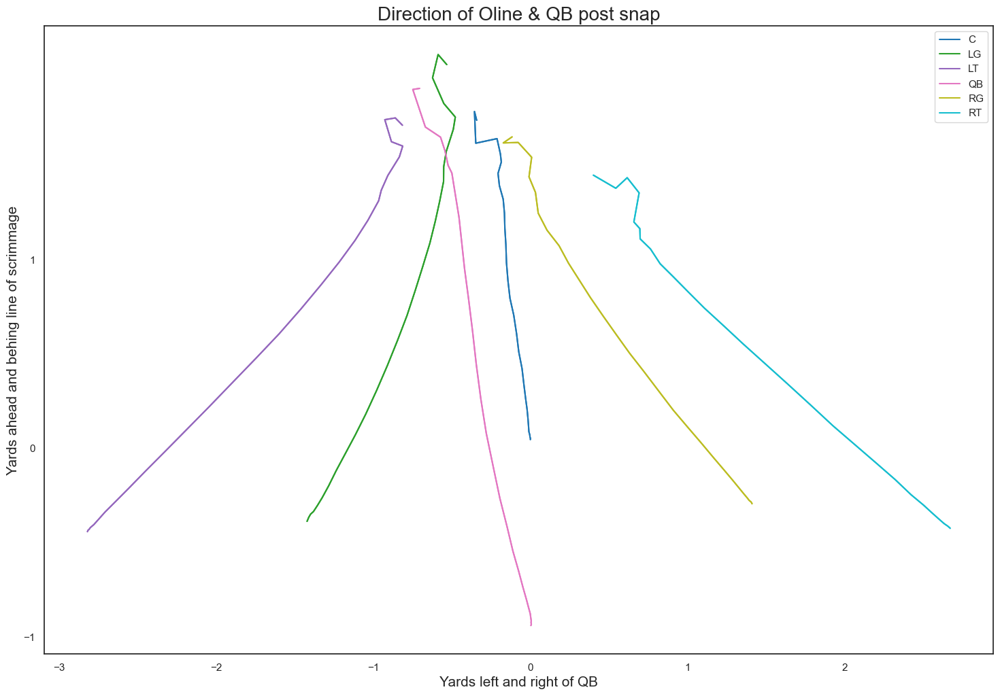

In [458]:
import matplotlib.pyplot as plt
df = n_phi_tracking_w_snap_res
# Ensure your 'X_std_true' column is of type float
df['X_std_true'] = df['X_std_true'].astype(float)

# Sort your values
#df = df.sort_values(by = ['u_event','position','time'], ascending = [True,True,True])

# Get unique categories
categories = df['detail_position'].unique()

# Create a color map
cmap = plt.get_cmap('tab10')
colors = cmap(np.linspace(0, 1, len(categories)))

for i, category in enumerate(categories):
    # Subset to the category
    subset = df[df['detail_position'] == category]
    # Make a separate call to plt.plot for each category
    plt.plot(subset['Y_std_true_nml'], subset['X_std_true'], color=colors[i])

for i, category in enumerate(categories):
    # Subset to the category
    subset = df[df['detail_position'] == category]
    # Make a separate call to plt.plot for each category and add a label
    plt.plot(subset['Y_std_true_nml'], subset['X_std_true'], color=colors[i], label=category)

# Add a legend after the loop
plt.legend()

# Add a title
plt.title("Direction of Oline & QB post snap", fontsize=20)

# Add x and y axis labels
plt.xlabel("Yards left and right of QB", fontsize=15)
plt.ylabel("Yards ahead and behing line of scrimmage", fontsize=15)
plt.xticks(range(-3, 3))
plt.yticks(range(-1, 2))
plt.show()

In [462]:
phi_tracking_w_snap_res['detail_position2'] = 'PHI - ' + phi_tracking_w_snap_res['detail_position']
phi_tracking_w_snap_res

,detail_position,frameId,X_std_true,Y_std_true_nml,u_event,detail_position2
0,C,1,-0.129333,-0.032000,15,PHI - C
1,C,2,-0.126000,-0.032000,15,PHI - C
2,C,3,-0.114667,-0.032000,15,PHI - C
3,C,4,-0.098667,-0.028000,15,PHI - C
4,C,5,-0.077333,-0.026667,15,PHI - C
5,C,6,-0.050667,-0.023333,15,PHI - C
6,C,7,-0.019333,-0.018000,15,PHI - C
7,C,8,0.018667,-0.014000,15,PHI - C
8,C,9,0.074667,-0.006667,15,PHI - C
9,C,10,0.143333,-0.000667,15,PHI - C


In [464]:
n_phi_tracking_w_snap_res['detail_position2'] = 'NFL - ' + n_phi_tracking_w_snap_res['detail_position']
n_phi_tracking_w_snap_res
frames = [phi_tracking_w_snap_res,n_phi_tracking_w_snap_res]
comb_avg_movement = pd.concat(frames)
comb_avg_movement

,detail_position,frameId,X_std_true,Y_std_true_nml,u_event,detail_position2
0,C,1,-0.129333,-0.032000,15,PHI - C
1,C,2,-0.126000,-0.032000,15,PHI - C
2,C,3,-0.114667,-0.032000,15,PHI - C
3,C,4,-0.098667,-0.028000,15,PHI - C
4,C,5,-0.077333,-0.026667,15,PHI - C
5,C,6,-0.050667,-0.023333,15,PHI - C
6,C,7,-0.019333,-0.018000,15,PHI - C
7,C,8,0.018667,-0.014000,15,PHI - C
8,C,9,0.074667,-0.006667,15,PHI - C
9,C,10,0.143333,-0.000667,15,PHI - C


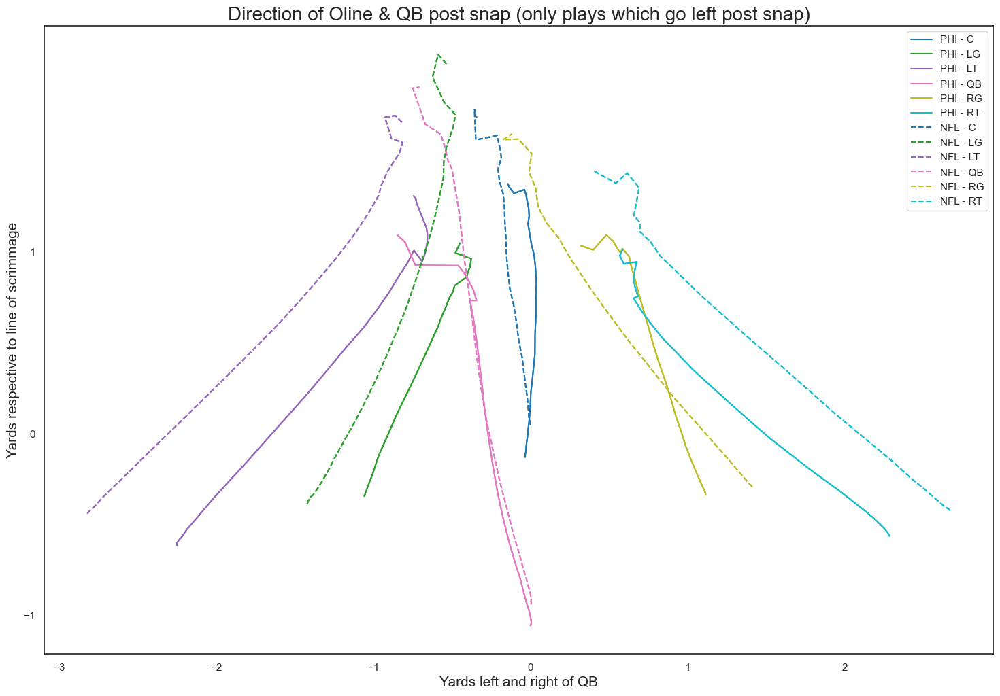

In [630]:
import matplotlib.pyplot as plt

phi_tracking_w_snap_res['detail_position2'] = 'PHI - ' + phi_tracking_w_snap_res['detail_position']
df = phi_tracking_w_snap_res

n_phi_tracking_w_snap_res['detail_position2'] = 'NFL - ' + n_phi_tracking_w_snap_res['detail_position']
df2 = n_phi_tracking_w_snap_res

# Ensure your 'X_std_true' column is of type float
df['X_std_true'] = df['X_std_true'].astype(float)
df2['X_std_true'] = df2['X_std_true'].astype(float)

# Get unique categories
categories = df['detail_position2'].unique()
categories2 = df2['detail_position2'].unique()

# Create a color map
cmap = plt.get_cmap('tab10')
colors = cmap(np.linspace(0, 1, len(categories)))
colors2 = cmap(np.linspace(0, 1, len(categories2)))

for i, category in enumerate(categories):
    # Subset to the category
    subset = df[df['detail_position2'] == category]
    # Make a separate call to plt.plot for each category
    plt.plot(subset['Y_std_true_nml'], subset['X_std_true'], color=colors[i])

for i, category in enumerate(categories):
    # Subset to the category
    subset = df[df['detail_position2'] == category]
    # Make a separate call to plt.plot for each category and add a label
    plt.plot(subset['Y_std_true_nml'], subset['X_std_true'], color=colors[i], label=category)


for i, category in enumerate(categories2):
    # Subset to the category
    subset2 = df2[df2['detail_position2'] == category]
    # Make a separate call to plt.plot for each category
    plt.plot(subset2['Y_std_true_nml'], subset2['X_std_true'], color=colors[i], linestyle = 'dashed')

for i, category in enumerate(categories2):
    # Subset to the category
    subset2 = df2[df2['detail_position2'] == category]
    # Make a separate call to plt.plot for each category and add a label
    plt.plot(subset2['Y_std_true_nml'], subset2['X_std_true'], color=colors[i],linestyle = 'dashed', label=category)

# Add a legend after the loop
plt.legend()

# Add a title
plt.title("Direction of Oline & QB post snap (only plays which go left post snap)", fontsize=20)

# Add x and y axis labels
plt.xlabel("Yards left and right of QB", fontsize=15)
plt.ylabel("Yards respective to line of scrimmage", fontsize=15)
plt.xticks(range(-3, 3))
plt.yticks(range(-1, 2))
plt.show()

# How the opposition defence defends

In [631]:
sneak_tracking.groupby(['position']).agg({'u_event':'nunique','weight':'mean'}).reset_index()

,position,u_event,weight
0,C,96,304.833710
1,CB,98,194.077770
2,DB,6,225.000000
3,DE,82,275.552270
4,DT,88,310.018884
5,FB,11,258.564165
6,FS,74,202.984751
7,G,98,312.896169
8,ILB,88,234.693312
9,MLB,9,243.458333


In [556]:
#sneak_tracking['team3'] = np.where(sneak_tracking['team2'] == sneak_tracking['homeTeamAbbr'], 'home','away')
#sneak_tracking['IsOnOffense2'] = np.where(sneak_tracking['possessionTeam_alt'] == sneak_tracking['team3'],'OFF','DEF')
#sneak_tracking['PN_detail'] = sneak_tracking['position'] + ' - ' + sneak_tracking['displayName']
sneak_tracking.head(5)


,gameId,playId,u_event,nflId,displayName,frameId,time,jerseyNumber,club,playDirection,x,y,s,a,dis,o,dir,event,team2,possessionTeam,homeTeamAbbr,visitorTeamAbbr,yardlineNumber,yardlineSide,possessionTeam_alt,PlayerTeam,team,position,weight,Dir_rad,ToLeft,TeamOnOffense,IsOnOffense,YardLine_std,yardlineSide_ha,X_std,Y_std,Dir_std,dx,dy,Orientation_rad,Orientation_std,Orientation_deg_std,Dir_deg_std,MPH,X_std_true,Y_std_true,ball_snap_frameId_x,QB_start_Y_std_true,Y_std_true_nml,ball_snap_frameId_y,player_snap_Y_std_true_nml,player_snap_X_std_true,team3,IsOnOffense2,PN_detail
0,2022091101,2431,2022091101|2431,41264.0,Joel Bitonio,1,2022-09-11 15:00:14.599999Z,75.0,CLE,right,56.26,25.22,0.02,0.04,0.01,69.32,264.11,NaN,CLE,away,CAR,CLE,48,CLE,away,CLE,away,G,320.0,3.244393,False,away,True,48,away,56.26,25.22,3.244393,-0.02,-0.00,0.360934,0.360934,20.68,185.89,0.040909,-1.74,25.22,6.0,23.77,-1.45,6,-1.26,-1.4,away,OFF,G - Joel Bitonio
1,2022091101,2431,2022091101|2431,41264.0,Joel Bitonio,2,2022-09-11 15:00:14.700000Z,75.0,CLE,right,56.26,25.22,0.01,0.03,0.00,69.32,264.12,NaN,CLE,away,CAR,CLE,48,CLE,away,CLE,away,G,320.0,3.244218,False,away,True,48,away,56.26,25.22,3.244218,-0.01,-0.00,0.360934,0.360934,20.68,185.88,0.020455,-1.74,25.22,6.0,23.77,-1.45,6,-1.26,-1.4,away,OFF,G - Joel Bitonio
2,2022091101,2431,2022091101|2431,41264.0,Joel Bitonio,3,2022-09-11 15:00:14.799999Z,75.0,CLE,right,56.59,25.15,0.01,0.03,0.33,157.16,117.42,NaN,CLE,away,CAR,CLE,48,CLE,away,CLE,away,G,320.0,5.804616,False,away,True,48,away,56.59,25.15,5.804616,0.01,-0.00,5.111022,5.111022,292.84,332.58,0.020455,-1.41,25.15,6.0,23.77,-1.38,6,-1.26,-1.4,away,OFF,G - Joel Bitonio
3,2022091101,2431,2022091101|2431,41264.0,Joel Bitonio,4,2022-09-11 15:00:14.900000Z,75.0,CLE,right,56.71,25.10,0.02,0.04,0.13,197.52,114.10,NaN,CLE,away,CAR,CLE,48,CLE,away,CLE,away,G,320.0,5.862561,False,away,True,48,away,56.71,25.10,5.862561,0.02,-0.01,4.406607,4.406607,252.48,335.90,0.040909,-1.29,25.10,6.0,23.77,-1.33,6,-1.26,-1.4,away,OFF,G - Joel Bitonio
4,2022091101,2431,2022091101|2431,41264.0,Joel Bitonio,5,2022-09-11 15:00:15.000000Z,75.0,CLE,right,56.55,25.06,0.01,0.02,0.16,172.00,140.61,NaN,CLE,away,CAR,CLE,48,CLE,away,CLE,away,G,320.0,5.399874,False,away,True,48,away,56.55,25.06,5.399874,0.01,-0.01,4.852015,4.852015,278.00,309.39,0.020455,-1.45,25.06,6.0,23.77,-1.29,6,-1.26,-1.4,away,OFF,G - Joel Bitonio


<Axes: xlabel='Y_std_true_nml', ylabel='X_std_true'>

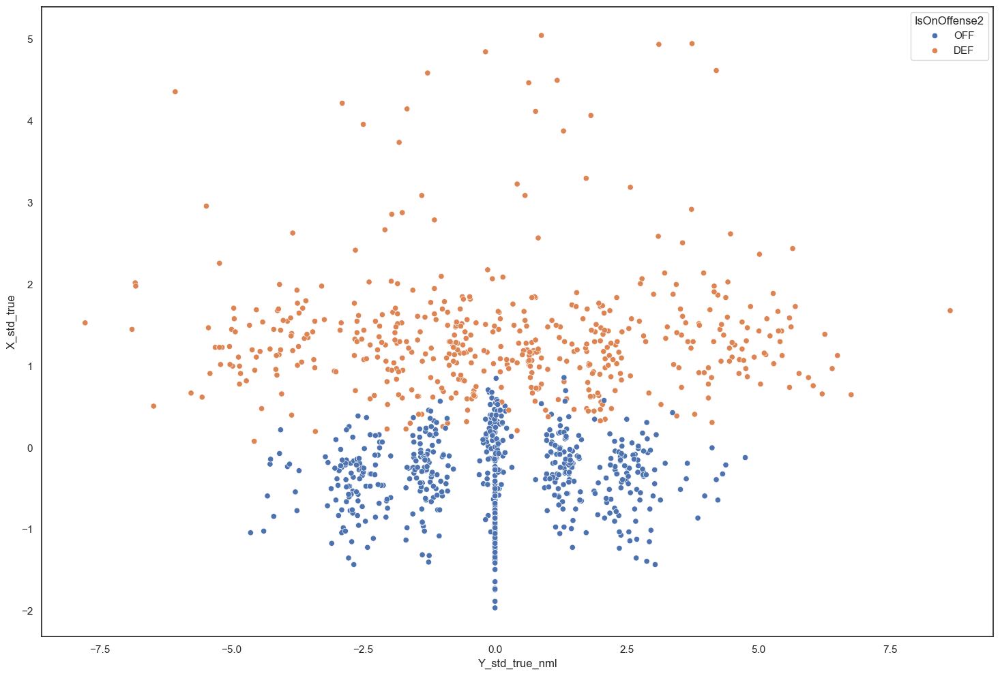

In [557]:
c1 = (sneak_tracking['frameId'] == 6)
c2 = (sneak_tracking['position'].isin(['T','G','C','QB','DE','DT','NT','OLB']))
sns.scatterplot(data = sneak_tracking[c1&c2], x = 'Y_std_true_nml', y  = 'X_std_true', hue = 'IsOnOffense2')

In [558]:
c1 = (sneak_tracking['frameId'] == 6)
c2 = (sneak_tracking['position'].isin(['T','G','C','QB','DE','DT','NT','OLB']))
c3 = (sneak_tracking['X_std_true'] <= 2)
c4 = (sneak_tracking['Y_std_true_nml'] <= 6)
c5 = (sneak_tracking['Y_std_true_nml'] >= -6)
def_tracking = sneak_tracking[c1&c2&c3&c4&c5]
def_tracking

,gameId,playId,u_event,nflId,displayName,frameId,time,jerseyNumber,club,playDirection,x,y,s,a,dis,o,dir,event,team2,possessionTeam,homeTeamAbbr,visitorTeamAbbr,yardlineNumber,yardlineSide,possessionTeam_alt,PlayerTeam,team,position,weight,Dir_rad,ToLeft,TeamOnOffense,IsOnOffense,YardLine_std,yardlineSide_ha,X_std,Y_std,Dir_std,dx,dy,Orientation_rad,Orientation_std,Orientation_deg_std,Dir_deg_std,MPH,X_std_true,Y_std_true,ball_snap_frameId_x,QB_start_Y_std_true,Y_std_true_nml,ball_snap_frameId_y,player_snap_Y_std_true_nml,player_snap_X_std_true,team3,IsOnOffense2,PN_detail
5,2022091101,2431,2022091101|2431,41264.0,Joel Bitonio,6,2022-09-11 15:00:15.099999Z,75.0,CLE,right,56.60,25.03,0.01,0.02,0.05,189.92,135.80,ball_snap,CLE,away,CAR,CLE,48,CLE,away,CLE,away,G,320.0,5.483825,False,away,True,48,away,56.60,25.03,5.483825,0.01,-0.01,4.539252,4.539252,260.08,314.20,0.020455,-1.40,25.03,6.0,23.77,-1.26,6,-1.26,-1.40,away,OFF,G - Joel Bitonio
89,2022091101,2431,2022091101|2431,42436.0,Henry Anderson,6,2022-09-11 15:00:15.099999Z,94.0,CAR,right,58.61,19.72,0.04,0.18,0.02,319.54,303.36,ball_snap,CAR,away,CAR,CLE,48,CLE,away,CAR,home,DE,301.0,2.559351,False,home,True,48,away,58.61,19.72,2.559351,-0.03,0.02,2.276957,2.276957,130.46,146.64,0.081818,0.61,19.72,6.0,23.77,4.05,6,4.05,0.61,home,DEF,DE - Henry Anderson
117,2022091101,2431,2022091101|2431,43380.0,Jacoby Brissett,6,2022-09-11 15:00:15.099999Z,7.0,CLE,right,56.62,23.77,0.00,0.00,0.00,56.78,159.55,ball_snap,CLE,away,CAR,CLE,48,CLE,away,CLE,away,QB,235.0,5.069309,False,away,True,48,away,56.62,23.77,5.069309,0.00,-0.00,0.579798,0.579798,33.22,290.45,0.000000,-1.38,23.77,6.0,23.77,0.00,6,0.00,-1.38,away,OFF,QB - Jacoby Brissett
173,2022091101,2431,2022091101|2431,44870.0,Ethan Pocic,6,2022-09-11 15:00:15.099999Z,55.0,CLE,right,57.50,23.69,0.35,0.97,0.03,131.25,274.55,ball_snap,CLE,away,CAR,CLE,48,CLE,away,CLE,away,C,320.0,3.062180,False,away,True,48,away,57.50,23.69,3.062180,-0.35,0.03,5.563237,5.563237,318.75,175.45,0.715909,-0.50,23.69,6.0,23.77,0.08,6,0.08,-0.50,away,OFF,C - Ethan Pocic
285,2022091101,2431,2022091101|2431,46235.0,Wyatt Teller,6,2022-09-11 15:00:15.099999Z,77.0,CLE,right,57.35,22.16,0.62,1.45,0.08,188.29,251.19,ball_snap,CLE,away,CAR,CLE,48,CLE,away,CLE,away,G,315.0,3.469889,False,away,True,48,away,57.35,22.16,3.469889,-0.59,-0.20,4.567701,4.567701,261.71,198.81,1.268182,-0.65,22.16,6.0,23.77,1.61,6,1.61,-0.65,away,OFF,G - Wyatt Teller
341,2022091101,2431,2022091101|2431,47799.0,Brian Burns,6,2022-09-11 15:00:15.099999Z,53.0,CAR,right,59.00,28.62,0.57,1.60,0.06,83.10,235.42,ball_snap,CAR,away,CAR,CLE,48,CLE,away,CAR,home,OLB,250.0,3.745128,False,home,True,48,away,59.00,28.62,3.745128,-0.47,-0.32,0.120428,0.120428,6.90,214.58,1.165909,1.00,28.62,6.0,23.77,-4.85,6,-4.85,1.00,home,DEF,OLB - Brian Burns
369,2022091101,2431,2022091101|2431,52418.0,Jedrick Wills,6,2022-09-11 15:00:15.099999Z,71.0,CLE,right,57.29,26.95,0.28,0.95,0.04,204.99,175.71,ball_snap,CLE,away,CAR,CLE,48,CLE,away,CLE,away,T,320.0,4.787264,False,away,True,48,away,57.29,26.95,4.787264,0.02,-0.28,4.276231,4.276231,245.01,274.29,0.572727,-0.71,26.95,6.0,23.77,-3.18,6,-3.18,-0.71,away,OFF,T - Jedrick Wills
425,2022091101,2431,2022091101|2431,52592.0,Bravvion Roy,6,2022-09-11 15:00:15.099999Z,93.0,CAR,right,58.81,24.86,0.41,1.96,0.05,263.26,3.85,ball_snap,CAR,away,CAR,CLE,48,CLE,away,CAR,home,DT,333.0,1.503601,False,home,True,48,away,58.81,24.86,1.503601,0.03,0.41,3.259228,3.259228,186.74,86.15,0.838636,0.81,24.86,6.0,23.77,-1.09,6,-1.09,0.81,home,DEF,DT - Bravvion Roy
537,2022091101,2431,2022091101|2431,53539.0,James Hudson,6,2022-09-11 15:00:15.099999Z,66.0,CLE,right,56.93,21.38,0.35,0.24,0.03,352.60,26.21,ball_snap,CLE,away,CAR,CLE,48,CLE,away,CLE,away,T,310.0,1.113346,False,away,True,48,away,56.93,21.38,1.113346,0.15,0.31,1.699951,1.699951,97.40,63.79,0.715909,-1.07,21.38,6.0,23.77,2.39,6,2.39,-1.07,away,OFF,T - James Hudson
565,2022091101,2431,2022091101|2431,53661.0,Phil Hoskins,6,2022-09-11 15:00:1

<Axes: xlabel='Y_std_true_nml', ylabel='X_std_true'>

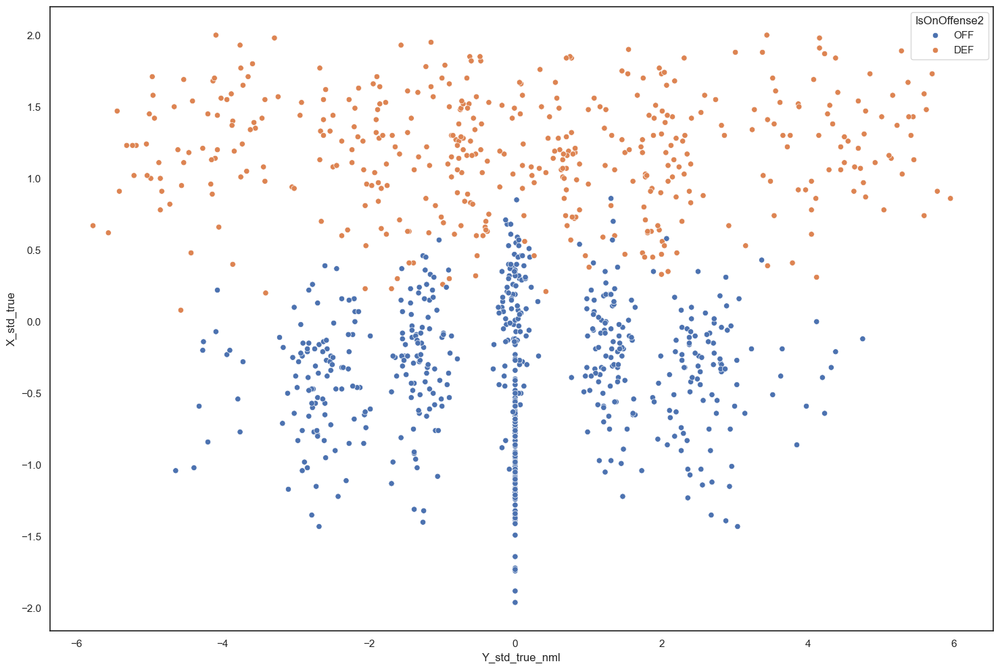

In [559]:
sns.scatterplot(data = def_tracking, x = 'Y_std_true_nml', y  = 'X_std_true', hue = 'IsOnOffense2')

In [560]:
eagles_plays = phi_tracking.groupby(['u_event']).agg({'displayName':'nunique'}).reset_index()
eagles_plays.head(5)

,u_event,displayName
0,2022091104|4469,6
1,2022091901|2811,6
2,2022100209|1539,6
3,2022100209|1868,6
4,2022100209|222,6


<Axes: xlabel='Y_std_true_nml', ylabel='X_std_true'>

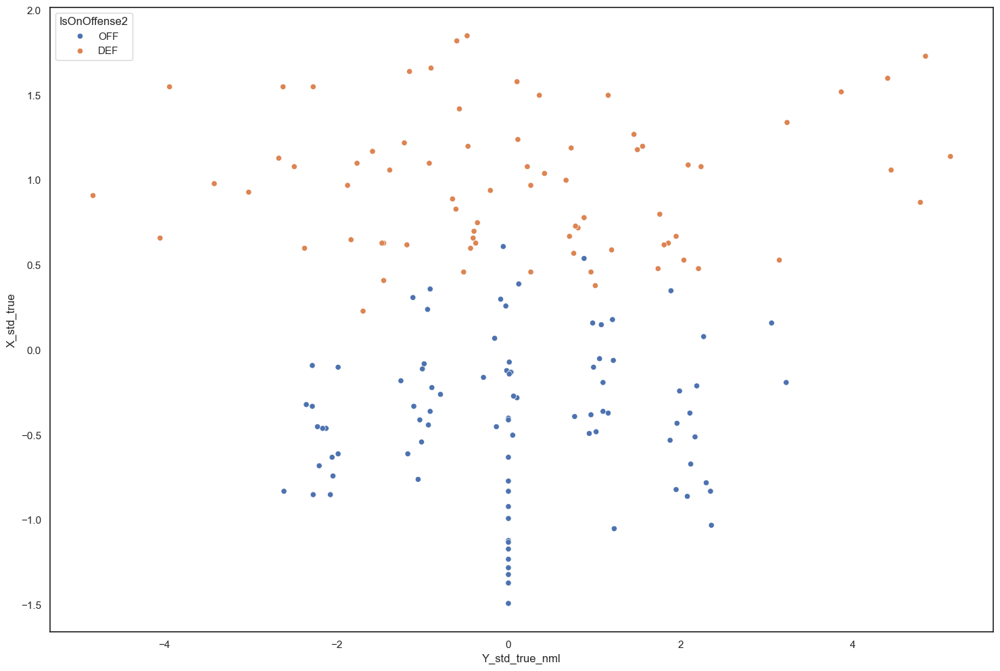

In [497]:
phi_def_tracking = pd.merge(def_tracking,eagles_plays[['u_event']], how = 'inner', on = 'u_event')
sns.scatterplot(data = phi_def_tracking, x = 'Y_std_true_nml', y  = 'X_std_true', hue = 'IsOnOffense2')

In [506]:
c1 = (sneak_tracking['u_event'] == '2022091104|4469')
c2 = (sneak_tracking['position'].isin(['T','G','C','QB','DE','DT','NT','OLB']))
sneak_tracking[c1&c2]

,gameId,playId,u_event,nflId,displayName,frameId,time,jerseyNumber,club,playDirection,x,y,s,a,dis,o,dir,event,team2,possessionTeam,homeTeamAbbr,visitorTeamAbbr,yardlineNumber,yardlineSide,possessionTeam_alt,PlayerTeam,team,position,weight,Dir_rad,ToLeft,TeamOnOffense,IsOnOffense,YardLine_std,yardlineSide_ha,X_std,Y_std,Dir_std,dx,dy,Orientation_rad,Orientation_std,Orientation_deg_std,Dir_deg_std,MPH,X_std_true,Y_std_true,ball_snap_frameId,QB_start_Y_std_true,Y_std_true_nml,IsOnOffense2,team3,PN_detail
1610,2022091104,4469,2022091104|4469,37266.0,Jason Kelce,1,2022-09-11 16:17:43.500000Z,62.0,PHI,right,69.86,29.57,0.00,0.00,0.00,77.51,87.64,NaN,PHI,away,DET,PHI,40,DET,away,PHI,away,C,295.0,0.041190,False,away,True,60,home,69.86,29.57,0.041190,0.00,0.00,0.217992,0.217992,12.49,2.36,0.000000,-0.14,29.57,6.0,29.55,-0.02,OFF,away,C - Jason Kelce
1611,2022091104,4469,2022091104|4469,37266.0,Jason Kelce,2,2022-09-11 16:17:43.599999Z,62.0,PHI,right,69.86,29.57,0.00,0.00,0.00,77.51,87.22,NaN,PHI,away,DET,PHI,40,DET,away,PHI,away,C,295.0,0.048520,False,away,True,60,home,69.86,29.57,0.048520,0.00,0.00,0.217992,0.217992,12.49,2.78,0.000000,-0.14,29.57,6.0,29.55,-0.02,OFF,away,C - Jason Kelce
1612,2022091104,4469,2022091104|4469,37266.0,Jason Kelce,3,2022-09-11 16:17:43.700000Z,62.0,PHI,right,69.86,29.57,0.00,0.00,0.00,77.51,86.62,NaN,PHI,away,DET,PHI,40,DET,away,PHI,away,C,295.0,0.058992,False,away,True,60,home,69.86,29.57,0.058992,0.00,0.00,0.217992,0.217992,12.49,3.38,0.000000,-0.14,29.57,6.0,29.55,-0.02,OFF,away,C - Jason Kelce
1613,2022091104,4469,2022091104|4469,37266.0,Jason Kelce,4,2022-09-11 16:17:43.799999Z,62.0,PHI,right,69.87,29.57,0.00,0.06,0.00,78.49,88.09,NaN,PHI,away,DET,PHI,40,DET,away,PHI,away,C,295.0,0.033336,False,away,True,60,home,69.87,29.57,0.033336,0.00,0.00,0.200887,0.200887,11.51,1.91,0.000000,-0.13,29.57,6.0,29.55,-0.02,OFF,away,C - Jason Kelce
1614,2022091104,4469,2022091104|4469,37266.0,Jason Kelce,5,2022-09-11 16:17:43.900000Z,62.0,PHI,right,69.87,29.57,0.02,0.16,0.00,77.83,89.74,NaN,PHI,away,DET,PHI,40,DET,away,PHI,away,C,295.0,0.004538,False,away,True,60,home,69.87,29.57,0.004538,0.02,0.00,0.212407,0.212407,12.17,0.26,0.040909,-0.13,29.57,6.0,29.55,-0.02,OFF,away,C - Jason Kelce
1615,2022091104,4469,2022091104|4469,37266.0,Jason Kelce,6,2022-09-11 16:17:44.000000Z,62.0,PHI,right,69.88,29.57,0.06,0.33,0.01,78.96,101.58,ball_snap,PHI,away,DET,PHI,40,DET,away,PHI,away,C,295.0,6.081076,False,away,True,60,home,69.88,29.57,6.081076,0.06,-0.01,0.192684,0.192684,11.04,348.42,0.122727,-0.12,29.57,6.0,29.55,-0.02,OFF,away,C - Jason Kelce
1616,2022091104,4469,2022091104|4469,37266.0,Jason Kelce,7,2022-09-11 16:17:44.099999Z,62.0,PHI,right,69.89,29.56,0.10,0.39,0.01,77.64,102.65,NaN,PHI,away,DET,PHI,40,DET,away,PHI,away,C,295.0,6.062401,False,away,True,60,home,69.89,29.56,6.062401,0.10,-0.02,0.215723,0.215723,12.36,347.35,0.204545,-0.11,29.56,6.0,29.55,-0.01,OFF,away,C - Jason Kelce
1617,2022091104,4469,2022091104|4469,37266.0,Jason Kelce,8,2022-09-11 16:17:44.200000Z,62.0,PHI,right,69.92,29.55,0.27,0.86,0.04,78.63,109.87,NaN,PHI,away,DET,PHI,40,DET,away,PHI,away,C,295.0,5.936388,False,away,True,60,home,69.92,29.55,5.936388,0.25,-0.09,0.198444,0.198444,11.37,340.13,0.552273,-0.08,29.55,6.0,29.55,0.00,OFF,away,C - Jason Kelce
1618,2022091104,4469,2022091104|4469,37266.0,Jason Kelce,9,2022-09-11 16:17:44.299999Z,62.0,PHI,right,69.95,29.54,0.35,0.69,0.03,77.19,110.63,NaN,PHI,away,DET,PHI,40,DET,away,PHI,away,C,295.0,5.923124,False,away,True,60,home,69.95,29.54,5.923124,0.33,-0.12,0.223577,0.223577,12.81,339.37,0.715909,-0.05,29.54,6.0,29.55,0.01,OFF,away,C - Jason Kelce
1619,2022091104,4469,2022091104|4469,37266.0,Jason Kelce,10,2022-09-11 16:17:44.400000Z,62.0,PHI,right,70.06,29.49,0.73,1.28,0.12,80.69,113.80,NaN,PHI,away,DET,PHI,40,DET,away,PHI,away,C,295.0,5.867797,False,away,True,60,home,70.06,29.49,5.867797,0.67,-0.29,0.162490,0.162490,9.31,336.20,1.493181,0.06,29.49,6.0,29.55,0.06,OFF,away,C - Jason Kelce


In [517]:
all_runs[all_runs['u_event'] == '2022100209|1539'].head(5)

,gameId,playId,u_event,ballCarrierId,ballCarrierDisplayName,playDescription,quarter,down,yardsToGo,possessionTeam,defensiveTeam,yardlineSide,yardlineNumber,gameClock,preSnapHomeScore,preSnapVisitorScore,passResult,passLength,penaltyYards,prePenaltyPlayResult,playResult,playNullifiedByPenalty,absoluteYardlineNumber,offenseFormation,defendersInTheBox,passProbability,preSnapHomeTeamWinProbability,preSnapVisitorTeamWinProbability,homeTeamWinProbabilityAdded,visitorTeamWinProbilityAdded,expectedPoints,expectedPointsAdded,foulName1,foulName2,foulNFLId1,foulNFLId2,run_pass,season,week,old_game_id,play_id,yardline_100,run_location,run_gap,fumble,home_team,away_team,home_coach,away_coach,run_loc_simple,possession_coach,nflId,position
1799,2022100209,1539,2022100209|1539,52461,Jalen Hurts,"(5:48) (No Huddle) J.Hurts up the middle to JAX 28 for 1 yard (J.Allen, D.Lloyd).",2,3,1,PHI,JAX,JAX,29,5:48,7,14,NaN,NaN,NaN,1,1,N,39,JUMBO,8.0,0.325814,0.489084,0.510916,0.003296,-0.003296,3.793917,0.319818,NaN,NaN,NaN,NaN,run,2022,4,2022100209,1539,29.0,middle,middle,0.0,PHI,JAX,Nick Sirianni,Doug Pederson,d. Middle,Nick Sirianni,52461,QB


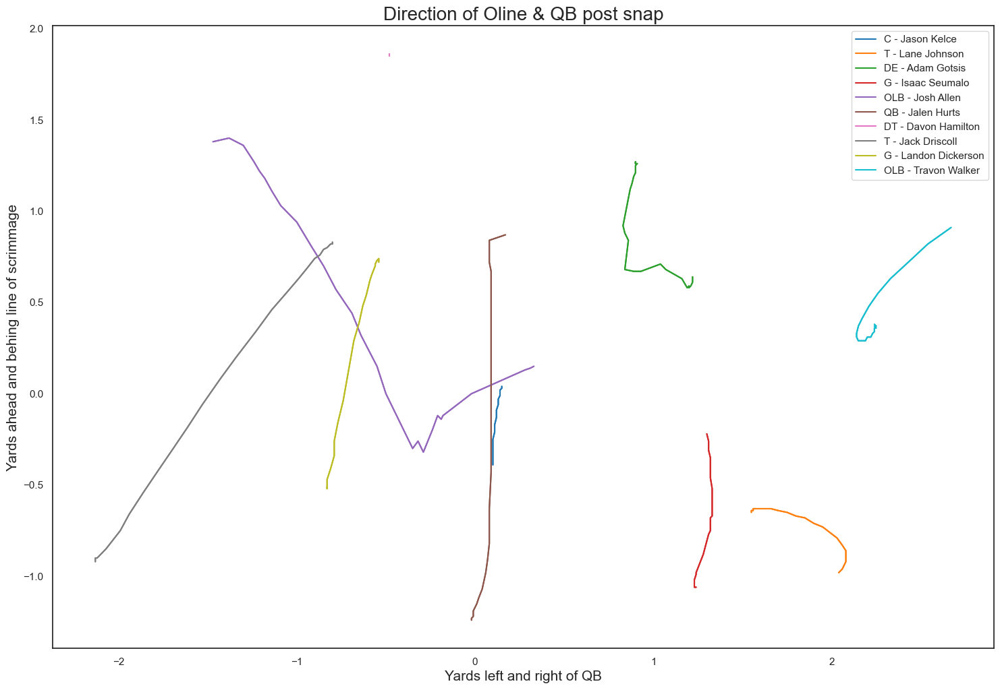

In [561]:
import matplotlib.pyplot as plt
c1 = (sneak_tracking['u_event'] == '2022100209|1539')
c2 = (sneak_tracking['position'].isin(['T','G','C','QB','DE','DT','NT','OLB']))

df = sneak_tracking[c1&c2]
# Ensure your 'X_std_true' column is of type float
df['X_std_true'] = df['X_std_true'].astype(float)

# Sort your values
#df = df.sort_values(by = ['u_event','position','time'], ascending = [True,True,True])

# Get unique categories
categories = df['PN_detail'].unique()

# Create a color map
cmap = plt.get_cmap('tab10')
colors = cmap(np.linspace(0, 1, len(categories)))

for i, category in enumerate(categories):
    # Subset to the category
    subset = df[df['PN_detail'] == category]
    # Make a separate call to plt.plot for each category
    plt.plot(subset['Y_std_true_nml'], subset['X_std_true'], color=colors[i])

for i, category in enumerate(categories):
    # Subset to the category
    subset = df[df['PN_detail'] == category]
    # Make a separate call to plt.plot for each category and add a label
    plt.plot(subset['Y_std_true_nml'], subset['X_std_true'], color=colors[i], label=category)

# Add a legend after the loop
plt.legend()

# Add a title
plt.title("Direction of Oline & QB post snap", fontsize=20)

# Add x and y axis labels
plt.xlabel("Yards left and right of QB", fontsize=15)
plt.ylabel("Yards ahead and behing line of scrimmage", fontsize=15)
#plt.xticks(range(-3, 3))
#plt.yticks(range(-1, 2))
plt.show()

In [513]:
sneak_tracking[c1&c2].groupby(['PN_detail']).agg({'weight':'mean'})

,weight
PN_detail,
C - Jason Kelce,295.0
DE - Adam Gotsis,287.0
DT - Davon Hamilton,310.0
G - Isaac Seumalo,303.0
G - Landon Dickerson,325.0
OLB - Josh Allen,262.0
OLB - Travon Walker,275.0
QB - Jalen Hurts,218.0
T - Jack Driscoll,296.0


In [518]:
print(295+303+325+218+296+317)

1754


In [519]:
print(287+310+262+275)

1134


In [528]:
print(366+379+325+340)

1410


In [524]:
player_weights = sneak_tracking[sneak_tracking['position'].isin(['T','G','C','QB','DE','DT','NT','OLB'])].groupby(['position','displayName','club','weight']).agg({'u_event':'nunique'}).reset_index()
player_weights

,position,displayName,club,weight,u_event
0,C,Andre James,LV,300.0,1
1,C,Austin Blythe,SEA,300.0,2
2,C,Ben Jones,TEN,308.0,2
3,C,Connor McGovern,NYJ,306.0,3
4,C,Corey Linsley,LAC,301.0,2
5,C,Daniel Brunskill,SF,260.0,2
6,C,Drew Dalman,ATL,300.0,3
7,C,Erik McCoy,NO,315.0,2
8,C,Ethan Pocic,CLE,320.0,13
9,C,Garrett Bradbury,MIN,305.0,2


In [537]:
player_weights.sort_values(by = 'weight', ascending = False)

,position,displayName,club,weight,u_event
365,T,Daniel Faalele,BAL,380.0,1
229,NT,Marquan McCall,CAR,379.0,2
223,NT,Bryan Mone,SEA,366.0,1
372,T,Evan Neal,NYG,360.0,2
148,DT,Quinton Bohanna,DAL,355.0,2
93,DT,Anthony Rush,ATL,350.0,1
238,NT,Vita Vea,TB,347.0,1
412,T,Tyre Phillips,NYG,345.0,2
385,T,Jordan Mailata,PHI,344.0,7
115,DT,Dexter Lawrence,NYG,342.0,3


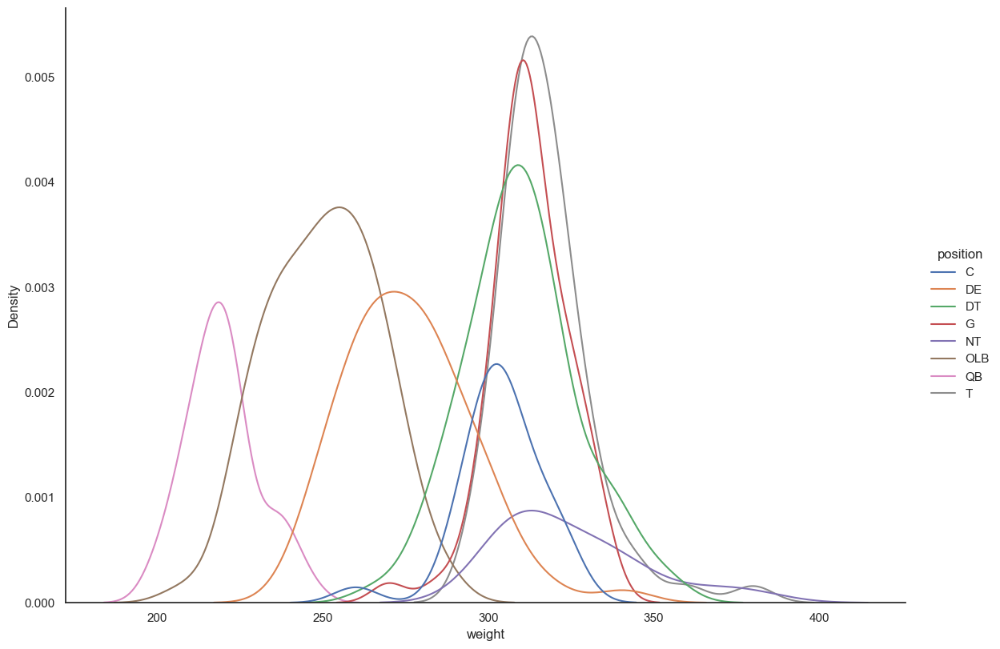

In [527]:
sns.displot(data = player_weights, x  = 'weight', kind = 'kde', hue = 'position', height=8.27, aspect=11.7/8.27)

In [529]:
qb_sneak_results = short_qb_run.groupby(['defensiveTeam']).agg({'u_event':'nunique','Success_flg':'sum'}).reset_index()
qb_sneak_results = qb_sneak_results.sort_values(by = 'u_event', ascending = False)

total_qb_sneak_results = qb_sneak_results['u_event'].sum()
qb_sneak_results['Success_pct'] =  qb_sneak_results['Success_flg'] / qb_sneak_results['u_event']
qb_sneak_results['total_league_sneaks'] = total_qb_sneak_results

qb_sneak_results['cum_u_event'] = qb_sneak_results['u_event'].cumsum()
qb_sneak_results['pct_of_league_sneaks'] = qb_sneak_results['cum_u_event'] / qb_sneak_results['total_league_sneaks']
qb_sneak_results

,defensiveTeam,u_event,Success_flg,Success_pct,total_league_sneaks,cum_u_event,pct_of_league_sneaks
23,NYJ,9,9,1.000000,100,9,0.09
0,ARI,8,6,0.750000,100,17,0.17
2,BAL,7,6,0.857143,100,24,0.24
15,KC,6,6,1.000000,100,30,0.30
14,JAX,6,5,0.833333,100,36,0.36
1,ATL,5,5,1.000000,100,41,0.41
4,CAR,5,5,1.000000,100,46,0.46
25,PIT,4,3,0.750000,100,50,0.50
28,WAS,3,3,1.000000,100,53,0.53
27,TB,3,3,1.000000,100,56,0.56


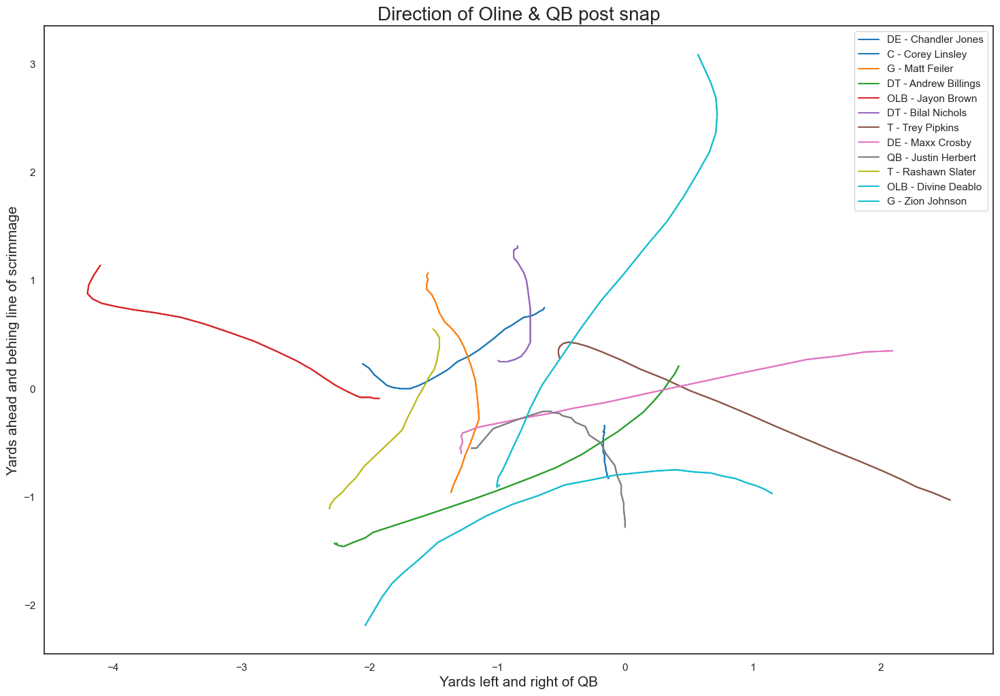

In [562]:
import matplotlib.pyplot as plt
c1 = (sneak_tracking['u_event'] == '2022091111|1546')
c2 = (sneak_tracking['position'].isin(['T','G','C','QB','DE','DT','NT','OLB']))
c3 = (sneak_tracking['frameId'] <= 30)
c4 = (sneak_tracking['frameId'] >= 6)

df = sneak_tracking[c1&c2&c3&c4]
# Ensure your 'X_std_true' column is of type float
df['X_std_true'] = df['X_std_true'].astype(float)

# Sort your values
#df = df.sort_values(by = ['u_event','position','time'], ascending = [True,True,True])

# Get unique categories
categories = df['PN_detail'].unique()

# Create a color map
cmap = plt.get_cmap('tab10')
colors = cmap(np.linspace(0, 1, len(categories)))

for i, category in enumerate(categories):
    # Subset to the category
    subset = df[df['PN_detail'] == category]
    # Make a separate call to plt.plot for each category
    plt.plot(subset['Y_std_true_nml'], subset['X_std_true'], color=colors[i])

for i, category in enumerate(categories):
    # Subset to the category
    subset = df[df['PN_detail'] == category]
    # Make a separate call to plt.plot for each category and add a label
    plt.plot(subset['Y_std_true_nml'], subset['X_std_true'], color=colors[i], label=category)

# Add a legend after the loop
plt.legend()

# Add a title
plt.title("Direction of Oline & QB post snap", fontsize=20)

# Add x and y axis labels
plt.xlabel("Yards left and right of QB", fontsize=15)
plt.ylabel("Yards ahead and behing line of scrimmage", fontsize=15)
#plt.xticks(range(-3, 3))
#plt.yticks(range(-1, 2))
plt.show()

In [563]:
sneak_tracking[c1&c2].groupby(['PN_detail']).agg({'weight':'mean'})

,weight
PN_detail,
C - Corey Linsley,301.0
DE - Chandler Jones,265.0
DE - Maxx Crosby,255.0
DT - Andrew Billings,328.0
DT - Bilal Nichols,313.0
G - Matt Feiler,330.0
G - Zion Johnson,305.0
OLB - Divine Deablo,223.0
OLB - Jayon Brown,226.0


In [540]:
c1 = (short_qb_run['defensiveTeam'] == 'LV')
short_qb_run[c1]

,gameId,playId,u_event,ballCarrierId,ballCarrierDisplayName,playDescription,quarter,down,yardsToGo,possessionTeam,defensiveTeam,yardlineSide,yardlineNumber,gameClock,preSnapHomeScore,preSnapVisitorScore,passResult,passLength,penaltyYards,prePenaltyPlayResult,playResult,playNullifiedByPenalty,absoluteYardlineNumber,offenseFormation,defendersInTheBox,passProbability,preSnapHomeTeamWinProbability,preSnapVisitorTeamWinProbability,homeTeamWinProbabilityAdded,visitorTeamWinProbilityAdded,expectedPoints,expectedPointsAdded,foulName1,foulName2,foulNFLId1,foulNFLId2,run_pass,season,week,old_game_id,play_id,yardline_100,run_location,run_gap,fumble,home_team,away_team,home_coach,away_coach,run_loc_simple,possession_coach,nflId,position,Success_flg
869,2022091111,1546,2022091111|1546,52414,Justin Herbert,"(1:40) (No Huddle) J.Herbert up the middle to LV 28 for no gain (M.Crosby, A.Billings).",2,4,1,LAC,LV,LV,28,1:40,10,3,NaN,NaN,NaN,0,0,N,38,SINGLEBACK,7.0,0.326797,0.838933,0.161067,-0.089218,0.089218,2.396346,-3.914744,NaN,NaN,NaN,NaN,run,2022,1,2022091111,1546,28.0,middle,middle,0.0,LAC,LV,Brandon Staley,Josh McDaniels,d. Middle,Brandon Staley,52414,QB,0
4492,2022092507,1275,2022092507|1275,38538,Ryan Tannehill,"(4:57) (No Huddle) R.Tannehill up the middle for 1 yard, TOUCHDOWN.",2,1,1,TEN,LV,LV,1,4:57,14,10,NaN,NaN,NaN,1,1,N,11,I_FORM,9.0,0.218588,0.803364,0.196636,0.012502,-0.012502,6.461878,0.538122,NaN,NaN,NaN,NaN,run,2022,3,2022092507,1275,1.0,middle,middle,0.0,TEN,LV,Mike Vrabel,Josh McDaniels,d. Middle,Mike Vrabel,38538,QB,1


In [531]:
c1 = (short_qb_run['defensiveTeam'] == 'ARI')
short_qb_run[c1]

,gameId,playId,u_event,ballCarrierId,ballCarrierDisplayName,playDescription,quarter,down,yardsToGo,possessionTeam,defensiveTeam,yardlineSide,yardlineNumber,gameClock,preSnapHomeScore,preSnapVisitorScore,passResult,passLength,penaltyYards,prePenaltyPlayResult,playResult,playNullifiedByPenalty,absoluteYardlineNumber,offenseFormation,defendersInTheBox,passProbability,preSnapHomeTeamWinProbability,preSnapVisitorTeamWinProbability,homeTeamWinProbabilityAdded,visitorTeamWinProbilityAdded,expectedPoints,expectedPointsAdded,foulName1,foulName2,foulNFLId1,foulNFLId2,run_pass,season,week,old_game_id,play_id,yardline_100,run_location,run_gap,fumble,home_team,away_team,home_coach,away_coach,run_loc_simple,possession_coach,nflId,position,Success_flg
885,2022100203,263,2022100203|263,46070,Baker Mayfield,"(11:39) B.Mayfield up the middle to CAR 39 for no gain (Z.Allen, M.Dogbe).",1,3,1,CAR,ARI,CAR,39,11:39,0,0,NaN,NaN,NaN,0,0,N,49,SINGLEBACK,7.0,0.556918,0.579044,0.420956,-0.054837,0.054837,1.905656,-1.821826,NaN,NaN,NaN,NaN,run,2022,4,2022100203,263,61.0,middle,middle,0.0,CAR,ARI,Matt Rhule,Kliff Kingsbury,d. Middle,Matt Rhule,46070,QB,0
1682,2022100911,1158,2022100911|1158,52461,Jalen Hurts,(11:23) (No Huddle) J.Hurts up the middle to ARZ 1 for 1 yard (B.Baker; L.Fotu).,2,3,1,PHI,ARI,ARI,2,11:23,0,7,NaN,NaN,NaN,1,1,N,108,JUMBO,9.0,0.452896,0.135568,0.864432,-0.023417,0.023417,5.362147,1.060113,NaN,NaN,NaN,NaN,run,2022,5,2022100911,1158,2.0,middle,middle,0.0,ARI,PHI,Kliff Kingsbury,Nick Sirianni,d. Middle,Nick Sirianni,52461,QB,1
2107,2022100911,409,2022100911|409,52461,Jalen Hurts,(8:40) (No Huddle) J.Hurts up the middle to ARZ 1 for 2 yards (Z.Collins; Z.Allen).,1,4,1,PHI,ARI,ARI,3,8:40,0,0,NaN,NaN,NaN,2,2,N,13,SINGLEBACK,7.0,0.629896,0.318938,0.681062,-0.035428,0.035428,4.493843,2.048550,NaN,NaN,NaN,NaN,run,2022,5,2022100911,409,3.0,middle,middle,0.0,ARI,PHI,Kliff Kingsbury,Nick Sirianni,d. Middle,Nick Sirianni,52461,QB,1
2317,2022100911,3650,2022100911|3650,52461,Jalen Hurts,(2:20) J.Hurts up the middle to ARZ 10 for 1 yard (T.Vallejo).,4,3,1,PHI,ARI,ARI,11,2:20,17,17,NaN,NaN,NaN,1,1,N,99,JUMBO,9.0,0.125067,0.191445,0.808555,-0.032566,0.032566,4.791859,0.441539,NaN,NaN,NaN,NaN,run,2022,5,2022100911,3650,11.0,middle,middle,0.0,ARI,PHI,Kliff Kingsbury,Nick Sirianni,d. Middle,Nick Sirianni,52461,QB,1
4378,2022103005,121,2022103005|121,38632,Kirk Cousins,(13:49) K.Cousins up the middle to MIN 37 for 3 yards (L.Fotu; V.Dimukeje).,1,3,1,MIN,ARI,MIN,34,13:49,0,0,NaN,NaN,NaN,3,3,N,44,I_FORM,8.0,0.462089,0.706942,0.293058,0.027418,-0.027418,1.427248,0.699937,NaN,NaN,NaN,NaN,run,2022,8,2022103005,121,66.0,middle,middle,0.0,MIN,ARI,Kevin O'Connell,Kliff Kingsbury,d. Middle,Kevin O'Connell,38632,QB,1
4802,2022100911,1179,2022100911|1179,52461,Jalen Hurts,(10:54) (No Huddle) J.Hurts up the middle to ARZ 1 for no gain (B.Niemann; C.Thomas).,2,1,1,PHI,ARI,ARI,1,10:54,0,7,NaN,NaN,NaN,0,0,N,109,JUMBO,9.0,0.246780,0.112152,0.887848,0.007458,-0.007458,6.422260,-0.352035,NaN,NaN,NaN,NaN,run,2022,5,2022100911,1179,1.0,middle,middle,0.0,ARI,PHI,Kliff Kingsbury,Nick Sirianni,d. Middle,Nick Sirianni,52461,QB,0
5060,2022100911,1200,2022100911|1200,52461,Jalen Hurts,"(10:14) J.Hurts up the middle for 1 yard, TOUCHDOWN.",2,2,1,PHI,ARI,ARI,1,10:14,0,7,NaN,NaN,NaN,1,1,N,109,I_FORM,9.0,0.395477,0.119609,0.880391,-0.019709,0.019709,6.070225,0.929775,NaN,NaN,NaN,NaN,run,2022,5,2022100911,1200,1.0,middle,middle,0.0,ARI,PHI,Kliff Kingsbury,Nick Sirianni,d. Middle,Nick Sirianni,52461,QB,1
5290,2022100911,430,2022100911|430,52461,Jalen Hurts,"(8:06) J.Hurts up the middle for 1 yard, TOUCHDOWN.",1,1,1,PHI,ARI,ARI,1,8:06,0,0,NaN,NaN,NaN,1,1,N,11,JUMBO,8.0,0.245170,0.283509,0.716491,-0.016386,0.016386,6.542394,0.457606,NaN,NaN,NaN,NaN,run,2022,5,2022100911,430,1.0,middle,middle,0.0,ARI,PHI,Kliff Kingsbury,Nick Sirianni,d. Middle,Nick Sirianni,52461,QB,1


In [535]:
c1 = (short_qb_run['Success_flg'] == 0)
short_qb_run[c1]

,gameId,playId,u_event,ballCarrierId,ballCarrierDisplayName,playDescription,quarter,down,yardsToGo,possessionTeam,defensiveTeam,yardlineSide,yardlineNumber,gameClock,preSnapHomeScore,preSnapVisitorScore,passResult,passLength,penaltyYards,prePenaltyPlayResult,playResult,playNullifiedByPenalty,absoluteYardlineNumber,offenseFormation,defendersInTheBox,passProbability,preSnapHomeTeamWinProbability,preSnapVisitorTeamWinProbability,homeTeamWinProbabilityAdded,visitorTeamWinProbilityAdded,expectedPoints,expectedPointsAdded,foulName1,foulName2,foulNFLId1,foulNFLId2,run_pass,season,week,old_game_id,play_id,yardline_100,run_location,run_gap,fumble,home_team,away_team,home_coach,away_coach,run_loc_simple,possession_coach,nflId,position,Success_flg
7,2022102304,3401,2022102304|3401,53430,Trevor Lawrence,(11:30) T.Lawrence up the middle to NYG 20 for no gain (J.Smith; J.Love).,4,4,1,JAX,NYG,NYG,20,11:30,17,13,NaN,NaN,NaN,0,0,N,90,I_FORM,9.0,0.153301,0.812003,0.187997,-0.095771,0.095771,2.986392,-4.255993,NaN,NaN,NaN,NaN,run,2022,7,2022102304,3401,20.0,middle,middle,0.0,JAX,NYG,Doug Pederson,Brian Daboll,d. Middle,Doug Pederson,53430,QB,0
101,2022091200,716,2022091200|716,39987,Geno Smith,"(3:00) G.Smith up the middle to DEN 7 for no gain (D.Jones, J.Simmons). Official measurement",1,4,1,SEA,DEN,DEN,7,3:00,7,3,NaN,NaN,NaN,0,0,N,103,SINGLEBACK,8.0,0.320479,0.589820,0.410180,-0.102650,0.102650,4.337419,-4.280289,NaN,NaN,NaN,NaN,run,2022,1,2022091200,716,7.0,middle,middle,0.0,SEA,DEN,Pete Carroll,Nathaniel Hackett,d. Middle,Pete Carroll,39987,QB,0
869,2022091111,1546,2022091111|1546,52414,Justin Herbert,"(1:40) (No Huddle) J.Herbert up the middle to LV 28 for no gain (M.Crosby, A.Billings).",2,4,1,LAC,LV,LV,28,1:40,10,3,NaN,NaN,NaN,0,0,N,38,SINGLEBACK,7.0,0.326797,0.838933,0.161067,-0.089218,0.089218,2.396346,-3.914744,NaN,NaN,NaN,NaN,run,2022,1,2022091111,1546,28.0,middle,middle,0.0,LAC,LV,Brandon Staley,Josh McDaniels,d. Middle,Brandon Staley,52414,QB,0
885,2022100203,263,2022100203|263,46070,Baker Mayfield,"(11:39) B.Mayfield up the middle to CAR 39 for no gain (Z.Allen, M.Dogbe).",1,3,1,CAR,ARI,CAR,39,11:39,0,0,NaN,NaN,NaN,0,0,N,49,SINGLEBACK,7.0,0.556918,0.579044,0.420956,-0.054837,0.054837,1.905656,-1.821826,NaN,NaN,NaN,NaN,run,2022,4,2022100203,263,61.0,middle,middle,0.0,CAR,ARI,Matt Rhule,Kliff Kingsbury,d. Middle,Matt Rhule,46070,QB,0
1600,2022103000,4058,2022103000|4058,38605,Russell Wilson,"(:36) R.Wilson right guard to JAX 25 for 1 yard (F.Fatukasi). The Replay Official reviewed the first down ruling, and the play was Upheld. The ruling on the field stands.",4,4,1,DEN,JAX,JAX,26,0:36,17,21,NaN,NaN,NaN,1,1,N,84,I_FORM,10.0,0.036173,0.004872,0.995128,-0.004872,0.004872,1.452234,-1.452234,NaN,NaN,NaN,NaN,run,2022,8,2022103000,4058,26.0,right,guard,0.0,JAX,DEN,Doug Pederson,Nathaniel Hackett,e. R Guard,Nathaniel Hackett,38605,QB,0
2132,2022101602,3745,2022101602|3745,53431,Zach Wilson,"(3:28) Z.Wilson up the middle to GB 1 for no gain (R.Gary, T.Slaton).",4,3,1,NYJ,GB,GB,1,3:28,10,24,NaN,NaN,NaN,0,0,N,11,SINGLEBACK,9.0,0.250765,0.004302,0.995698,-0.000673,0.000673,5.778437,-1.244616,NaN,NaN,NaN,NaN,run,2022,6,2022101602,3745,1.0,middle,middle,0.0,GB,NYJ,Matt LaFleur,Robert Saleh,d. Middle,Robert Saleh,53431,QB,0
2614,2022101601,1064,2022101601|1064,43380,Jacoby Brissett,(14:00) (No Huddle) J.Brissett right guard to NE 18 for no gain (M.Judon).,2,4,1,CLE,NE,NE,18,14:00,3,3,NaN,NaN,NaN,0,0,N,92,SINGLEBACK,7.0,0.389354,0.650287,0.349713,-0.085063,0.085063,3.371978,-4.178173,NaN,NaN,NaN,NaN,run,2022,6,2022101601,1064,18.0,right,guard,0.0,CLE,NE,Kevin Stefanski,Bill Belichick,e. R Guard,Kevin Stefanski,43380,QB,0
3098,2022091107,3398,2022091107|3398,33099,Joe Flacco,(8:10) (No Huddle) J.Flacco up the middle to BLT 28 for no gain (C.Clark).,4,3,1,NYJ,BAL,BAL,28,8:10,3,24,NaN,NaN,NaN,0,0,N,82,SINGLEBACK,6.0,0.537570,0.007541,0.992459,-0.001205,0.001205,3.922753,-1.150098,NaN,NaN,NaN,NaN,run,2022,1,2022091107,3398,28.0,middle,middle,0.0,NYJ,BA

In [539]:
sneak_tracking_snap_loc = sneak_tracking[sneak_tracking['frameId'] == 6][['u_event','nflId','Y_std_true_nml','X_std_true']]
sneak_tracking_snap_loc = sneak_tracking_snap_loc.rename(columns={'X_std_true': 'player_snap_X_std_true','Y_std_true_nml':'player_snap_Y_std_true_nml'})
sneak_tracking_snap_loc.head(5)

,u_event,nflId,player_snap_Y_std_true_nml,player_snap_X_std_true
5,2022091101|2431,41264.0,-1.26,-1.40
33,2022091101|2431,42347.0,-7.18,-0.90
61,2022091101|2431,42368.0,-2.33,3.75
89,2022091101|2431,42436.0,4.05,0.61
117,2022091101|2431,43380.0,0.00,-1.38


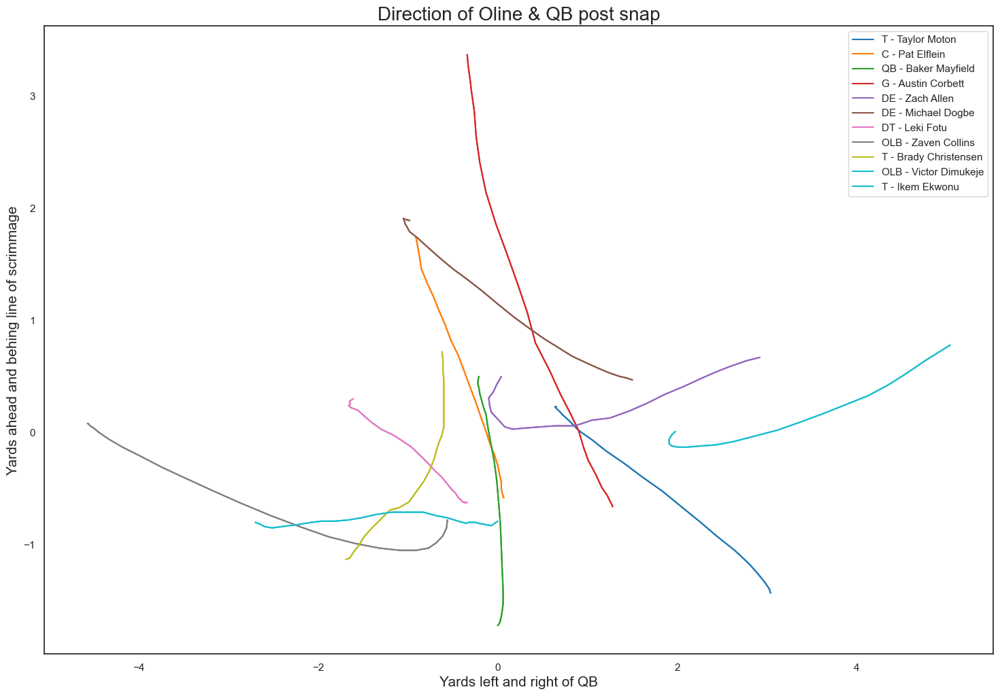

In [534]:
import matplotlib.pyplot as plt
c1 = (sneak_tracking['u_event'] == '2022100203|263')
c2 = (sneak_tracking['position'].isin(['T','G','C','QB','DE','DT','NT','OLB']))
c3 = (sneak_tracking['frameId'] <= 30)
c4 = (sneak_tracking['frameId'] >= 6)

df = sneak_tracking[c1&c2&c3&c4]
# Ensure your 'X_std_true' column is of type float
df['X_std_true'] = df['X_std_true'].astype(float)

# Sort your values
#df = df.sort_values(by = ['u_event','position','time'], ascending = [True,True,True])

# Get unique categories
categories = df['PN_detail'].unique()

# Create a color map
cmap = plt.get_cmap('tab10')
colors = cmap(np.linspace(0, 1, len(categories)))

for i, category in enumerate(categories):
    # Subset to the category
    subset = df[df['PN_detail'] == category]
    # Make a separate call to plt.plot for each category
    plt.plot(subset['Y_std_true_nml'], subset['X_std_true'], color=colors[i])

for i, category in enumerate(categories):
    # Subset to the category
    subset = df[df['PN_detail'] == category]
    # Make a separate call to plt.plot for each category and add a label
    plt.plot(subset['Y_std_true_nml'], subset['X_std_true'], color=colors[i], label=category)

# Add a legend after the loop
plt.legend()

# Add a title
plt.title("Direction of Oline & QB post snap", fontsize=20)

# Add x and y axis labels
plt.xlabel("Yards left and right of QB", fontsize=15)
plt.ylabel("Yards ahead and behing line of scrimmage", fontsize=15)
#plt.xticks(range(-3, 3))
#plt.yticks(range(-1, 2))
plt.show()

# Cardinals success vs sneak

In [645]:
c1 = (short_qb_run['defensiveTeam'] == 'ARI')
c2 = (short_qb_run['possessionTeam'] == 'PHI')
short_qb_run[c1&c2]

,gameId,playId,u_event,ballCarrierId,ballCarrierDisplayName,playDescription,quarter,down,yardsToGo,possessionTeam,defensiveTeam,yardlineSide,yardlineNumber,gameClock,preSnapHomeScore,preSnapVisitorScore,passResult,passLength,penaltyYards,prePenaltyPlayResult,playResult,playNullifiedByPenalty,absoluteYardlineNumber,offenseFormation,defendersInTheBox,passProbability,preSnapHomeTeamWinProbability,preSnapVisitorTeamWinProbability,homeTeamWinProbabilityAdded,visitorTeamWinProbilityAdded,expectedPoints,expectedPointsAdded,foulName1,foulName2,foulNFLId1,foulNFLId2,run_pass,season,week,old_game_id,play_id,yardline_100,run_location,run_gap,fumble,home_team,away_team,home_coach,away_coach,run_loc_simple,possession_coach,nflId,position,Success_flg
1682,2022100911,1158,2022100911|1158,52461,Jalen Hurts,(11:23) (No Huddle) J.Hurts up the middle to ARZ 1 for 1 yard (B.Baker; L.Fotu).,2,3,1,PHI,ARI,ARI,2,11:23,0,7,NaN,NaN,NaN,1,1,N,108,JUMBO,9.0,0.452896,0.135568,0.864432,-0.023417,0.023417,5.362147,1.060113,NaN,NaN,NaN,NaN,run,2022,5,2022100911,1158,2.0,middle,middle,0.0,ARI,PHI,Kliff Kingsbury,Nick Sirianni,d. Middle,Nick Sirianni,52461,QB,1
2107,2022100911,409,2022100911|409,52461,Jalen Hurts,(8:40) (No Huddle) J.Hurts up the middle to ARZ 1 for 2 yards (Z.Collins; Z.Allen).,1,4,1,PHI,ARI,ARI,3,8:40,0,0,NaN,NaN,NaN,2,2,N,13,SINGLEBACK,7.0,0.629896,0.318938,0.681062,-0.035428,0.035428,4.493843,2.048550,NaN,NaN,NaN,NaN,run,2022,5,2022100911,409,3.0,middle,middle,0.0,ARI,PHI,Kliff Kingsbury,Nick Sirianni,d. Middle,Nick Sirianni,52461,QB,1
2317,2022100911,3650,2022100911|3650,52461,Jalen Hurts,(2:20) J.Hurts up the middle to ARZ 10 for 1 yard (T.Vallejo).,4,3,1,PHI,ARI,ARI,11,2:20,17,17,NaN,NaN,NaN,1,1,N,99,JUMBO,9.0,0.125067,0.191445,0.808555,-0.032566,0.032566,4.791859,0.441539,NaN,NaN,NaN,NaN,run,2022,5,2022100911,3650,11.0,middle,middle,0.0,ARI,PHI,Kliff Kingsbury,Nick Sirianni,d. Middle,Nick Sirianni,52461,QB,1
4802,2022100911,1179,2022100911|1179,52461,Jalen Hurts,(10:54) (No Huddle) J.Hurts up the middle to ARZ 1 for no gain (B.Niemann; C.Thomas).,2,1,1,PHI,ARI,ARI,1,10:54,0,7,NaN,NaN,NaN,0,0,N,109,JUMBO,9.0,0.246780,0.112152,0.887848,0.007458,-0.007458,6.422260,-0.352035,NaN,NaN,NaN,NaN,run,2022,5,2022100911,1179,1.0,middle,middle,0.0,ARI,PHI,Kliff Kingsbury,Nick Sirianni,d. Middle,Nick Sirianni,52461,QB,0
5060,2022100911,1200,2022100911|1200,52461,Jalen Hurts,"(10:14) J.Hurts up the middle for 1 yard, TOUCHDOWN.",2,2,1,PHI,ARI,ARI,1,10:14,0,7,NaN,NaN,NaN,1,1,N,109,I_FORM,9.0,0.395477,0.119609,0.880391,-0.019709,0.019709,6.070225,0.929775,NaN,NaN,NaN,NaN,run,2022,5,2022100911,1200,1.0,middle,middle,0.0,ARI,PHI,Kliff Kingsbury,Nick Sirianni,d. Middle,Nick Sirianni,52461,QB,1
5290,2022100911,430,2022100911|430,52461,Jalen Hurts,"(8:06) J.Hurts up the middle for 1 yard, TOUCHDOWN.",1,1,1,PHI,ARI,ARI,1,8:06,0,0,NaN,NaN,NaN,1,1,N,11,JUMBO,8.0,0.245170,0.283509,0.716491,-0.016386,0.016386,6.542394,0.457606,NaN,NaN,NaN,NaN,run,2022,5,2022100911,430,1.0,middle,middle,0.0,ARI,PHI,Kliff Kingsbury,Nick Sirianni,d. Middle,Nick Sirianni,52461,QB,1


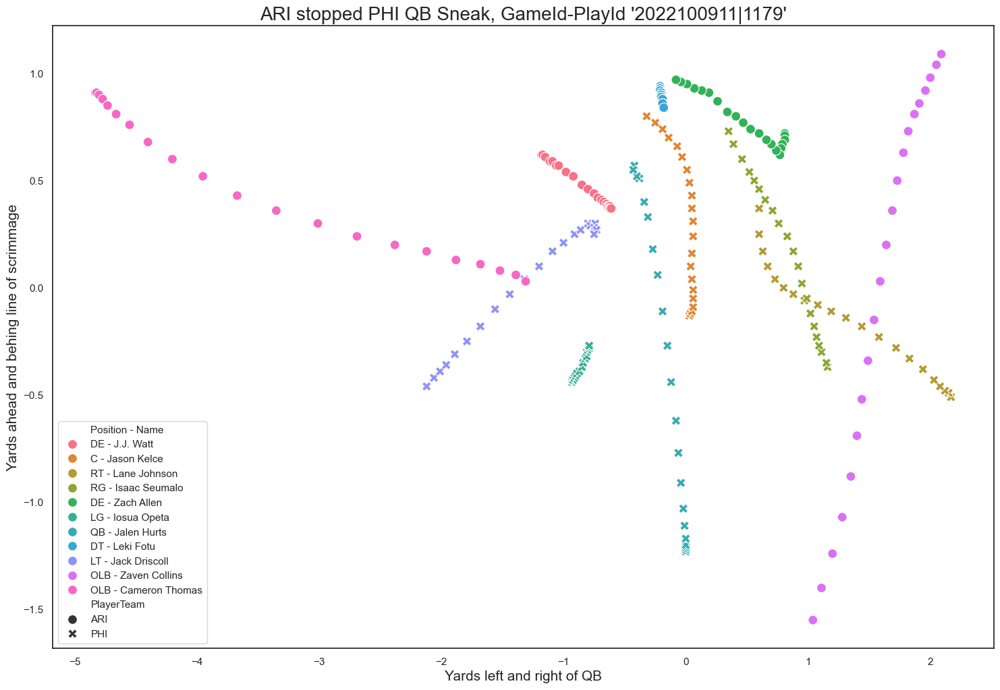

In [685]:
c1 = (sneak_tracking['u_event'] == '2022100911|1179')
c2 = (sneak_tracking['position'].isin(['T','G','C','QB','DE','DT','NT','OLB']))
c3 = (sneak_tracking['frameId'] >= 6)
c4 = (sneak_tracking['frameId'] <= 26)

example_play = sneak_tracking[c1&c2&c3&c4]
example_play = pd.merge(example_play, snap_big_boys[['u_event','nflId','detail_position']], how = 'left', on = ['u_event','nflId'])
example_play['detail_position'] = np.where(example_play['detail_position'].notnull(),example_play['detail_position'],example_play['position'])

example_play['Position - Name'] = example_play['detail_position'] + ' - ' + example_play['displayName']
sns.scatterplot(data = example_play, x = 'Y_std_true_nml', y = 'X_std_true', hue = 'Position - Name', style = 'PlayerTeam', s = 100)
# Add a title
plt.title("ARI stopped PHI QB Sneak, GameId-PlayId '2022100911|1179'", fontsize=20)
# Add x and y axis labels
plt.xlabel("Yards left and right of QB", fontsize=15)
plt.ylabel("Yards ahead and behing line of scrimmage", fontsize=15)
#plt.legend(title="Position - Name")
plt.show()

In [691]:
example_play

,gameId,playId,u_event,nflId,displayName,frameId,time,jerseyNumber,club,playDirection,x,y,s,a,dis,o,dir,event,team2,possessionTeam,homeTeamAbbr,visitorTeamAbbr,yardlineNumber,yardlineSide,possessionTeam_alt,PlayerTeam,team,position,weight,Dir_rad,ToLeft,TeamOnOffense,IsOnOffense,YardLine_std,yardlineSide_ha,X_std,Y_std,Dir_std,dx,dy,Orientation_rad,Orientation_std,Orientation_deg_std,Dir_deg_std,MPH,X_std_true,Y_std_true,ball_snap_frameId_x,QB_start_Y_std_true,Y_std_true_nml,ball_snap_frameId_y,player_snap_Y_std_true_nml,player_snap_X_std_true,team3,IsOnOffense2,PN_detail,detail_position,Position - Name
0,2022100911,1158,2022100911|1158,37084.0,J.J. Watt,6,2022-10-09 17:09:22.799999Z,99.0,ARI,right,108.23,29.47,0.20,0.23,0.04,259.43,253.48,ball_snap,ARI,away,ARI,PHI,2,ARI,away,ARI,home,DE,288.0,3.429921,False,home,True,98,home,108.23,29.47,3.429921,-0.19,-0.06,3.326074,3.326074,190.57,196.52,0.409091,0.23,29.47,6.0,27.78,-1.69,6,-1.69,0.23,home,DEF,DE - J.J. Watt,DE,DE - J.J. Watt
1,2022100911,1158,2022100911|1158,37084.0,J.J. Watt,7,2022-10-09 17:09:22.900000Z,99.0,ARI,right,108.20,29.45,0.25,0.21,0.03,261.09,245.91,NaN,ARI,away,ARI,PHI,2,ARI,away,ARI,home,DE,288.0,3.562042,False,home,True,98,home,108.20,29.45,3.562042,-0.23,-0.10,3.297101,3.297101,188.91,204.09,0.511364,0.20,29.45,6.0,27.78,-1.67,6,-1.69,0.23,home,DEF,DE - J.J. Watt,DE,DE - J.J. Watt
2,2022100911,1158,2022100911|1158,37084.0,J.J. Watt,8,2022-10-09 17:09:23.000000Z,99.0,ARI,right,108.17,29.44,0.29,0.28,0.03,258.59,239.22,NaN,ARI,away,ARI,PHI,2,ARI,away,ARI,home,DE,288.0,3.678805,False,home,True,98,home,108.17,29.44,3.678805,-0.25,-0.15,3.340735,3.340735,191.41,210.78,0.593182,0.17,29.44,6.0,27.78,-1.66,6,-1.69,0.23,home,DEF,DE - J.J. Watt,DE,DE - J.J. Watt
3,2022100911,1158,2022100911|1158,37084.0,J.J. Watt,9,2022-10-09 17:09:23.099999Z,99.0,ARI,right,108.15,29.42,0.32,0.30,0.03,258.59,236.06,NaN,ARI,away,ARI,PHI,2,ARI,away,ARI,home,DE,288.0,3.733957,False,home,True,98,home,108.15,29.42,3.733957,-0.27,-0.18,3.340735,3.340735,191.41,213.94,0.654545,0.15,29.42,6.0,27.78,-1.64,6,-1.69,0.23,home,DEF,DE - J.J. Watt,DE,DE - J.J. Watt
4,2022100911,1158,2022100911|1158,37084.0,J.J. Watt,10,2022-10-09 17:09:23.200000Z,99.0,ARI,right,108.12,29.40,0.36,0.23,0.04,257.03,232.67,NaN,ARI,away,ARI,PHI,2,ARI,away,ARI,home,DE,288.0,3.793124,False,home,True,98,home,108.12,29.40,3.793124,-0.29,-0.22,3.367962,3.367962,192.97,217.33,0.736363,0.12,29.40,6.0,27.78,-1.62,6,-1.69,0.23,home,DEF,DE - J.J. Watt,DE,DE - J.J. Watt
5,2022100911,1158,2022100911|1158,37084.0,J.J. Watt,11,2022-10-09 17:09:23.299999Z,99.0,ARI,right,108.09,29.37,0.38,0.11,0.04,257.03,231.34,run,ARI,away,ARI,PHI,2,ARI,away,ARI,home,DE,288.0,3.816337,False,home,True,98,home,108.09,29.37,3.816337,-0.30,-0.24,3.367962,3.367962,192.97,218.66,0.777273,0.09,29.37,6.0,27.78,-1.59,6,-1.69,0.23,home,DEF,DE - J.J. Watt,DE,DE - J.J. Watt
6,2022100911,1158,2022100911|1158,37084.0,J.J. Watt,12,2022-10-09 17:09:23.400000Z,99.0,ARI,right,108.05,29.34,0.41,0.06,0.05,256.35,229.26,NaN,ARI,away,ARI,PHI,2,ARI,away,ARI,home,DE,288.0,3.852640,False,home,True,98,home,108.05,29.34,3.852640,-0.31,-0.27,3.379830,3.379830,193.65,220.74,0.838636,0.05,29.34,6.0,27.78,-1.56,6,-1.69,0.23,home,DEF,DE - J.J. Watt,DE,DE - J.J. Watt
7,2022100911,1158,2022100911|1158,37084.0,J.J. Watt,13,2022-10-09 17:09:23.500000Z,99.0,ARI,right,108.02,29.32,0.40,0.08,0.04,255.60,228.48,NaN,ARI,away,ARI,PHI,2,ARI,away,ARI,home,DE,288.0,3.866253,False,home,True,98,home,108.02,29.32,3.866253,-0.30,-0.27,3.392920,3.392920,194.40,221.52,0.818182,0.02,29.32,6.0,27.78,-1.54,6,-1.69,0.23,home,DEF,DE - J.J. Watt,DE,DE - J.J. Watt
8,2022100911,1158,2022100911|1158,37084.0,J.J. Watt,14,2022-10-09 17:09:23.599999Z,99.0,ARI,right,107.99,29.28,0.41,0.12,0.05,255.60,226.71,NaN,ARI,away,ARI,PHI,2,ARI,away,ARI,home,DE,288.0,3.897146,False,home,True,98,home,107.99,29.28,3.897146,-0.30,-0.28,3.392920,3.392920,194.40,223.29,0.838636,-0.01,29.28,6.0,27.78,-1.50,6,-1.69,0.23,home,DEF

In [674]:
c1 = (sneak_tracking['u_event'] == '2022100911|1179')
c2 = (sneak_tracking['position'].isin(['T','G','C','QB','DE','DT','NT','OLB']))
c3 = (sneak_tracking['frameId'] == 6)
sneak_tracking[c1&c2&c3].groupby(['PN_detail']).agg({'weight':'mean'})

,weight
PN_detail,
C - Jason Kelce,295.0
DE - J.J. Watt,288.0
DE - Zach Allen,281.0
DT - Leki Fotu,335.0
G - Iosua Opeta,305.0
G - Isaac Seumalo,303.0
OLB - Cameron Thomas,270.0
OLB - Zaven Collins,260.0
QB - Jalen Hurts,218.0


In [675]:
print(296+305+295)

896


In [676]:
print(288+335)

623


In [692]:
print(344+325+295)

964


In [648]:
c1 = (sneak_tracking['u_event'] == '2022100911|1179')
c2 = (sneak_tracking['position'].isin(['T','G','C','QB','DE','DT','NT','OLB']))
c3 = (sneak_tracking['frameId'] == 6)

sneak_tracking[c1&c2&c3]

,gameId,playId,u_event,nflId,displayName,frameId,time,jerseyNumber,club,playDirection,x,y,s,a,dis,o,dir,event,team2,possessionTeam,homeTeamAbbr,visitorTeamAbbr,yardlineNumber,yardlineSide,possessionTeam_alt,PlayerTeam,team,position,weight,Dir_rad,ToLeft,TeamOnOffense,IsOnOffense,YardLine_std,yardlineSide_ha,X_std,Y_std,Dir_std,dx,dy,Orientation_rad,Orientation_std,Orientation_deg_std,Dir_deg_std,MPH,X_std_true,Y_std_true,ball_snap_frameId_x,QB_start_Y_std_true,Y_std_true_nml,ball_snap_frameId_y,player_snap_Y_std_true_nml,player_snap_X_std_true,team3,IsOnOffense2,PN_detail
33677,2022100911,1179,2022100911|1179,37084.0,J.J. Watt,6,2022-10-09 17:09:52.400000Z,99.0,ARI,right,109.62,27.50,0.04,0.22,0.01,256.14,182.85,ball_snap,ARI,away,ARI,PHI,1,ARI,away,ARI,home,DE,288.0,4.662647,False,home,True,99,home,109.62,27.50,4.662647,-0.00,-0.04,3.383495,3.383495,193.86,267.15,0.081818,0.62,27.50,6.0,26.32,-1.18,6,-1.18,0.62,home,DEF,DE - J.J. Watt
33730,2022100911,1179,2022100911|1179,37266.0,Jason Kelce,6,2022-10-09 17:09:52.400000Z,62.0,PHI,right,108.87,26.29,0.03,0.03,0.01,62.53,125.12,ball_snap,PHI,away,ARI,PHI,1,ARI,away,PHI,away,C,295.0,5.670226,False,away,True,99,home,108.87,26.29,5.670226,0.02,-0.02,0.479442,0.479442,27.47,324.88,0.061364,-0.13,26.29,6.0,26.32,0.03,6,0.03,-0.13,away,OFF,C - Jason Kelce
33783,2022100911,1179,2022100911|1179,39950.0,Lane Johnson,6,2022-10-09 17:09:52.400000Z,65.0,PHI,right,108.49,24.15,0.04,0.05,0.01,48.18,39.69,ball_snap,PHI,away,ARI,PHI,1,ARI,away,PHI,away,T,317.0,0.878075,False,away,True,99,home,108.49,24.15,0.878075,0.03,0.03,0.729897,0.729897,41.82,50.31,0.081818,-0.51,24.15,6.0,26.32,2.17,6,2.17,-0.51,away,OFF,T - Lane Johnson
33836,2022100911,1179,2022100911|1179,43368.0,Isaac Seumalo,6,2022-10-09 17:09:52.400000Z,56.0,PHI,right,108.63,25.16,0.01,0.02,0.02,73.28,85.30,ball_snap,PHI,away,ARI,PHI,1,ARI,away,PHI,away,G,303.0,0.082030,False,away,True,99,home,108.63,25.16,0.082030,0.01,0.00,0.291819,0.291819,16.72,4.70,0.020455,-0.37,25.16,6.0,26.32,1.16,6,1.16,-0.37,away,OFF,G - Isaac Seumalo
34207,2022100911,1179,2022100911|1179,47848.0,Zach Allen,6,2022-10-09 17:09:52.400000Z,94.0,ARI,right,109.72,25.51,0.12,0.10,0.02,309.26,231.51,ball_snap,ARI,away,ARI,PHI,1,ARI,away,ARI,home,DE,281.0,3.813370,False,home,True,99,home,109.72,25.51,3.813370,-0.09,-0.07,2.456376,2.456376,140.74,218.49,0.245454,0.72,25.51,6.0,26.32,0.81,6,0.81,0.72,home,DEF,DE - Zach Allen
34260,2022100911,1179,2022100911|1179,48514.0,Iosua Opeta,6,2022-10-09 17:09:52.400000Z,78.0,PHI,right,108.56,27.25,0.03,0.03,0.05,99.82,135.15,ball_snap,PHI,away,ARI,PHI,1,ARI,away,PHI,away,G,305.0,5.495169,False,away,True,99,home,108.56,27.25,5.495169,0.02,-0.02,6.111794,6.111794,350.18,314.85,0.061364,-0.44,27.25,6.0,26.32,-0.93,6,-0.93,-0.44,away,OFF,G - Iosua Opeta
34419,2022100911,1179,2022100911|1179,52461.0,Jalen Hurts,6,2022-10-09 17:09:52.400000Z,1.0,PHI,right,107.77,26.32,0.01,0.01,0.01,80.06,66.50,ball_snap,PHI,away,ARI,PHI,1,ARI,away,PHI,away,QB,218.0,0.410152,False,away,True,99,home,107.77,26.32,0.410152,0.01,0.00,0.173486,0.173486,9.94,23.50,0.020455,-1.23,26.32,6.0,26.32,0.00,6,0.00,-1.23,away,OFF,QB - Jalen Hurts
34472,2022100911,1179,2022100911|1179,52522.0,Leki Fotu,6,2022-10-09 17:09:52.400000Z,95.0,ARI,right,109.94,26.53,0.00,0.00,0.01,252.01,292.08,ball_snap,ARI,away,ARI,PHI,1,ARI,away,ARI,home,DT,335.0,2.756224,False,home,True,99,home,109.94,26.53,2.756224,-0.00,0.00,3.455577,3.455577,197.99,157.92,0.000000,0.94,26.53,6.0,26.32,-0.21,6,-0.21,0.94,home,DEF,DT - Leki Fotu
34525,2022100911,1179,2022100911|1179,52553.0,Jack Driscoll,6,2022-10-09 17:09:52.400000Z,63.0,PHI,right,108.54,28.44,0.10,0.06,0.01,58.48,332.72,ball_snap,PHI,away,ARI,PHI,1,ARI,away,PHI,away,T,296.0,2.046922,False,away,True,99,home,108.54,28.44,2.046922,-0.05,0.09,0.550128,0.550128,31.52,117.28,0.204545,-0.46,28.44,6.0,26.32,-2.12,6,-2.12,-0.46,away,OFF,T - Jack Driscoll
34631,2022100911,1179,2022100911|1179,53445.0,Zaven Collins,6,2022-10-09 17:09:52.40

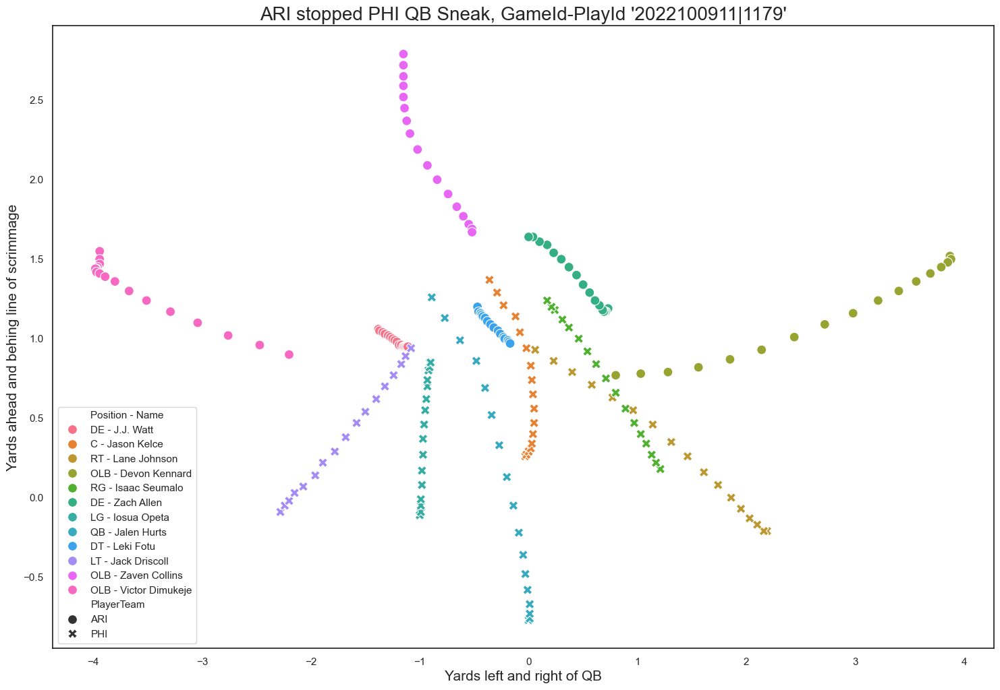

In [686]:
c1 = (sneak_tracking['u_event'] == '2022100911|1200')
c2 = (sneak_tracking['position'].isin(['T','G','C','QB','DE','DT','NT','OLB']))
c3 = (sneak_tracking['frameId'] >= 6)
c4 = (sneak_tracking['frameId'] <= 26)

example_play = sneak_tracking[c1&c2&c3&c4]
example_play = pd.merge(example_play, snap_big_boys[['u_event','nflId','detail_position']], how = 'left', on = ['u_event','nflId'])
example_play['detail_position'] = np.where(example_play['detail_position'].notnull(),example_play['detail_position'],example_play['position'])

example_play['Position - Name'] = example_play['detail_position'] + ' - ' + example_play['displayName']
sns.scatterplot(data = example_play, x = 'Y_std_true_nml', y = 'X_std_true', hue = 'Position - Name', style = 'PlayerTeam', s = 100)
# Add a title
plt.title("ARI stopped PHI QB Sneak, GameId-PlayId '2022100911|1179'", fontsize=20)
# Add x and y axis labels
plt.xlabel("Yards left and right of QB", fontsize=15)
plt.ylabel("Yards ahead and behing line of scrimmage", fontsize=15)
#plt.legend(title="Position - Name")
plt.show()

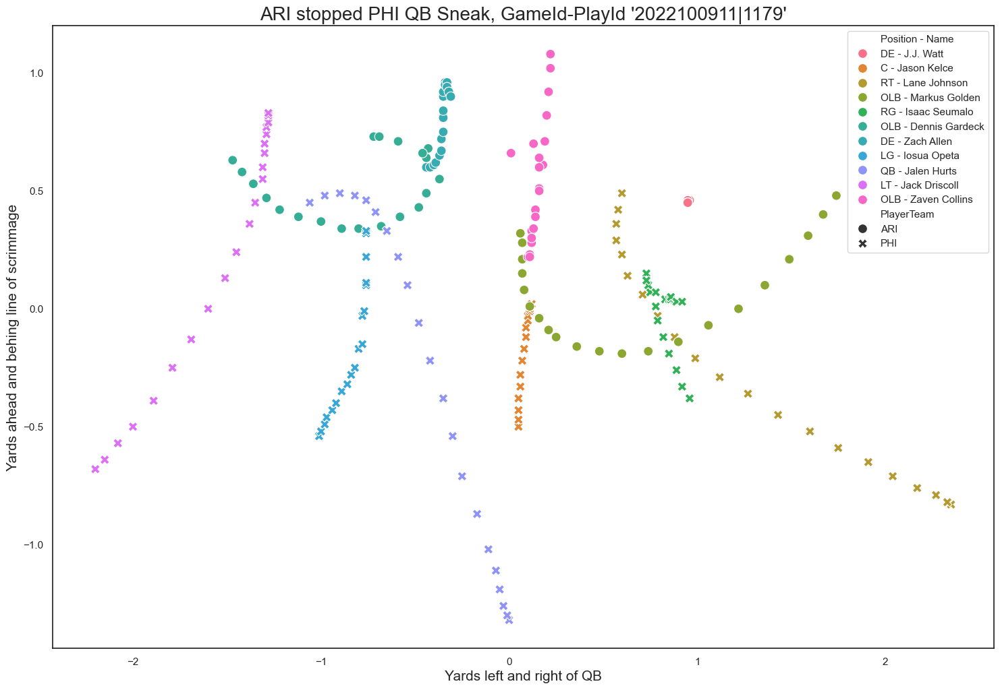

In [687]:
c1 = (sneak_tracking['u_event'] == '2022100911|430')
c2 = (sneak_tracking['position'].isin(['T','G','C','QB','DE','DT','NT','OLB']))
c3 = (sneak_tracking['frameId'] >= 6)
c4 = (sneak_tracking['frameId'] <= 26)

example_play = sneak_tracking[c1&c2&c3&c4]
example_play = pd.merge(example_play, snap_big_boys[['u_event','nflId','detail_position']], how = 'left', on = ['u_event','nflId'])
example_play['detail_position'] = np.where(example_play['detail_position'].notnull(),example_play['detail_position'],example_play['position'])

example_play['Position - Name'] = example_play['detail_position'] + ' - ' + example_play['displayName']
sns.scatterplot(data = example_play, x = 'Y_std_true_nml', y = 'X_std_true', hue = 'Position - Name', style = 'PlayerTeam', s = 100)
# Add a title
plt.title("ARI stopped PHI QB Sneak, GameId-PlayId '2022100911|1179'", fontsize=20)
# Add x and y axis labels
plt.xlabel("Yards left and right of QB", fontsize=15)
plt.ylabel("Yards ahead and behing line of scrimmage", fontsize=15)
#plt.legend(title="Position - Name")
plt.show()

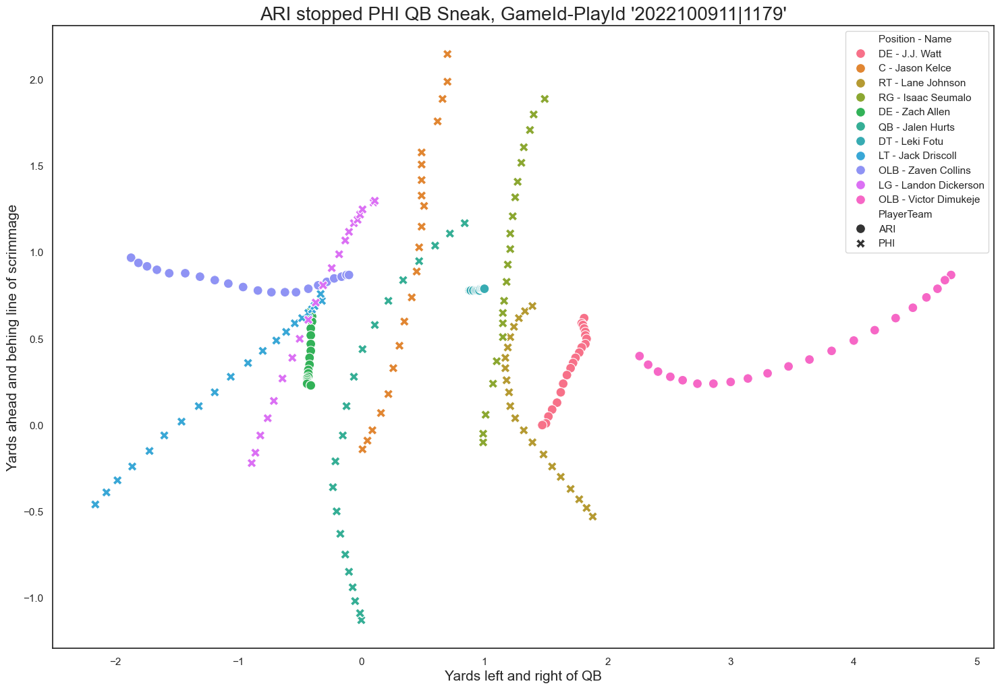

In [688]:
c1 = (sneak_tracking['u_event'] == '2022100911|3650')
c2 = (sneak_tracking['position'].isin(['T','G','C','QB','DE','DT','NT','OLB']))
c3 = (sneak_tracking['frameId'] >= 6)
c4 = (sneak_tracking['frameId'] <= 26)

example_play = sneak_tracking[c1&c2&c3&c4]
example_play = pd.merge(example_play, snap_big_boys[['u_event','nflId','detail_position']], how = 'left', on = ['u_event','nflId'])
example_play['detail_position'] = np.where(example_play['detail_position'].notnull(),example_play['detail_position'],example_play['position'])

example_play['Position - Name'] = example_play['detail_position'] + ' - ' + example_play['displayName']
sns.scatterplot(data = example_play, x = 'Y_std_true_nml', y = 'X_std_true', hue = 'Position - Name', style = 'PlayerTeam', s = 100)
# Add a title
plt.title("ARI stopped PHI QB Sneak, GameId-PlayId '2022100911|1179'", fontsize=20)
# Add x and y axis labels
plt.xlabel("Yards left and right of QB", fontsize=15)
plt.ylabel("Yards ahead and behing line of scrimmage", fontsize=15)
#plt.legend(title="Position - Name")
plt.show()

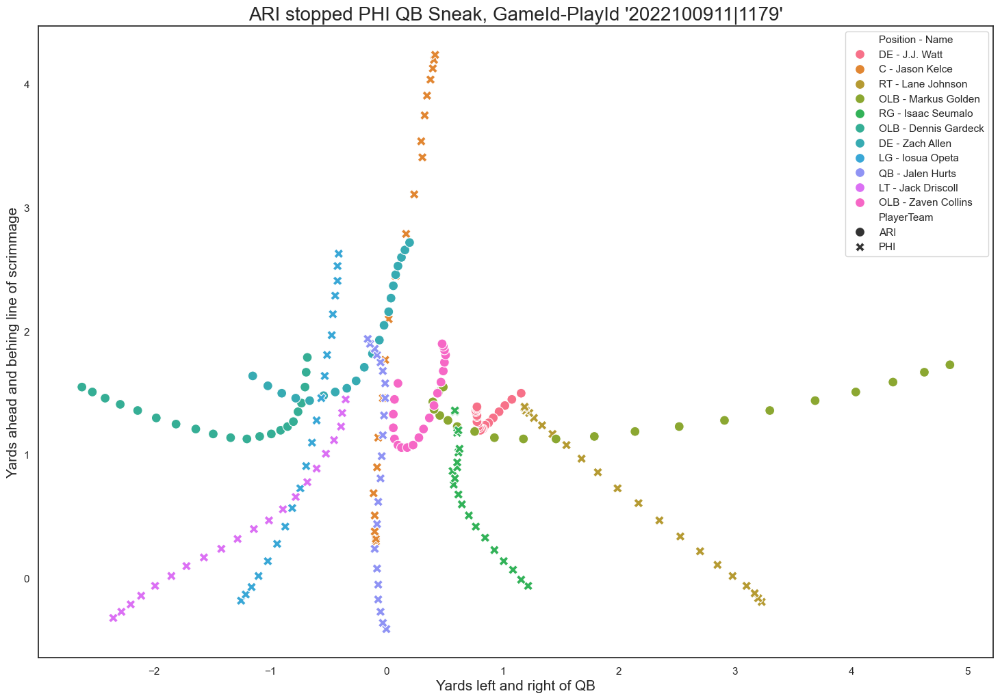

In [689]:
c1 = (sneak_tracking['u_event'] == '2022100911|409')
c2 = (sneak_tracking['position'].isin(['T','G','C','QB','DE','DT','NT','OLB']))
c3 = (sneak_tracking['frameId'] >= 6)
c4 = (sneak_tracking['frameId'] <= 26)

example_play = sneak_tracking[c1&c2&c3&c4]
example_play = pd.merge(example_play, snap_big_boys[['u_event','nflId','detail_position']], how = 'left', on = ['u_event','nflId'])
example_play['detail_position'] = np.where(example_play['detail_position'].notnull(),example_play['detail_position'],example_play['position'])

example_play['Position - Name'] = example_play['detail_position'] + ' - ' + example_play['displayName']
sns.scatterplot(data = example_play, x = 'Y_std_true_nml', y = 'X_std_true', hue = 'Position - Name', style = 'PlayerTeam', s = 100)
# Add a title
plt.title("ARI stopped PHI QB Sneak, GameId-PlayId '2022100911|1179'", fontsize=20)
# Add x and y axis labels
plt.xlabel("Yards left and right of QB", fontsize=15)
plt.ylabel("Yards ahead and behing line of scrimmage", fontsize=15)
#plt.legend(title="Position - Name")
plt.show()

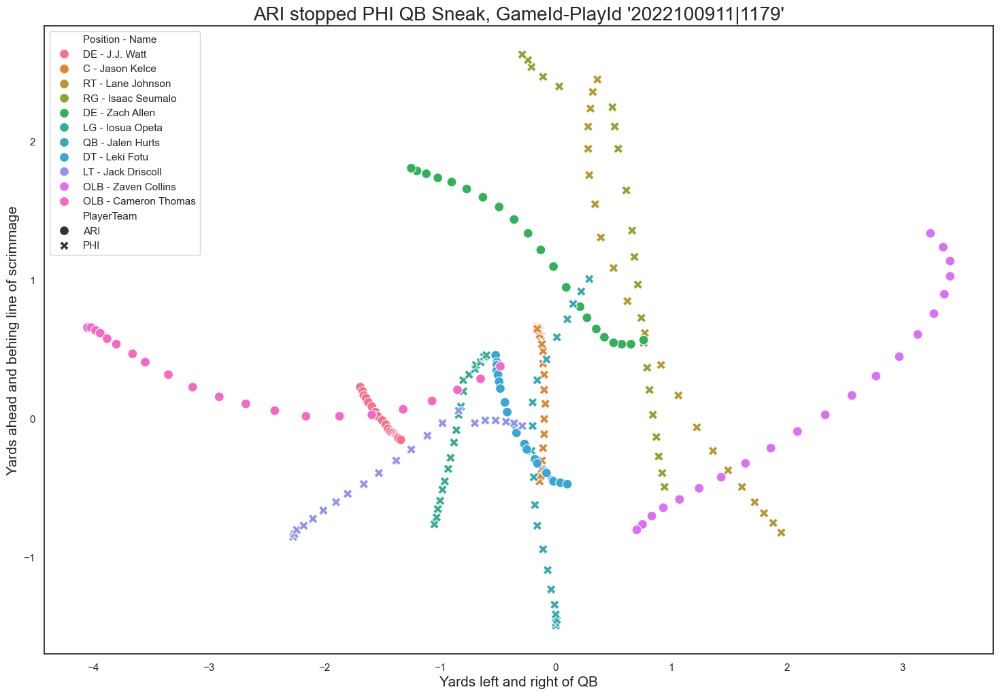

In [690]:
c1 = (sneak_tracking['u_event'] == '2022100911|1158')
c2 = (sneak_tracking['position'].isin(['T','G','C','QB','DE','DT','NT','OLB']))
c3 = (sneak_tracking['frameId'] >= 6)
c4 = (sneak_tracking['frameId'] <= 26)

example_play = sneak_tracking[c1&c2&c3&c4]
example_play = pd.merge(example_play, snap_big_boys[['u_event','nflId','detail_position']], how = 'left', on = ['u_event','nflId'])
example_play['detail_position'] = np.where(example_play['detail_position'].notnull(),example_play['detail_position'],example_play['position'])

example_play['Position - Name'] = example_play['detail_position'] + ' - ' + example_play['displayName']
sns.scatterplot(data = example_play, x = 'Y_std_true_nml', y = 'X_std_true', hue = 'Position - Name', style = 'PlayerTeam', s = 100)
# Add a title
plt.title("ARI stopped PHI QB Sneak, GameId-PlayId '2022100911|1179'", fontsize=20)
# Add x and y axis labels
plt.xlabel("Yards left and right of QB", fontsize=15)
plt.ylabel("Yards ahead and behing line of scrimmage", fontsize=15)
#plt.legend(title="Position - Name")
plt.show()

# We Need More Mass

In [693]:
all_runs_tracking.head(5)

,gameId,playId,u_event,nflId,displayName,frameId,time,jerseyNumber,club,playDirection,x,y,s,a,dis,o,dir,event,team2,possessionTeam,homeTeamAbbr,visitorTeamAbbr,yardlineNumber,yardlineSide,possessionTeam_alt,PlayerTeam,team,position,weight,Dir_rad,ToLeft,TeamOnOffense,IsOnOffense,YardLine_std,yardlineSide_ha,X_std,Y_std,Dir_std,dx,dy,Orientation_rad,Orientation_std,Orientation_deg_std,Dir_deg_std,MPH,X_std_true,Y_std_true,ball_snap_frameId,QB_start_Y_std_true,Y_std_true_nml
0,2022090800,101,2022090800|101,35472.0,Rodger Saffold,1,2022-09-08 20:25:08.200000Z,76.0,BUF,left,73.13,27.64,0.01,0.01,0.00,267.95,182.22,NaN,BUF,away,LA,BUF,38,BUF,away,BUF,away,G,325.0,4.673643,True,away,True,38,away,46.87,25.69,1.532050,0.0,0.01,3.177372,0.035779,2.05,87.78,0.020455,-1.13,25.69,6.0,23.77,-1.92
1,2022090800,101,2022090800|101,35472.0,Rodger Saffold,2,2022-09-08 20:25:08.299999Z,76.0,BUF,left,73.13,27.64,0.01,0.01,0.00,267.95,182.56,NaN,BUF,away,LA,BUF,38,BUF,away,BUF,away,G,325.0,4.667709,True,away,True,38,away,46.87,25.69,1.526116,0.0,0.01,3.177372,0.035779,2.05,87.44,0.020455,-1.13,25.69,6.0,23.77,-1.92
2,2022090800,101,2022090800|101,35472.0,Rodger Saffold,3,2022-09-08 20:25:08.400000Z,76.0,BUF,left,73.13,27.63,0.01,0.01,0.00,267.95,182.15,NaN,BUF,away,LA,BUF,38,BUF,away,BUF,away,G,325.0,4.674864,True,away,True,38,away,46.87,25.70,1.533272,0.0,0.01,3.177372,0.035779,2.05,87.85,0.020455,-1.13,25.70,6.0,23.77,-1.93
3,2022090800,101,2022090800|101,35472.0,Rodger Saffold,4,2022-09-08 20:25:08.500000Z,76.0,BUF,left,73.13,27.64,0.00,0.01,0.01,274.37,179.54,NaN,BUF,away,LA,BUF,38,BUF,away,BUF,away,G,325.0,4.720417,True,away,True,38,away,46.87,25.69,1.578825,-0.0,0.00,3.065322,6.206914,355.63,90.46,0.000000,-1.13,25.69,6.0,23.77,-1.92
4,2022090800,101,2022090800|101,35472.0,Rodger Saffold,5,2022-09-08 20:25:08.599999Z,76.0,BUF,left,73.13,27.65,0.00,0.25,0.01,274.95,1.03,NaN,BUF,away,LA,BUF,38,BUF,away,BUF,away,G,325.0,1.552819,True,away,True,38,away,46.87,25.68,4.694412,-0.0,-0.00,3.055199,6.196792,355.05,268.97,0.000000,-1.13,25.68,6.0,23.77,-1.91


In [778]:
active_run_player_weight = all_runs_tracking.groupby(['nflId','displayName','position','weight']).agg({'u_event':'nunique'}).reset_index()

c1 = (~active_run_player_weight['position'].isin(['T','G','C']))
biggest_defence_boys = active_run_player_weight[c1].sort_values(by = ['weight'], ascending = False)
biggest_defence_boys.head(10)

,nflId,displayName,position,weight,u_event
1615,54948.0,Marquan McCall,NT,379.0,69
916,48198.0,Bryan Mone,NT,366.0,92
1352,53621.0,Quinton Bohanna,DT,355.0,77
64,38619.0,Akiem Hicks,DT,352.0,33
154,41336.0,Justin Ellis,DT,350.0,75
952,48520.0,Anthony Rush,DT,350.0,37
362,43455.0,D.J. Reader,NT,347.0,40
564,46081.0,Vita Vea,NT,347.0,119
1305,53551.0,Tyler Shelvin,NT,346.0,12
528,45226.0,Josh Tupou,NT,345.0,88


In [779]:
historic_contracts = pd.read_csv('/Users/cgiess/Downloads/historical_contracts.csv')
historic_contracts['recency_rank'] = historic_contracts.groupby(['player','position'])['year_signed'].rank(method="first", ascending=False)
historic_contracts = historic_contracts[historic_contracts['recency_rank']== 1]
historic_contracts.head(5)

,player,position,team,is_active,year_signed,years,value,apy,guaranteed,apy_cap_pct,inflated_value,inflated_apy,inflated_guaranteed,player_page,otc_id,date_of_birth,height,weight,college,draft_year,draft_round,draft_overall,draft_team,season_history,recency_rank
0,Aaron Rodgers,QB,Packers,True,2022,5.0,150815000,50271667,150665000,0.241,150815000,50271667,150665000,https://overthecap.com/player/aaron-rodgers/1085/,1085,NaN,"6'2""",225.0,California,2005.0,1.0,24.0,Packers,NaN,1.0
1,Josh Allen,QB,Bills,True,2021,6.0,258000000,43000000,150000000,0.236,294332055,49055342,171123288,https://overthecap.com/player/josh-allen/6892/,6892,NaN,"6'5""",233.0,Wyoming,2018.0,1.0,7.0,Bills,NaN,1.0
2,Patrick Mahomes,QB,Chiefs,True,2020,10.0,450000000,45000000,141000000,0.227,472704339,47270434,148114026,https://overthecap.com/player/patrick-mahomes/5594/,5594,NaN,"6'2""",225.0,Texas Tech,2017.0,1.0,10.0,Chiefs,NaN,1.0
3,Deshaun Watson,QB,Browns,True,2022,5.0,230000000,46000000,230000000,0.221,230000000,46000000,230000000,https://overthecap.com/player/deshaun-watson/5596/,5596,NaN,"6'2""",221.0,Clemson,2017.0,1.0,12.0,Texans,NaN,1.0
4,Dak Prescott,QB,Cowboys,True,2021,4.0,160000000,40000000,126000000,0.219,182531507,45632877,143743562,https://overthecap.com/player/dak-prescott/4848/,4848,NaN,"6'2""",226.0,Mississippi State,2016.0,4.0,135.0,Cowboys,NaN,1.0


In [780]:
biggest_defence_boys_wc = pd.merge(biggest_defence_boys,historic_contracts[['player','year_signed','years','value','draft_round','draft_overall']], how = 'left', left_on = ['displayName'], right_on = ['player'])
biggest_defence_boys_wc['avg_cost'] = biggest_defence_boys_wc['value'] / biggest_defence_boys_wc['years']
biggest_defence_boys_wc['avg_cost_$m'] = (biggest_defence_boys_wc['value'] / biggest_defence_boys_wc['years'])/1000000
biggest_defence_boys_wc.head(20)

,nflId,displayName,position,weight,u_event,player,year_signed,years,value,draft_round,draft_overall,avg_cost,avg_cost_$m
0,54948.0,Marquan McCall,NT,379.0,69,Marquan McCall,2022.0,3.0,2575000.0,NaN,NaN,8.583333e+05,0.858333
1,48198.0,Bryan Mone,NT,366.0,92,Bryan Mone,2022.0,1.0,965000.0,NaN,NaN,9.650000e+05,0.965000
2,53621.0,Quinton Bohanna,DT,355.0,77,Quinton Bohanna,2021.0,4.0,3668476.0,6.0,192.0,9.171190e+05,0.917119
3,38619.0,Akiem Hicks,DT,352.0,33,Akiem Hicks,2017.0,4.0,48000000.0,3.0,89.0,1.200000e+07,12.000000
4,41336.0,Justin Ellis,DT,350.0,75,Justin Ellis,2022.0,1.0,1272500.0,4.0,107.0,1.272500e+06,1.272500
5,48520.0,Anthony Rush,DT,350.0,37,Anthony Rush,2022.0,1.0,1300000.0,NaN,NaN,1.300000e+06,1.300000
6,43455.0,D.J. Reader,NT,347.0,40,D.J. Reader,2020.0,4.0,53000000.0,5.0,166.0,1.325000e+07,13.250000
7,46081.0,Vita Vea,NT,347.0,119,Vita Vea,2021.0,4.0,71000000.0,1.0,12.0,1.775000e+07,17.750000
8,53551.0,Tyler Shelvin,NT,346.0,12,Tyler Shelvin,2021.0,4.0,4216560.0,4.0,122.0,1.054140e+06,1.054140
9,45226.0,Josh Tupou,NT,345.0,88,Josh Tupou,2022.0,2.0,3000000.0,NaN,NaN,1.500000e+06,1.500000


In [781]:
c1 = (biggest_defence_boys_wc['avg_cost_$m'] <= 1.5)
biggest_defence_boys_wc[c1][['displayName','position','weight','avg_cost_$m','year_signed','years','draft_round','draft_overall']].head(20)

,displayName,position,weight,avg_cost_$m,year_signed,years,draft_round,draft_overall
0,Marquan McCall,NT,379.0,0.858333,2022.0,3.0,NaN,NaN
1,Bryan Mone,NT,366.0,0.965000,2022.0,1.0,NaN,NaN
2,Quinton Bohanna,DT,355.0,0.917119,2021.0,4.0,6.0,192.0
4,Justin Ellis,DT,350.0,1.272500,2022.0,1.0,4.0,107.0
5,Anthony Rush,DT,350.0,1.300000,2022.0,1.0,NaN,NaN
8,Tyler Shelvin,NT,346.0,1.054140,2021.0,4.0,4.0,122.0
9,Josh Tupou,NT,345.0,1.500000,2022.0,2.0,NaN,NaN
13,Naquan Jones,DT,340.0,0.811667,2021.0,3.0,NaN,NaN
15,Johnathan Hankins,NT,340.0,1.325000,2022.0,1.0,2.0,49.0
16,Khyiris Tonga,NT,340.0,0.890912,2021.0,4.0,7.0,250.0


# Current Mass State of play

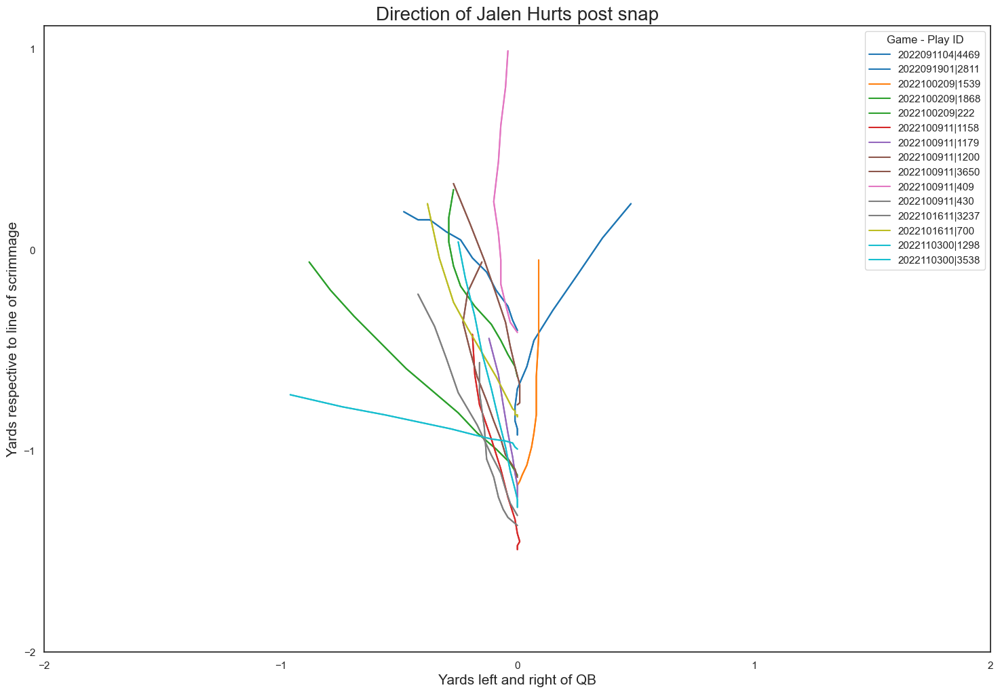

In [711]:
import matplotlib.pyplot as plt
df = jh
# Ensure your 'X_std_true' column is of type float
df['X_std_true'] = df['X_std_true'].astype(float)

# Sort your values
df = df.sort_values(by = ['u_event','position','time'], ascending = [True,True,True])

# Get unique categories
categories = df['u_event'].unique()

# Create a color map
cmap = plt.get_cmap('tab10')
colors = cmap(np.linspace(0, 1, len(categories)))

for i, category in enumerate(categories):
    # Subset to the category
    subset = df[df['u_event'] == category]
    # Make a separate call to plt.plot for each category
    plt.plot(subset['Y_std_true_nml'], subset['X_std_true'], color=colors[i])

for i, category in enumerate(categories):
    # Subset to the category
    subset = df[df['u_event'] == category]
    # Make a separate call to plt.plot for each category and add a label
    plt.plot(subset['Y_std_true_nml'], subset['X_std_true'], color=colors[i], label=category)

# Add a legend after the loop
plt.legend()
plt.legend(title="Game - Play ID")

# Add a title
plt.title("Direction of Jalen Hurts post snap", fontsize=20)

# Add x and y axis labels
plt.xlabel("Yards left and right of QB", fontsize=15)
plt.ylabel("Yards respective to line of scrimmage", fontsize=15)
plt.xticks(range(-2, 3))
plt.yticks(range(-2, 2))
plt.show()

In [715]:
c1 = (jh['u_event'] != '2022100209|1539')
c2 = (jh['frameId'] == 6)
reduced_event_list = jh[c1&c2][['u_event']]
reduced_event_list

,u_event
1939,2022091104|4469
10366,2022091901|2811
22707,2022100209|222
24305,2022100209|1868
31536,2022100911|409
32612,2022100911|430
33398,2022100911|1158
34419,2022100911|1179
35204,2022100911|1200
35844,2022100911|3650


In [736]:
phi_play_only = pd.merge(sneak_tracking,reduced_event_list, how = 'inner', on = ['u_event'])

c2 = (phi_play_only['position'].isin(['T','G','C','QB','DE','DT','NT','OLB']))
c3 = (phi_play_only['frameId'] == 6)
c4 = (phi_play_only['PlayerTeam'] != 'PHI')
c5 = (phi_play_only['player_snap_Y_std_true_nml'] <= 0) # left of center
c6 = (phi_play_only['player_snap_Y_std_true_nml'] >= -2.2) # right of LT
c7 = (phi_play_only['X_std_true'] <= 2) # reasonable within line of scrimmage
results = phi_play_only[c2&c3&c4&c5&c6&c7].groupby(['u_event','club']).agg({'displayName':'nunique','weight':'sum'}).reset_index()
results

,u_event,club,displayName,weight
0,2022091104|4469,DET,2,614.0
1,2022091901|2811,MIN,1,318.0
2,2022100209|1868,JAX,1,294.0
3,2022100209|222,JAX,1,294.0
4,2022100911|1158,ARI,2,623.0
5,2022100911|1179,ARI,2,623.0
6,2022100911|1200,ARI,2,623.0
7,2022100911|3650,ARI,2,541.0
8,2022100911|409,ARI,1,281.0
9,2022100911|430,ARI,2,513.0


In [739]:
phi_play_only[phi_play_only['displayName'] == 'Jalen Hurts'].groupby(['u_event']).agg({'X_std_true':['max'],'frameId':'max'}).reset_index()

,u_event,X_std_true,frameId
,,max,max
0,2022091104|4469,1.28,27
1,2022091901|2811,0.19,28
2,2022100209|1868,0.65,38
3,2022100209|222,2.95,48
4,2022100911|1158,1.18,31
5,2022100911|1179,0.58,53
6,2022100911|1200,1.26,22
7,2022100911|3650,1.26,34
8,2022100911|409,2.30,52


In [742]:
test = pd.merge(all_runs,reduced_event_list, how = 'inner', on = ['u_event'])
test = test[['u_event','playResult']]
test

,u_event,playResult
0,2022101611|700,2
1,2022100209|1868,2
2,2022100911|1158,1
3,2022100209|222,3
4,2022100911|409,2
5,2022100911|3650,1
6,2022110300|3538,1
7,2022091104|4469,1
8,2022110300|1298,2
9,2022091901|2811,2


In [744]:
trialiosis = pd.merge(results,test, how = 'left', on = 'u_event')
trialiosis

,u_event,club,displayName,weight,playResult
0,2022091104|4469,DET,2,614.0,1
1,2022091901|2811,MIN,1,318.0,2
2,2022100209|1868,JAX,1,294.0,2
3,2022100209|222,JAX,1,294.0,3
4,2022100911|1158,ARI,2,623.0,1
5,2022100911|1179,ARI,2,623.0,0
6,2022100911|1200,ARI,2,623.0,1
7,2022100911|3650,ARI,2,541.0,1
8,2022100911|409,ARI,1,281.0,2
9,2022100911|430,ARI,2,513.0,1


<Axes: xlabel='weight', ylabel='playResult'>

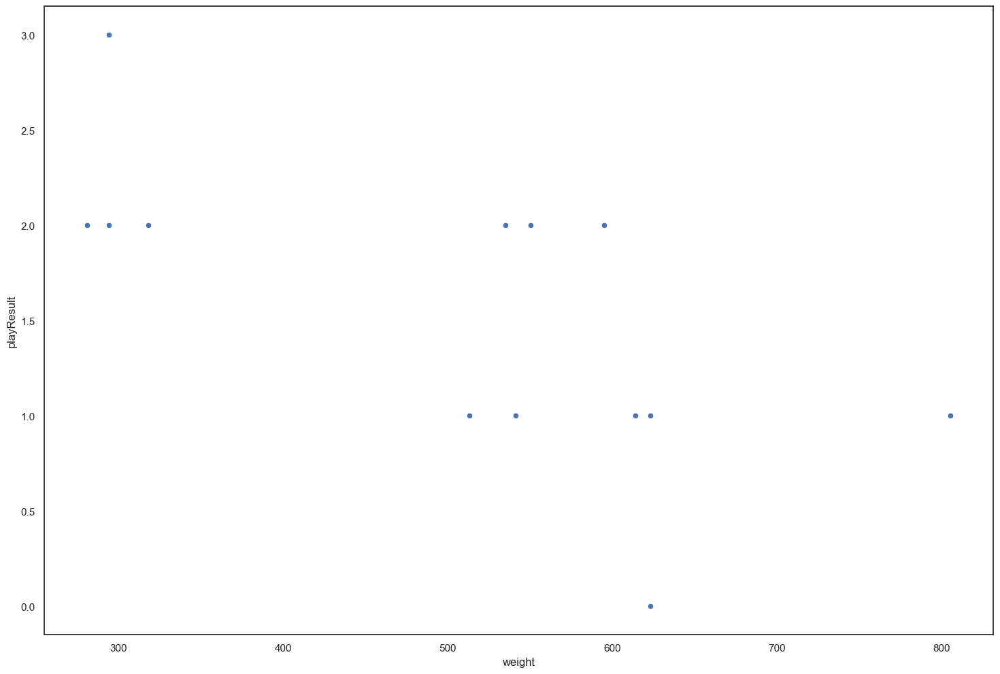

In [745]:
sns.scatterplot(data = trialiosis, x = 'weight', y = 'playResult')

In [746]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

In [747]:
formula = 'playResult ~ weight'
weight_to_result = smf.glm(formula = formula, data = trialiosis, family = sm.families.Gaussian()).fit()
print(weight_to_result.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:             playResult   No. Observations:                   14
Model:                            GLM   Df Residuals:                       12
Model Family:                Gaussian   Df Model:                            1
Link Function:               Identity   Scale:                         0.33676
Method:                          IRLS   Log-Likelihood:                -11.167
Date:                Tue, 09 Jan 2024   Deviance:                       4.0412
Time:                        01:56:08   Pearson chi2:                     4.04
No. Iterations:                     3   Pseudo R-squ. (CS):             0.5252
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      3.1700      0.544      5.831      0.0

In [722]:
results['weight'].mean()

514.9285714285714

# all sneaks direction to weight

In [748]:
c1 = (sneak_tracking['club'] != 'PHI')
c2 = (sneak_tracking['position'].isin(['T','G','C','QB']))

#QB sneak direction
c1 = (sneak_tracking['position'] == 'QB')
c2 = (sneak_tracking['frameId'].isin([6,11]))
c21 = (sneak_tracking['frameId'] == 6)
c22 = (sneak_tracking['frameId'] == 11)

qb_bs = sneak_tracking[c1&c21][['u_event','displayName','Y_std_true_nml','X_std_true']]
qb_5s = sneak_tracking[c1&c22][['u_event','displayName','Y_std_true_nml','X_std_true']]
qb_rd = pd.merge(qb_bs,qb_5s, how = 'left', on  = ['u_event','displayName'])
qb_rd['sneak_direction'] = np.where(qb_rd['Y_std_true_nml_y'] >= 0, 'Right','Left')
qb_rd

,u_event,displayName,Y_std_true_nml_x,X_std_true_x,Y_std_true_nml_y,X_std_true_y,sneak_direction
0,2022091101|2431,Jacoby Brissett,0.0,-1.38,-0.01,-1.39,Left
1,2022091102|3652,Trey Lance,0.0,-0.97,0.10,-0.61,Right
2,2022091104|4469,Jalen Hurts,0.0,-0.92,0.04,-0.58,Right
3,2022091107|3398,Joe Flacco,0.0,-1.06,-0.01,-0.96,Left
4,2022091111|1546,Justin Herbert,0.0,-1.28,-0.03,-0.89,Left
5,2022091200|716,Geno Smith,0.0,-0.48,0.02,-0.48,Right
6,2022091500|699,Justin Herbert,0.0,-0.12,-0.22,0.52,Left
7,2022091800|1688,Tua Tagovailoa,0.0,-1.16,-0.18,-0.89,Left
8,2022091801|2067,Jacoby Brissett,0.0,-0.91,-0.02,-0.55,Left
9,2022091805|3445,Daniel Jones,0.0,-0.68,-0.03,-0.27,Left


In [754]:
all_play_only = pd.merge(sneak_tracking,qb_rd[['u_event','sneak_direction']], how = 'inner', on = ['u_event'])

c2 = (all_play_only['position'].isin(['T','G','C','QB','DE','DT','NT','OLB']))
c3 = (all_play_only['frameId'] == 6)
c4 = (all_play_only['IsOnOffense2'] == 'DEF')
all_results = all_play_only[c2&c3&c4]
all_results['include_player'] = 0

c11 = (all_results['sneak_direction'] == 'Left')
c12 = (all_results['player_snap_Y_std_true_nml'] <= 0) # left of center
c13 = (all_results['player_snap_Y_std_true_nml'] >= -2.2) # right of LT
c14 = (all_results['X_std_true'] <= 2) # reasonable within line of scrimmage

all_results['include_player'] = np.where(c11&c12&c13&c14,1,all_results['include_player'])

c21 = (all_results['sneak_direction'] == 'Right')
c22 = (all_results['player_snap_Y_std_true_nml'] >= 0) # left of center
c23 = (all_results['player_snap_Y_std_true_nml'] <= 2.2) # right of LT
c24 = (all_results['X_std_true'] <= 2) # reasonable within line of scrimmage

all_results['include_player'] = np.where(c21&c22&c23&c24,1,all_results['include_player'])

all_results
#c4 = (phi_play_only['PlayerTeam'] != 'PHI')
#c5 = (phi_play_only['player_snap_Y_std_true_nml'] <= 0) # left of center
#c6 = (phi_play_only['player_snap_Y_std_true_nml'] >= -2.2) # right of LT
#c7 = (phi_play_only['X_std_true'] <= 2) # reasonable within line of scrimmage
#results = phi_play_only[c2&c3&c4&c5&c6&c7].groupby(['u_event','club']).agg({'displayName':'nunique','weight':'sum'}).reset_index()
#results

,gameId,playId,u_event,nflId,displayName,frameId,time,jerseyNumber,club,playDirection,x,y,s,a,dis,o,dir,event,team2,possessionTeam,homeTeamAbbr,visitorTeamAbbr,yardlineNumber,yardlineSide,possessionTeam_alt,PlayerTeam,team,position,weight,Dir_rad,ToLeft,TeamOnOffense,IsOnOffense,YardLine_std,yardlineSide_ha,X_std,Y_std,Dir_std,dx,dy,Orientation_rad,Orientation_std,Orientation_deg_std,Dir_deg_std,MPH,X_std_true,Y_std_true,ball_snap_frameId_x,QB_start_Y_std_true,Y_std_true_nml,ball_snap_frameId_y,player_snap_Y_std_true_nml,player_snap_X_std_true,team3,IsOnOffense2,PN_detail,sneak_direction,include_player
89,2022091101,2431,2022091101|2431,42436.0,Henry Anderson,6,2022-09-11 15:00:15.099999Z,94.0,CAR,right,58.61,19.72,0.04,0.18,0.02,319.54,303.36,ball_snap,CAR,away,CAR,CLE,48,CLE,away,CAR,home,DE,301.0,2.559351,False,home,True,48,away,58.61,19.72,2.559351,-0.03,0.02,2.276957,2.276957,130.46,146.64,0.081818,0.61,19.72,6.0,23.77,4.05,6,4.05,0.61,home,DEF,DE - Henry Anderson,Left,0
341,2022091101,2431,2022091101|2431,47799.0,Brian Burns,6,2022-09-11 15:00:15.099999Z,53.0,CAR,right,59.00,28.62,0.57,1.60,0.06,83.10,235.42,ball_snap,CAR,away,CAR,CLE,48,CLE,away,CAR,home,OLB,250.0,3.745128,False,home,True,48,away,59.00,28.62,3.745128,-0.47,-0.32,0.120428,0.120428,6.90,214.58,1.165909,1.00,28.62,6.0,23.77,-4.85,6,-4.85,1.00,home,DEF,OLB - Brian Burns,Left,0
425,2022091101,2431,2022091101|2431,52592.0,Bravvion Roy,6,2022-09-11 15:00:15.099999Z,93.0,CAR,right,58.81,24.86,0.41,1.96,0.05,263.26,3.85,ball_snap,CAR,away,CAR,CLE,48,CLE,away,CAR,home,DT,333.0,1.503601,False,home,True,48,away,58.81,24.86,1.503601,0.03,0.41,3.259228,3.259228,186.74,86.15,0.838636,0.81,24.86,6.0,23.77,-1.09,6,-1.09,0.81,home,DEF,DT - Bravvion Roy,Left,1
565,2022091101,2431,2022091101|2431,53661.0,Phil Hoskins,6,2022-09-11 15:00:15.099999Z,71.0,CAR,right,58.64,21.80,0.00,0.00,0.04,234.55,0.65,ball_snap,CAR,away,CAR,CLE,48,CLE,away,CAR,home,DT,280.0,1.559452,False,home,True,48,away,58.64,21.80,1.559452,0.00,0.00,3.760312,3.760312,215.45,89.35,0.000000,0.64,21.80,6.0,23.77,1.97,6,1.97,0.64,home,DEF,DT - Phil Hoskins,Left,0
691,2022091102,3652,2022091102|3652,37087.0,Robert Quinn,6,2022-09-11 15:45:02.599999Z,94.0,CHI,right,29.89,27.83,0.02,0.32,0.00,315.27,114.30,ball_snap,CHI,away,CHI,SF,19,SF,away,CHI,home,OLB,257.0,5.859070,False,home,True,19,away,29.89,27.83,5.859070,0.02,-0.01,2.351482,2.351482,134.73,335.70,0.040909,0.89,27.83,6.0,23.69,-4.14,6,-4.14,0.89,home,DEF,OLB - Robert Quinn,Right,0
817,2022091102,3652,2022091102|3652,42443.0,Angelo Blackson,6,2022-09-11 15:45:02.599999Z,90.0,CHI,right,30.09,22.46,0.25,0.26,0.04,271.31,290.27,ball_snap,CHI,away,CHI,SF,19,SF,away,CHI,home,DT,318.0,2.787814,False,home,True,19,away,30.09,22.46,2.787814,-0.23,0.09,3.118729,3.118729,178.69,159.73,0.511364,1.09,22.46,6.0,23.69,1.23,6,1.23,1.09,home,DEF,DT - Angelo Blackson,Right,1
943,2022091102,3652,2022091102|3652,45009.0,Al-Quadin Muhammad,6,2022-09-11 15:45:02.599999Z,55.0,CHI,right,30.45,19.42,0.29,0.17,0.03,252.50,275.60,ball_snap,CHI,away,CHI,SF,19,SF,away,CHI,home,DE,250.0,3.043854,False,home,True,19,away,30.45,19.42,3.043854,-0.29,0.03,3.447025,3.447025,197.50,174.40,0.593182,1.45,19.42,6.0,23.69,4.27,6,4.27,1.45,home,DEF,DE - Al-Quadin Muhammad,Right,0
985,2022091102,3652,2022091102|3652,45345.0,Nicholas Morrow,6,2022-09-11 15:45:02.599999Z,53.0,CHI,right,32.74,25.51,1.15,1.33,0.11,271.63,241.93,ball_snap,CHI,away,CHI,SF,19,SF,away,CHI,home,OLB,225.0,3.631507,False,home,True,19,away,32.74,25.51,3.631507,-1.01,-0.54,3.113144,3.113144,178.37,208.07,2.352272,3.74,25.51,6.0,23.69,-1.82,6,-1.82,3.74,home,DEF,OLB - Nicholas Morrow,Right,0
1111,2022091102,3652,2022091102|3652,46153.0,Justin Jones,6,2022-09-11 15:45:02.599999Z,93.0,CHI,right,29.95,25.44,0.07,0.70,0.03,264.88,175.02,ball_snap,CHI,away,CHI,SF,19,SF,away,CHI,home,DT,309.0,4.799306,False,home,True,19,away,29.95,25.44,4.799306,0.01,-0.07,3.230954,3.230954,185.12,274.98,0.143182,0.95,25.44,6.0,23.69,-1.75,6,-1.75,

In [755]:
trialiosis

,u_event,club,displayName,weight,playResult
0,2022091104|4469,DET,2,614.0,1
1,2022091901|2811,MIN,1,318.0,2
2,2022100209|1868,JAX,1,294.0,2
3,2022100209|222,JAX,1,294.0,3
4,2022100911|1158,ARI,2,623.0,1
5,2022100911|1179,ARI,2,623.0,0
6,2022100911|1200,ARI,2,623.0,1
7,2022100911|3650,ARI,2,541.0,1
8,2022100911|409,ARI,1,281.0,2
9,2022100911|430,ARI,2,513.0,1


In [763]:
all_df = all_results[all_results['include_player'] == 1].groupby(['u_event','club']).agg({'displayName':'nunique','weight':'sum'}).reset_index()
all_df = pd.merge(all_df,all_runs[['u_event','playResult']], how = 'left', on = ['u_event'])
all_df

,u_event,club,displayName,weight,playResult
0,2022091101|2431,CAR,1,333.0,2
1,2022091102|3652,CHI,1,318.0,3
2,2022091104|4469,DET,2,610.0,1
3,2022091107|3398,BAL,1,305.0,0
4,2022091111|1546,LV,2,578.0,0
5,2022091200|716,DEN,1,328.0,0
6,2022091500|699,KC,1,308.0,2
7,2022091800|1688,BAL,1,340.0,1
8,2022091801|2067,NYJ,1,303.0,2
9,2022091805|3445,CAR,1,379.0,3


Text(0, 0.5, 'Yards gained')

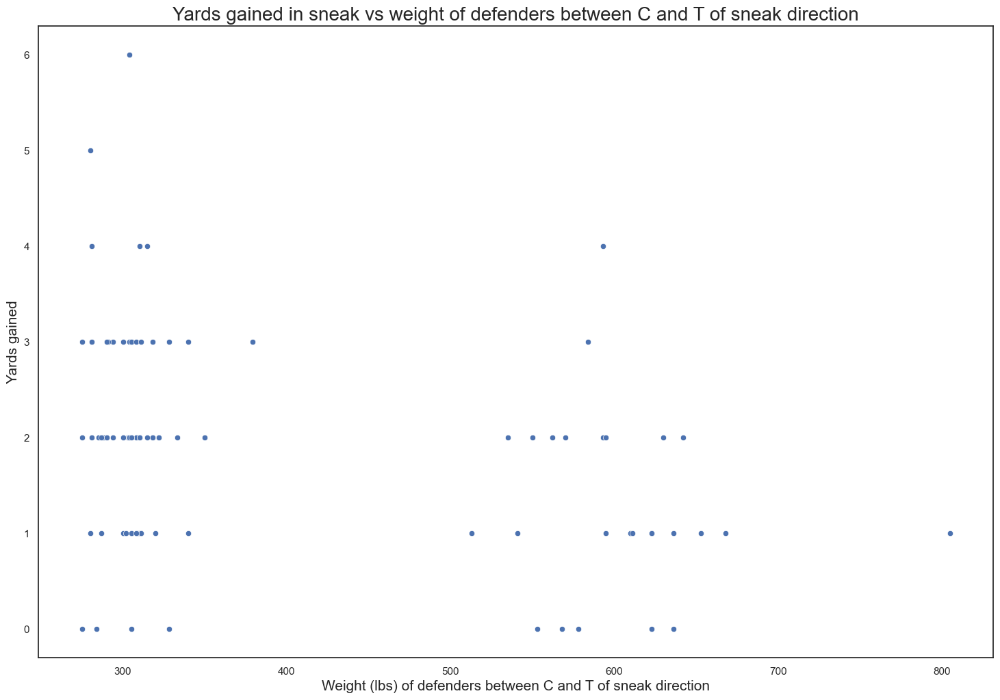

In [772]:
sns.scatterplot(data = all_df[all_df['playResult'] < 14], x = 'weight', y = 'playResult')
plt.title("Yards gained in sneak vs weight of defenders between C and T of sneak direction", fontsize=20)

# Add x and y axis labels
plt.xlabel("Weight (lbs) of defenders between C and T of sneak direction", fontsize=15)
plt.ylabel("Yards gained", fontsize=15)

In [775]:
formula = 'playResult ~ weight'
weight_to_result = smf.glm(formula = formula, data = all_df, family = sm.families.Gaussian()).fit()
print(weight_to_result.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:             playResult   No. Observations:                   91
Model:                            GLM   Df Residuals:                       89
Model Family:                Gaussian   Df Model:                            1
Link Function:               Identity   Scale:                          2.7596
Method:                          IRLS   Log-Likelihood:                -174.30
Date:                Tue, 09 Jan 2024   Deviance:                       245.60
Time:                        02:26:37   Pearson chi2:                     246.
No. Iterations:                     3   Pseudo R-squ. (CS):            0.06712
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      3.2384      0.519      6.239      0.0

In [768]:
print(3.2384/0.0031

1044.6451612903227


In [762]:
all_df[all_df['u_event'] == '2022110300|1298']

,u_event,club,displayName,weight
76,2022110300|1298,HOU,2,595.0
